# JAMFitter

In [1]:
import os,sys
import threading
import copy
import numpy as np
import pandas as pd
import time
from mpmath import fp

from scipy.integrate import quad,fixed_quad
from scipy.special import jv, zeta
from scipy import interpolate
from scipy.optimize import leastsq,least_squares

import types

from timeit import time

#--matplotlib
import matplotlib
matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
matplotlib.rc('text',usetex=True)
import pylab as py
import matplotlib.gridspec as gridspec


#--jupyter widgets
from IPython import display
import ipywidgets as widgets

#--other
import subprocess
import shutil

#--jit
from numba import jit

<ipython-input-1-ed5b6ac3170f>:20: MatplotlibDeprecationWarning: Support for setting an rcParam that expects a str value to a non-str value is deprecated since 3.5 and support will be removed two minor releases later.
  matplotlib.rcParams['text.latex.preamble']=[r"\usepackage{amsmath}"]
Matplotlib created a temporary config/cache directory at /tmp/matplotlib-r_8fx3my because the default path (/home/jovyan/.cache/matplotlib) is not a writable directory; it is highly recommended to set the MPLCONFIGDIR environment variable to a writable directory, in particular to speed up the import of Matplotlib and to better support multiprocessing.


In [2]:
path = '/work/JAM/barryp/JAM/fitpack2/'
sys.path.insert(0, path)
os.environ['FITPACK']=path
#os.environ["PATH"]='/work/JAM/apps/bin:'+os.environ["PATH"]

In [3]:
os.environ['FITPACK']='/work/JAM/barryp/JAM/fitpack2testing/'
os.environ['LHAPDF_DATA_PATH']='/work/JAM/apps/lhapdf_tables/'
os.environ['LHAPDF_DATA_PATH']='/work/JAM/barryp/misc/:'+os.environ['LHAPDF_DATA_PATH']
os.environ['LHAPDF_DATA_PATH']='/work/JAM/apps/lhapdf_tables/more/more1:'+os.environ['LHAPDF_DATA_PATH']
os.environ["PATH"]='/work/JAM/apps/bin:'+os.environ["PATH"]

In [4]:
from tools.tools import load, save, checkdir,lprint,id_generator,gen_code,send_command
from tools.config import conf, load_config, load_config2
from qcdlib.aux import AUX
from qcdlib.eweak import EWEAK
from qcdlib.alphaS import ALPHAS
from fitlib.resman import RESMAN
from fitlib.parman import PARMAN
from analysis.corelib import core

## Tools

In [5]:
def jobstat(stop=True,t=30):
    while 1:
        print(send_command('squeue -u barryp'))
        display.clear_output(wait=True)
        if stop==True: break
        time.sleep(t)

#@jit(nopython=True)
def set_active_params(active_list):
    for _ in active_list:
        for param in conf['params'][_]:
            if conf['params'][_][param]['min']!=None:
                conf['params'][_][param]['fixed'] = False

#@jit(nopython=True)
def get_samples(wdir,active_list=[]):
    load_config2('%s/input.npy'%wdir)
    resman=RESMAN(parallel=False,datasets=False)
    parman=resman.parman
    
    samples=[]
    mcrun=os.listdir('%s/mcrun'%wdir)
    cnt=0
    for fname in mcrun:
        cnt+=1
        lprint('retrieving samples %d/%d'%(cnt,len(mcrun)))
        data=np.load('%s/mcrun/%s'%(wdir,fname),allow_pickle=True).item(0)
        conf['params']  =data['params']
        conf['datasets']=data['datasets']
        set_active_params(active_list)
        
        parman.get_ordered_free_params()
        samples.append(parman.par)
    checkdir('%s/data'%wdir)
    np.save('%s/data/samples'%wdir,np.array(samples))
    return np.array(samples)


## Calculations

In [6]:
# @jit(nopython=True)
def gen_red_chi2(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True) #--attempting parallel=True
    parman=resman.parman
    red_chi2=[]
    cnt=0
#     sampleflag=[]
    for i in range(len(samples)):
        par=samples[i]
        cnt+=1
        lprint('computing red chi2 %d/%d'%(cnt,len(samples)))
        res,rres,nres=resman.get_residuals(par)
#         if np.sum(res**2)/res.size>10:
#             sampleflag.append(0)
#             continue
#         else: sampleflag.append(1)
        red_chi2.append(np.sum(res**2)/res.size)
#     checkdir('%s/mcrun_good'%wdir)
#     for i in range(len(os.listdir('%s/mcrun'%wdir))):
#         if sampleflag[i]==1:
#             cmd=['cp']
#             cmd.append('%s/mcrun/%s'%(wdir,os.listdir('%s/mcrun'%wdir)[i]))
#             cmd.append('%s/mcrun_good/%s'%(wdir,os.listdir('%s/mcrun'%wdir)[i]))
#             p=subprocess.Popen(cmd,stdout=subprocess.PIPE)        
#     shutil.rmtree('%s/mcrun'%wdir)
#     cmd=['mv']
#     cmd.append('%s/mcrun_good'%wdir)
#     cmd.append('%s/mcrun'%wdir)
#     p=subprocess.Popen(cmd,stdout=subprocess.PIPE)
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/red_chi2'%wdir,np.array(red_chi2))
    return np.array(red_chi2)

# @jit(nopython=True)
def gen_mean_chi2(wdir,data,samples):
    
    chi2={}
    
    for k in data:
        chi2[k]={}
        for kk in data[k]:
            chi2[k][kk]={}
            p=data[k][kk]
            res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
            chi2[k][kk]['npts']=len(res)
            chi2[k][kk]['chi2']=np.sum(res**2)
                
    chi2['total']={}
    chi2['total']['chi2']=0
    chi2['total']['npts']=0
    for k in chi2:
        if k=='total': continue
        for kk in chi2[k]:
            chi2['total']['chi2']+=chi2[k][kk]['chi2']
            chi2['total']['npts']+=chi2[k][kk]['npts']
            
    print(len(samples[0]))
    chi2['dof']=chi2['total']['npts']-len(samples[0])
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/chi2'%wdir,chi2)
    return chi2
    
# @jit(nopython=True)
def gen_predictions(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    obsres={}
    if 'dy-pion' in conf['datasets']: obsres['dy-pion']=resman.dy_pion_res
    if 'ln' in conf['datasets']: obsres['ln']=resman.ln_res
    if 'ccLCS' in conf['datasets']: obsres['ccLCS']=resman.ccLCS_res
    
    data={}
    
    for _ in obsres:
        tabs=copy.copy(obsres[_].tabs)
        for idx in tabs:
            tabs[idx]['prediction-rep']=[]
        data[_]=tabs
    
    cnt=0
    for par in samples:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samples)))
        res,rres,nres=resman.get_residuals(par,initial=True)

        for _ in obsres:
            for idx in data[_]:
                prediction=copy.copy(obsres[_].tabs[idx]['prediction'])
                data[_][idx]['prediction-rep'].append(prediction)
                
    checkdir('%s/data'%wdir)
    np.save('%s/data/predictions'%wdir,data)
    return data

def gen_predictions_nosys(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman
    
    samplesmod=[]
    for i in range(len(samples)):
        samplesmod.append([])
        for j in range(len(parman.order)):
            if parman.order[j][1]=='lat-sys': continue
            samplesmod[i].append(samples[i][j])
    samplesmod=np.array(samplesmod)
    
    for k in conf['params']:
        for kk in conf['params'][k]:
            if k=='lat-sys':
                conf['params'][k][kk]={'value':0.0,'min':-0.1,'max':0.1,'fixed':True}
                
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman
    
    obsres={}
#     if 'dy-pion' in conf['datasets']: obsres['dy-pion']=resman.dy_pion_res
#     if 'ln' in conf['datasets']: obsres['ln']=resman.ln_res
    if 'ccLCS' in conf['datasets']: obsres['ccLCS']=resman.ccLCS_res
    
    data={}
    
    for _ in obsres:
        tabs=copy.copy(obsres[_].tabs)
        for idx in tabs:
            tabs[idx]['prediction-rep']=[]
        data[_]=tabs
    
    cnt=0
    for par in samplesmod:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samplesmod)))
        res,rres,nres=resman.get_residuals(par,initial=True)

        for _ in obsres:
            for idx in data[_]:
                prediction=copy.copy(obsres[_].tabs[idx]['prediction'])
                data[_][idx]['prediction-rep'].append(prediction)
                
    checkdir('%s/data'%wdir)
    np.save('%s/data/predictions_nosys'%wdir,data)
    return data

def gen_red_chi2_predictions(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True) #--attempting parallel=True
    parman=resman.parman
    
    obsres={}
    if 'dy-pion' in conf['datasets']: obsres['dy-pion']=resman.dy_pion_res
    if 'ln' in conf['datasets']: obsres['ln']=resman.ln_res
    if 'ccLCS' in conf['datasets']: obsres['ccLCS']=resman.ccLCS_res
    
    pred={}
    
    for _ in obsres:
        tabs=copy.copy(obsres[_].tabs)
        for idx in tabs:
            tabs[idx]['prediction-rep']=[]
        pred[_]=tabs
    
    red_chi2=[]
    cnt=0
    for i in range(len(samples)):
        par=samples[i]
        cnt+=1
        lprint('computing red chi2 %d/%d'%(cnt,len(samples)))
        res,rres,nres=resman.get_residuals(par)
        red_chi2.append(np.sum(res**2)/res.size)
        for _ in obsres:
            for idx in pred[_]:
                prediction=copy.copy(obsres[_].tabs[idx]['prediction'])
                pred[_][idx]['prediction-rep'].append(prediction)
                
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/red_chi2'%wdir,np.array(red_chi2))
    np.save('%s/data/predictions'%wdir,pred)
    return np.array(red_chi2),pred


def gen_pdf(wdir,samples,inputfile,active_list=[],Q2=None):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=False,datasets=False)
    parman=resman.parman
    
    pdf=conf['pdf-pion']

    if Q2==None: Q2=conf['Q20']
    X=10**np.linspace(-3,-1,200)
    X=np.append(X,np.linspace(0.1,1,200))
    XF={}

    cnt=0
    for par in samples:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samples)))

        parman.set_new_params(par)

        for flav in ['valence','sea','g']:
            if flav not in XF: XF[flav]=[]

            if flav=='valence':
                func=lambda x: pdf.get_xF(x,Q2,'ub')-pdf.get_xF(x,Q2,'u')
            elif flav=='sea':
                func=lambda x: pdf.get_xF(x,Q2,'u')
            else:
                func=lambda x: pdf.get_xF(x,Q2,'g')

            XF[flav].append([func(x) for x in X])

    data={'X':X,'Q2':Q2,'XF':XF}
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/pdf'%(wdir),data)
    return data

def gen_pdf_mom(wdir,samples,inputfile,active_list=[],Q2=None):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=False,datasets=False)
    parman=resman.parman
    
    pdf=conf['pdf-pion']

    if Q2==None: Q2=conf['Q20']
#     X=10**np.linspace(-3,-1,200)
#     X=np.append(X,np.linspace(0.1,1,200))
    moms={}

    cnt=0
    for par in samples:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samples)))

        parman.set_new_params(par)

        for flav in ['valence','sea','g']:
            if flav not in moms: moms[flav]=[]

            if flav=='valence':
                func=lambda x: 2*(pdf.get_xF(x,Q2,'ub')-pdf.get_xF(x,Q2,'u'))
            elif flav=='sea':
                func=lambda x: 6*pdf.get_xF(x,Q2,'u')
            else:
                func=lambda x: pdf.get_xF(x,Q2,'g')

            moms[flav].append(quad(lambda x: func(x),0,1)[0])

#     data={'X':X,'Q2':Q2,'XF':XF}
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/pdfmoms'%(wdir),moms)
    return moms


## book keeping class

In [7]:
class BOOK:
    
    def __init__(self,wdir,input_file,active_list=[]):
        self.input_file=input_file
        self.active_list=active_list
        checkdir('%s/data'%wdir)
        
        if 'samples.npy' not in os.listdir('%s/data'%wdir):
            self.samples=get_samples(wdir,self.active_list)
        else:
            self.samples=np.load('%s/data/samples.npy'%wdir)
        if 'red_chi2.npy' not in os.listdir('%s/data'%wdir): 
#             self.setup(wdir)
            self.red_chi2,self.predictions=gen_red_chi2_predictions(wdir,self.samples,self.input_file,self.active_list)
        else:
            self.red_chi2=np.load('%s/data/red_chi2.npy'%wdir)
            self.predictions=np.load('%s/data/predictions.npy'%wdir,allow_pickle=True).item(0)
            
#         self.samples=np.load('%s/data/samples.npy'%wdir)
#         if 'predictions.npy' in os.listdir('%s/data'%wdir):
#             self.predictions=np.load('%s/data/predictions.npy'%wdir,allow_pickle=True).item(0)
#         else: 
#             self.predictions=gen_predictions(wdir,self.samples,self.input_file,self.active_list)

        if 'predictions_nosys.npy' in os.listdir('%s/data'%wdir):
            self.predictions_nosys=np.load('%s/data/predictions_nosys.npy'%wdir,allow_pickle=True).item(0)
        else: 
            self.predictions_nosys=gen_predictions_nosys(wdir,self.samples,self.input_file,self.active_list)
            
        if 'chi2.npy' not in os.listdir('%s/data'%wdir):
            self.chi2=gen_mean_chi2(wdir,self.predictions,self.samples)
        else:
            self.chi2=np.load('%s/data/chi2.npy'%wdir,allow_pickle=True).item(0)
                
        if 'pdf.npy' in os.listdir('%s/data'%wdir):
            self.pdfs=np.load('%s/data/pdf.npy'%wdir,allow_pickle=True).item(0)
        else:
            self.pdfs=gen_pdf(wdir,self.samples,self.input_file,self.active_list)
            
        if 'pdfmoms.npy' in os.listdir('%s/data'%wdir):
            self.pdfmoms=np.load('%s/data/pdfmoms.npy'%wdir,allow_pickle=True).item(0)
        else:
            self.pdfmoms=gen_pdf_mom(wdir,self.samples,self.input_file,self.active_list)

#     def setup(self,wdir):

#         self.samples=get_samples(wdir,self.active_list)
        
#         self.red_chi2=gen_red_chi2(wdir,self.samples,self.input_file,self.active_list)
#         time.sleep(3)
#         self.samples=get_samples(wdir,self.active_list)


## Plotting routines

In [8]:
def plot_chi2(wdir,data):
    nrows,ncols=1,1
    fig = py.figure(figsize=(ncols*7,nrows*5))
    ax=py.subplot(nrows,ncols,1)
    ax.hist(data,bins=20);
    ax.tick_params(axis='both', which='both', labelsize=15,direction='in')
    ax.set_xlabel(r'$\chi^2_{\rm red}$',size=30);
    ax.set_ylabel(r'$\rm yield$',size=30);
    
    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/chi2.png'%wdir)
    
       
def plot_data_over_theory(wdir,data,expt):
    
    tab=copy.deepcopy(data['ccLCS'][expt])
    zunique=np.unique(tab['ZoA'])
    nrows=1
    ncols=len(zunique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    for i in range(len(zunique)):
        cnt+=1
        theory=np.mean(p['prediction-rep'],axis=0)
        dtheory=np.std(p['prediction-rep'],axis=0)
        nu=[]
        vals=[]
        alphas=[]
        meanthy=[]
        stdthy=[]
        for j in range(len(p['N'])):
            if p['ZoA'][j]==zunique[i]:
                nu.append(p['nu'][j])
                vals.append(p['value'][j])
                alphas.append(p['alpha'][j])
                meanthy.append(theory[j])
                stdthy.append(dtheory[j])
        nu=np.array(nu)
        vals=np.array(vals)
        alphas=np.array(alphas)
        meanthy=np.array(meanthy)
        stdthy=np.array(stdthy)
        if len(nu)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.errorbar(nu,vals/meanthy,yerr=alphas/meanthy,fmt='.',c='k',label=r'$z=%i a$'%zunique[i])
        ax.axhline(y=1,color='k',alpha=0.5)
        ax.fill_between(nu,1-stdthy/meanthy,1+stdthy/meanthy,alpha=0.3,fc='y')
#         ax.set_ylim(0.99,1.01)
#         ax.set_yticks([0.99,0.995,1,1.005,1.01])
#         if i==0:
#             ax.set_yticklabels([r'$0.99$','',r'$1$','',r'$1.01$'])
#         else: ax.set_yticklabels([])
        ax.tick_params(direction='in',which='both',labelsize=20)
        if i==0: ax.set_ylabel(r'${\rm data~/~theory}$',size=30)
        ax.legend(fontsize=25,loc='upper left')#,frameon=False)
        ax.set_xlabel(r'$\nu$',size=30)
#         if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
#         if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
        ax.set_ylim(0.7,1.3)
        ax.set_yticks([0.7,0.8,0.9,1,1.1,1.2,1.3])
        ax.set_yticklabels(['',r'$0.8$','',r'$1$','',r'$1.2$',''])
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_ccLCS-%s.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_ccLCS-%s.pdf'%(wdir,expt))

def plot_data_and_theory(wdir,data,expt):
    
    tab=copy.deepcopy(data['ccLCS'][expt])
    zunique=np.unique(tab['ZoA'])
    nrows=1
    ncols=len(zunique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    for i in range(len(zunique)):
        cnt+=1
        theory=np.mean(p['prediction-rep'],axis=0)
        dtheory=np.std(p['prediction-rep'],axis=0)
        nu=[]
        vals=[]
        alphas=[]
        meanthy=[]
        stdthy=[]
        for j in range(len(p['N'])):
            if p['ZoA'][j]==zunique[i]:
                nu.append(p['nu'][j])
                vals.append(p['value'][j])
                alphas.append(p['alpha'][j])
                meanthy.append(theory[j])
                stdthy.append(dtheory[j])
        nu=np.array(nu)
        vals=np.array(vals)
        alphas=np.array(alphas)
        meanthy=np.array(meanthy)
        stdthy=np.array(stdthy)
        if len(nu)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.errorbar(nu,vals,yerr=alphas,fmt='.',c='k',label=r'$z=%i a$'%zunique[i])
        ax.fill_between(nu,meanthy-stdthy,meanthy+stdthy,alpha=0.3,fc='y')
        ax.tick_params(direction='in',which='both',labelsize=20)
        ax.legend(fontsize=25,loc='upper left')#,frameon=False)
        ax.set_xlabel(r'$\nu$',size=30)
        if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
        if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_and_theory_ccLCS-%s.png'%(wdir,expt))
    
def plot_correlations(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    
    cov=np.zeros((len(parmean),len(parmean)))
    for i in range(len(parmean)):
        for j in range(len(parmean)):
            for k in range(len(samples)):
                cov[i][j]+=(samples[k][i]-parmean[i])*(samples[k][j]-parmean[j])
    cov/=(len(samples)-1)
    
    correlation=np.zeros(cov.shape)
    for i in range(len(correlation)):
        for j in range(len(correlation[i])):
            correlation[i][j]=cov[i][j]/(cov[i][i]*cov[j][j])**0.5
            
    order=parman.order
    
    nrows,ncols=1,1
    py.figure(figsize=(10*ncols,10*nrows))
    ax=py.subplot(nrows,ncols,1)

    labs=[]
    for i in range(len(order)):
        if order[i][1]=='pdf-pion':
            parname=order[i][2][-1]
            if 'ubv' in order[i][2]:
                labs.append(r'$\bar{u}_{v,%s}$'%parname)
            else:
                parton=order[i][2][0]
                labs.append(r'$%s_{%s}$'%(parton,parname))
        elif 'lambda'==order[i][2]:
            labs.append(r'$\Lambda$')
        elif 'lat-sys'==order[i][1]:
            parname=order[i][2][0]
            power=order[i][2][1]
            labs.append(r'$%s_{%s}$'%(parname,power))
        elif order[i][0]==2:
            expt=order[i][2]
            labs.append(r'$N_{%i}$'%expt)
            
            
    lines=[]
    normflag=False
    for i in range(len(order)-1):
        if order[i][0]==1:
            if str(order[i][2]).split(' ')[0]!=str(order[i+1][2]).split(' ')[0]:
                if order[i][1]!='lat-sys':
                    lines.append(True)
                else: lines.append(False)
            else: lines.append(False)
        elif order[i][0]==2 and normflag==False:
            lines[-1]=True
            lines.append(False)
            normflag=True
        else: lines.append(False)
    lines.append(False)

    im=ax.imshow(correlation,cmap='Spectral')
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.tick_params(labelsize=20) 
    im.set_clim(-1,1)
    ax.set_xticks(range(len(order)))
    ax.set_xticklabels(labs,size=20)
    ax.set_yticks(range(len(order)))
    ax.set_yticklabels(labs,size=20)
    ax.tick_params(direction='out',which='both',axis='both',labelsize=20)
    for i in range(len(lines)):
        if lines[i]==True:
            ax.axhline(y=i+0.5,c='k')
            ax.axvline(x=i+0.5,c='k')

    
    py.tight_layout()            
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/correlations.png'%wdir)

    
def plot_histograms(wdir,samples,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    
    for i in range(len(order)):
        lprint('progress: %i/%i'%(i+1,len(order)))
        nrows,ncols=1,1
        py.figure(figsize=(6*ncols,5*nrows))
        ax=py.subplot(nrows,ncols,1)

        if order[i][1]=='pdf-pion':
            parname=order[i][2][-1]
            if 'ubv' in order[i][2]:
                title=r'$\bar{u}_{v,%s}$'%parname
            else:
                parton=order[i][2][0]
                title=r'$%s_{%s}$'%(parton,parname)
        elif 'lambda'==order[i][2]:
            title=r'$\Lambda$'
        elif 'lat-sys'==order[i][1]:
            parname=order[i][2][0]
            power=order[i][2][1]
            title=r'$%s_{%s}$'%(parname,power)
        elif order[i][0]==2:
            expt=order[i][2]
            title=r'$N_{%i}$'%expt

        par=[]
        for j in range(len(samples)):
            par.append(samples[j][i])

        par=np.array(par)

        ax.hist(par,bins=25)
        ax.axvline(x=parmean[i],ls=':')
        ax.tick_params(direction='in',which='both',labelsize=20)
        ax.set_title(title,size=30)

        py.tight_layout()
        checkdir('%s/gallery/histogram'%wdir)
        py.savefig('%s/gallery/histogram/%s.png'%(wdir,order[i][2]))


## MCRUN -- Loop over

In [9]:
#--create main and template

main="""
import sys,os
import numpy as np
path = "/work/JAM/barryp/JAM/fitpack2testing/"
sys.path.insert(0, path)
os.environ['FITPACK']=path

from tools.config import conf,load_config2
from tools.tools  import load, save, checkdir
from fitlib.maxlike import MAXLIKE

conf['verbose']   = 100
conf['bootstrap'] = True
conf['ftol']      = 1e-8

load_config2("analysis-LCS/%s/%s/input.npy"%(sys.argv[3],sys.argv[2]))

data=np.load("analysis-LCS/ccLCS/DM_B_R/mcrun/%s"%sys.argv[1],allow_pickle=True).item(0)
#--parameters from numpy data
for k in conf['params']:
    if k in data['params']:
        for kk in conf['params'][k]:
             if kk in data['params'][k]:
                conf['params'][k][kk]['value']=data['params'][k][kk]['value']


#--normalizations from numpy data
for k in conf['datasets']:
    if k in data['datasets']:
        for kk in conf['datasets'][k]['norm']:
            if kk in data['datasets'][k]['norm']:
                conf['datasets'][k]['norm'][kk]['value']=data['datasets'][k]['norm'][kk]['value']

#data=load("/work/JAM/barryp/Notebooks-Jupyterhub/doublemellincopy/step18pos/msr-inspected/%s"%sys.argv[1]) #--for prior distributions
##--parameters
#for k in conf['params']:
#    for kk in conf['params'][k]:
#        for i in range(len(data['order'][10])):
#            if data['order'][10][i][1]=='pdf' and data['order'][10][i][2]==kk:
#                conf['params'][k][kk]['value']=data['params'][10][i]
#        for i in range(len(data['order'][18])):
#            if data['order'][18][i][0]==1:
#                if data['order'][18][i][1]==k and data['order'][18][i][2]==kk:
#                    conf['params'][k][kk]['value']=data['params'][18][i]
#                    print(data['order'][18][i],data['params'][18][i])
##--normalizations
#for k in conf['datasets']:
#    for kk in conf['datasets'][k]['norm']:
#        for i in range(len(data['order'][18])):
#            if data['order'][18][i][0]==2:
#                if data['order'][18][i][1]==k and data['order'][18][i][2]==kk:
#                    conf['datasets'][k]['norm'][kk]['value']=data['params'][18][i]


ml=MAXLIKE(verbose=500)
ml.run2()

data={"params":conf["params"],"datasets":conf["datasets"]}
checkdir("analysis-LCS/%s/%s/mcrun"%(sys.argv[3],sys.argv[2]))
np.save("analysis-LCS/%s/%s/mcrun/%s"%(sys.argv[3],sys.argv[2],sys.argv[1]),data)
"""

template="""#!/bin/csh
#SBATCH --account=jam
#SBATCH --nodes 1
#SBATCH --partition=production
#SBATCH --cpus-per-task 5
#SBATCH --mem=1G
#SBATCH --time=20:00:00
#SBATCH --constraint=general
#SBATCH --job-name="<observable> <pathname>"
#SBATCH --output=/farm_out/barryp/analysis-LCS/<observable>/<pathname>/out/<fname>.out
#SBATCH --error=/farm_out/barryp/analysis-LCS/<observable>/<pathname>/out/<fname>.err
/home/barryp/.conda/envs/pb3/bin/python  main.py <fname> <pathname> <observable> 
"""

In [11]:
# name='stat_u_50percent'
# name='stat_u_90percent'
# name='stat_u_10percent'
# name='stat_u_80percent'
# name='stat_u_70percent'
# name='stat_u_60percent'
# name='P0P1P2'
# name='DMgood_stat_u_50'
# name='DM_cut'
# name='DM_expt_only'
# name='FV-larger_range'
# name='DM-all_sys'
# name='DM_nosmall'
# name='FV-huge_range'
# name='DM_no_a94m358'
# name='cut_smallz_noa127'
# name = 'DM_F_B_R_M_P'
name = 'impact'

#--fitting setups
conf['bootstrap']=True
conf['flat par']=True
conf['ftol']=1e-8

#--setups for DGLAP
conf['dglap mode']='truncated'
conf['alphaSmode']='backward'
conf['order'] = 'NLO'
conf['Q20']   = 1.27**2

#--setup for LN
conf['ln mode']='model'
conf['SPLFUNC model']='IMF exp'

#--setup for LCS
#--0: mu**2=(2GeV)**2, 1: mu**2=(4GeV)**2, 2: mu**2=conf['Q20'], type(conf['LCS scale'])!=int: mu=conf['LCS scale']*mc
conf['LCS scale']=0

#--setup for resummation
conf['pion resummation']=True
conf['MP method']='double mellin'
conf['Cq']='exponential'

#--grids

conf['path2idistab']   = '%s/grids/grids-idis/distab/'%os.environ['FITPACK']

#--datasets

conf['datasets']={}

##--LN
conf['datasets']['ln']={}
conf['datasets']['ln']['filters']=[]
conf['datasets']['ln']['filters'].append("y<0.2") 
conf['datasets']['ln']['xlsx']={}
conf['datasets']['ln']['xlsx'][1000]='ln/expdata/1000.xlsx' 
conf['datasets']['ln']['xlsx'][2000]='ln/expdata/2000.xlsx' 
conf['datasets']['ln']['norm']={}
conf['datasets']['ln']['norm'][1000]={'value':    1.170,'fixed':False,'min':0.5,'max':1.5}
conf['datasets']['ln']['norm'][2000]={'value':    0.964,'fixed':False,'min':0.5,'max':1.5}

##--DY-pion
conf['datasets']['dy-pion']={}
conf['datasets']['dy-pion']['filters']=[]
conf['datasets']['dy-pion']['filters'].append("Q2>4.16**2")
#conf['datasets']['dy-pion']['filters'].append("Q2<8.34**2")
conf['datasets']['dy-pion']['filters'].append("Q2<59.0")
conf['datasets']['dy-pion']['filters'].append("xF>0") 
conf['datasets']['dy-pion']['filters'].append("xF<0.9") 
conf['datasets']['dy-pion']['xlsx']={}
conf['datasets']['dy-pion']['xlsx'][10001]='dy-pion/expdata/10001.xlsx'
conf['datasets']['dy-pion']['xlsx'][10002]='dy-pion/expdata/10002.xlsx'
conf['datasets']['dy-pion']['xlsx'][10003]='dy-pion/expdata/10003.xlsx'
conf['datasets']['dy-pion']['norm']={}
conf['datasets']['dy-pion']['norm'][10001]={'value':    1.047,'fixed':False,'min':   0.5,'max':    1.5}
conf['datasets']['dy-pion']['norm'][10002]={'value':    0.867,'fixed':False,'min':   0.5,'max':    1.5}
conf['datasets']['dy-pion']['norm'][10003]={'value':    0.805,'fixed':False,'min':   0.5,'max':    1.5}

##--current-current LCS lattice
#--a "0" at the end of the dataset index indicates the resummation version
conf['datasets']['ccLCS']={}
conf['datasets']['ccLCS']['filters']=[]
# conf['datasets']['ccLCS']['filters'].append("ZoA>2.5")
# conf['datasets']['ccLCS']['filters'].append("z<0.5")
## conf['datasets']['ccLCS']['filters'].append("mom<1.6")
conf['datasets']['ccLCS']['xlsx']={}
# conf['datasets']['ccLCS']['xlsx'][12781]='current-current-pion/expdata/12781.xlsx' #--a=0.094,mpi=278,L=32
# conf['datasets']['ccLCS']['xlsx'][13581]='current-current-pion/expdata/13581.xlsx' #--a=0.094,mpi=358,L=32
# conf['datasets']['ccLCS']['xlsx'][14131]='current-current-pion/expdata/14131.xlsx' #--a=0.127,mpi=413,L=32
# conf['datasets']['ccLCS']['xlsx'][14132]='current-current-pion/expdata/14132.xlsx' #--a=0.127,mpi=413,L=24
conf['datasets']['ccLCS']['xlsx'][327811]='current-current-pion/expdata/327811.xlsx' #--a=0.094,mpi=278,L=32
conf['datasets']['ccLCS']['xlsx'][335811]='current-current-pion/expdata/335811.xlsx' #--a=0.094,mpi=358,L=32
conf['datasets']['ccLCS']['xlsx'][341311]='current-current-pion/expdata/341311.xlsx' #--a=0.127,mpi=413,L=32
conf['datasets']['ccLCS']['xlsx'][341321]='current-current-pion/expdata/341321.xlsx' #--a=0.127,mpi=413,L=24

conf['datasets']['ccLCS']['norm']={}


#--parameters
conf['params']={}

#--pdf parameters

conf['pdf parametrization']=2
conf['qpdf on']=False
conf['params']['pdf']={}

conf['params']['pdf']['g1 N']    ={'value':    3.87592e-01, 'min':  None, 'max':  None, 'fixed': True }
conf['params']['pdf']['g1 a']    ={'value':   -6.23068169e-01, 'min':  -1.9, 'max':     1, 'fixed': True}
conf['params']['pdf']['g1 b']    ={'value':    9.25741583e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['uv1 N']   ={'value':    3.47549e-01, 'min':  None, 'max':  None, 'fixed': True }
conf['params']['pdf']['uv1 a']   ={'value':   -1.21835956e-01, 'min':  -0.5, 'max':     1, 'fixed': True}
conf['params']['pdf']['uv1 b']   ={'value':    3.20766744e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['dv1 N']   ={'value':    1.52089e-01, 'min':  None, 'max':  None, 'fixed': True }
conf['params']['pdf']['dv1 a']   ={'value':   -2.39874967e-01, 'min':  -0.5, 'max':     1, 'fixed': True}
conf['params']['pdf']['dv1 b']   ={'value':    3.83902620e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['db1 N']   ={'value':    3.67609928e-02, 'min':     0, 'max':     1, 'fixed': True}
conf['params']['pdf']['db1 a']   ={'value':   -8.41360631e-01, 'min':    -1, 'max':     1, 'fixed': True}
conf['params']['pdf']['db1 b']   ={'value':    5.31285539e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['ub1 N']   ={'value':    1.95464789e-02, 'min':     0, 'max':     1, 'fixed': True}
conf['params']['pdf']['ub1 a']   ={'value':    -9.93659187e-01, 'min':    -1, 'max':     1, 'fixed': True}
conf['params']['pdf']['ub1 b']   ={'value':    8.38905814e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['s1 N']    ={'value':    0.00000e+00, 'min':     0, 'max':     1, 'fixed': True }
conf['params']['pdf']['s1 a']    ={'value':   1.34706224e-01, 'min':  -0.5, 'max':     1, 'fixed': True}
conf['params']['pdf']['s1 b']    ={'value':    6.00759596e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['sb1 N']   ={'value':    7.46109845e-07, 'min':     0, 'max':     1, 'fixed': True}
conf['params']['pdf']['sb1 a']   ={'value':   3.83495317e-01, 'min':  -0.5, 'max':     1, 'fixed': True}
conf['params']['pdf']['sb1 b']   ={'value':    4.61209808e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['sea1 N']  ={'value':    5.71081196e-03, 'min':     0, 'max':     1, 'fixed': True}
conf['params']['pdf']['sea1 a']  ={'value':   -1.36329697e+00, 'min':  -1.9, 'max':    -1, 'fixed': True}
conf['params']['pdf']['sea1 b']  ={'value':    4.74721050e+00, 'min':     0, 'max':    10, 'fixed': True}

conf['params']['pdf']['sea2 N']  ={'value':    2.08640e-02, 'min':     0, 'max':     1, 'fixed': 'sea1 N'}
conf['params']['pdf']['sea2 a']  ={'value':   -1.500000000, 'min':  -1.9, 'max':    -1, 'fixed': 'sea1 a'}
conf['params']['pdf']['sea2 b']  ={'value':    1.00000e+01, 'min':     0, 'max':    10, 'fixed': 'sea1 b'}

#--pdf-pion parameters
conf['params']['pdf-pion']={}
conf['pdf-pion parametrization']='resum exact'

conf['params']['pdf-pion']['g1 N']   ={'value':   5.03895e-01, 'min':  0.0 , 'max':     1,'fixed':False}
conf['params']['pdf-pion']['g1 a']   ={'value':    -9.048e-01, 'min': -1.9 , 'max':    10,'fixed':False}
conf['params']['pdf-pion']['g1 b']   ={'value':   7.68225e+00, 'min':  0.0 , 'max':   100,'fixed':False}

conf['params']['pdf-pion']['ubv1 N'] ={'value':     1.175e+00, 'min':  0.0 , 'max':    10,'fixed':True}
conf['params']['pdf-pion']['ubv1 a'] ={'value':    -2.914e-01, 'min': -0.9 , 'max':     0,'fixed':False}
conf['params']['pdf-pion']['ubv1 b'] ={'value':     9.202e-01, 'min':  0.0 , 'max':    10,'fixed':False}
conf['params']['pdf-pion']['ubv1 c'] ={'value':             0, 'min': -1.0 , 'max':   100,'fixed':False}
conf['params']['pdf-pion']['ubv1 d'] ={'value':             2, 'min':  1.0 , 'max':    10,'fixed':True}

conf['params']['pdf-pion']['dv1 N']  ={'value':     1.175e+00, 'min':  0.0 , 'max':    10,'fixed':'ubv1 N'}
conf['params']['pdf-pion']['dv1 a']  ={'value':     2.914e-01, 'min': -1.8 , 'max':    10,'fixed':'ubv1 a'}
conf['params']['pdf-pion']['dv1 b']  ={'value':     9.202e-01, 'min':  0.0 , 'max':    10,'fixed':'ubv1 b'}
conf['params']['pdf-pion']['dv1 c']  ={'value':             0, 'min': -1.0 , 'max':   100,'fixed':'ubv1 c'}
conf['params']['pdf-pion']['dv1 d']  ={'value':             2, 'min':  1.0 , 'max':    10,'fixed':'ubv1 d'}

conf['params']['pdf-pion']['u1 N']   ={'value':             0, 'min':  0.0 , 'max':    10,'fixed':True}
conf['params']['pdf-pion']['u1 a']   ={'value':    -7.228e-01, 'min': -1.9 , 'max':    10,'fixed':False}
conf['params']['pdf-pion']['u1 b']   ={'value':    5.5854e+00, 'min':  0.0 , 'max':   100,'fixed':False}

conf['params']['pdf-pion']['db1 N']  ={'value':    2.6720e-02, 'min':  0.0 , 'max':    10,'fixed':'u1 N'}
conf['params']['pdf-pion']['db1 a']  ={'value':    -7.228e-01, 'min': -1.8 , 'max':    10,'fixed':'u1 a'}
conf['params']['pdf-pion']['db1 b']  ={'value':    5.5854e+00, 'min':  0.0 , 'max':   100,'fixed':'u1 b'}

conf['params']['pdf-pion']['s1 N']   ={'value':    2.6720e-02, 'min':  0.0 , 'max':    10,'fixed':'u1 N'}
conf['params']['pdf-pion']['s1 a']   ={'value':    -7.228e-01, 'min': -1.8 , 'max':    10,'fixed':'u1 a'}
conf['params']['pdf-pion']['s1 b']   ={'value':    5.5854e+00, 'min':  0.0 , 'max':   100,'fixed':'u1 b'}

conf['params']['pdf-pion']['sb1 N']  ={'value':    2.6720e-02, 'min':  0.0 , 'max':    10,'fixed':'u1 N'}
conf['params']['pdf-pion']['sb1 a']  ={'value':    -7.228e-01, 'min': -1.8 , 'max':    10,'fixed':'u1 a'}
conf['params']['pdf-pion']['sb1 b']  ={'value':    5.5854e+00, 'min':  0.0 , 'max':   100,'fixed':'u1 b'}

#--LN parameter
conf['params']['p->pi,n']={}
conf['ln parametrization']=0
conf['params']['p->pi,n']['lambda']={'value': 1.31e+00, 'min': 0.0, 'max': 2.0, 'fixed': False}

#--Lattice systematics corrections parameters
conf['params']['lat-sys']={}
#--pITD systematics
conf['params']['lat-sys']['alpha-ccLCS']  ={'value':-0.5, 'min':  -1, 'max':   1, 'fixed': True} #--jacobi polynomial parameter
conf['params']['lat-sys']['beta-ccLCS']   ={'value': 3.0, 'min':  -1, 'max':  10, 'fixed': True} #--jacobi polynomial parameter
conf['params']['lat-sys']['b0-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--higher-twist effect
conf['params']['lat-sys']['p0-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['r0-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['m0-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--pion mass effect
conf['params']['lat-sys']['f0-ccLCS']     ={'value': 0.0, 'min':-100, 'max': 100, 'fixed': True, 'zero':True} #--finite volume effect
conf['params']['lat-sys']['b1-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--higher-twist effect
conf['params']['lat-sys']['p1-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['r1-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['m1-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--pion mass effect
conf['params']['lat-sys']['f1-ccLCS']     ={'value': 0.0, 'min':-100, 'max': 100, 'fixed': True, 'zero':True} #--finite volume effect
conf['params']['lat-sys']['b2-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--higher-twist effect
conf['params']['lat-sys']['p2-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['r2-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': False, 'zero':True} #--lattice spacing effect
conf['params']['lat-sys']['m2-ccLCS']     ={'value': 0.0, 'min':  -1, 'max':   1, 'fixed': True, 'zero':True} #--pion mass effect
conf['params']['lat-sys']['f2-ccLCS']     ={'value': 0.0, 'min':-100, 'max': 100, 'fixed': True, 'zero':True} #--finite volume effect

checkdir('analysis-LCS/ccLCS/%s'%name)
# if 'input.npy' not in os.listdir('analysis-LCS/ccLCS/%s'%name):
#     np.save('analysis-LCS/ccLCS/%s/input.npy'%name,conf)
np.save('analysis-LCS/ccLCS/%s/input.npy'%name,conf)


gen_code(main,'main.py')
# checkdir('analysis-LCS/ccLCS/%s'%name)
checkdir('/farm_out/barryp/analysis-LCS/ccLCS/%s/out'%name)
# fnames=os.listdir('/work/JAM/barryp/Notebooks-Jupyterhub/doublemellincopy/step18pos/msr-inspected/') #--prior distributions
fnames=os.listdir('analysis-LCS/ccLCS/DM_B_R/mcrun/')
for fname in fnames[:]:
    checkdir('analysis-LCS/ccLCS/%s/mcrun'%name)
    if '%s.npy'%fname in os.listdir('analysis-LCS/ccLCS/%s/mcrun'%name): continue
    toslurm=template.replace('<fname>',fname)
    toslurm=toslurm.replace('<pathname>',name)
    toslurm=toslurm.replace('<observable>','ccLCS')
    gen_code(toslurm,'toslurm.sh')
    print(_,send_command('sbatch toslurm.sh'))
    display.clear_output(wait=True)
    #break

 Submitted batch job 46147816



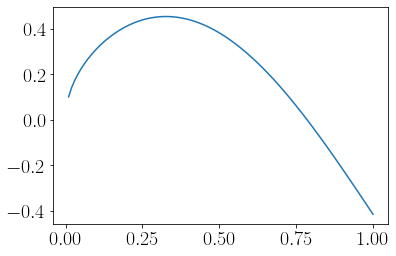

In [10]:
X=np.linspace(0,1,100)

func = [np.cos(_*2)*_**(-0.5)*_**1 for _ in X]

ax=py.subplot(111)
ax.plot(X,func)
ax.tick_params(labelsize=20)

In [12]:
jobstat(stop=True)
# send_command('scancel 40199706')

             JOBID PARTITION     NAME     USER ST       TIME  NODES NODELIST(REASON)
          46149603 productio   pA TMD   barryp PD       0:00      1 (None)
          46149604 productio   pA TMD   barryp PD       0:00      1 (None)
          46149605 productio   pA TMD   barryp PD       0:00      1 (None)
          46149606 productio   pA TMD   barryp PD       0:00      1 (None)
          46149607 productio   pA TMD   barryp PD       0:00      1 (None)
          46149608 productio   pA TMD   barryp PD       0:00      1 (None)
          46149609 productio   pA TMD   barryp PD       0:00      1 (None)
          46149610 productio   pA TMD   barryp PD       0:00      1 (None)
          46149611 productio   pA TMD   barryp PD       0:00      1 (None)
          46149612 productio   pA TMD   barryp PD       0:00      1 (None)
          46149613 productio   pA TMD   barryp PD       0:00      1 (None)
          46149614 productio   pA TMD   barryp PD       0:00      1 (None)
          46149

6.5787989742571895
6.5787989742571895
9.094108310664334
9.094108310664334
9.239661283263345
9.239661283263345
22.784198803322106
22.784198803322106
loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132
progress: 20/20loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132


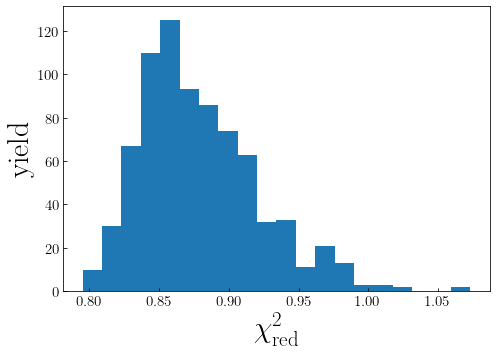

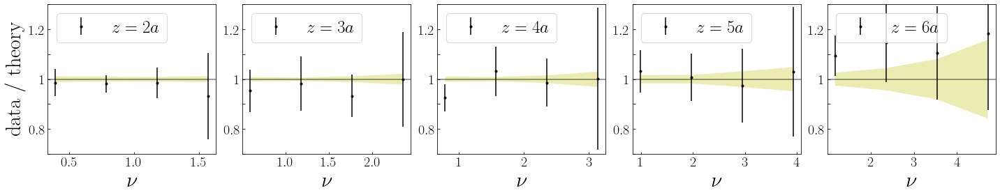

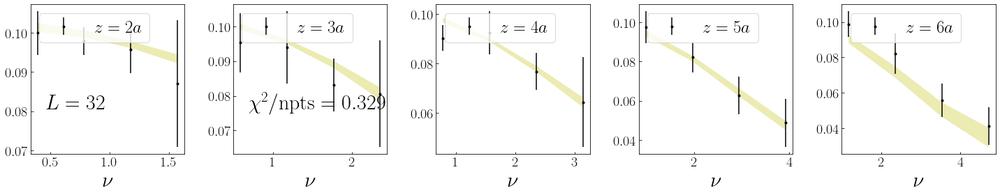

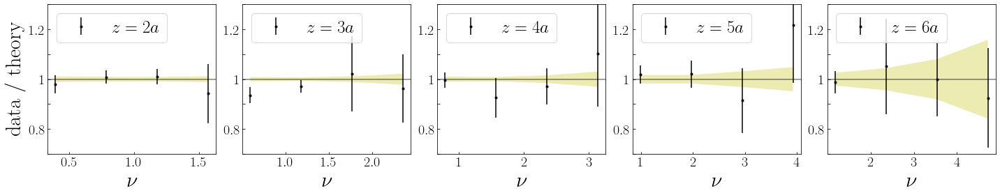

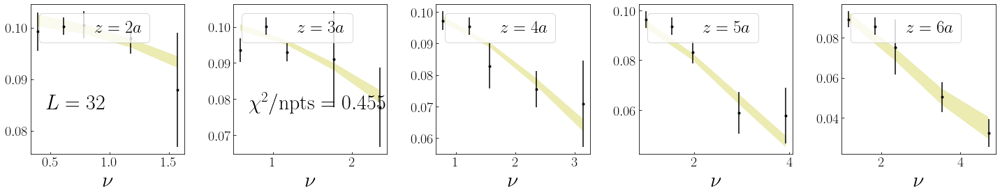

...

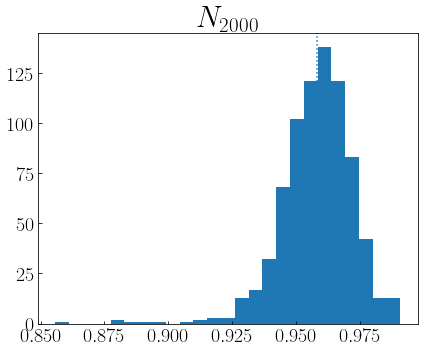

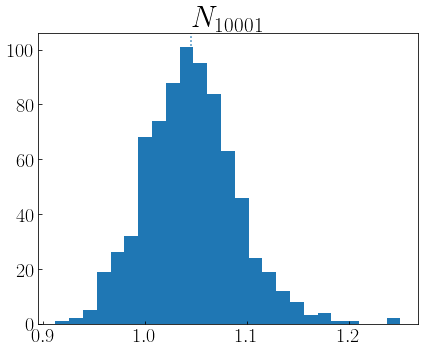

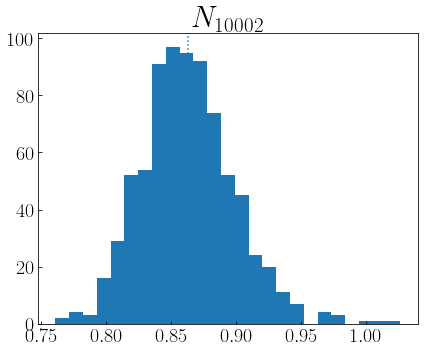

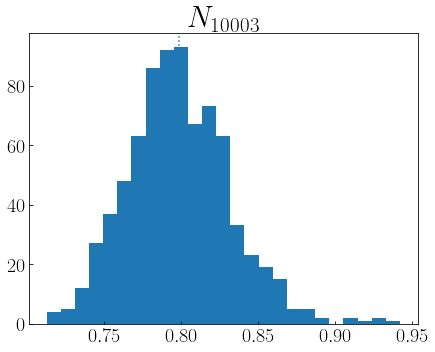

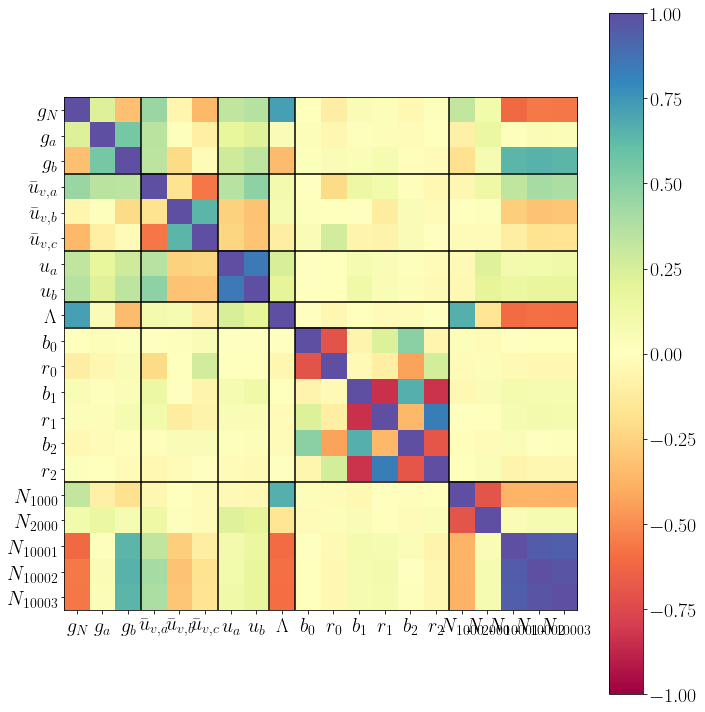

Process w1:
Process w0:
Process w0:
Process w1:
Traceback (most recent call last):
Traceback (most recent call last):
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
Traceback (most recent call last):
  File "/work/JAM/barryp/JAM/fitpack2/tools/parallel.py", line 69, in worker
    work = self.recv(sock)
  File "/work/JAM/barryp/JAM/fitpack2/tools/parallel.py", line 69, in worker
    work = self.recv(sock)
  File "/opt/conda/lib/python3.8/multiprocessing/process.py", line 315, in _bootstrap
    self.run()
  File "/opt/conda/lib/python3.8/multiprocessing/pr

In [35]:
# %matplotlib agg
# wdir='analysis-LCS/ccLCS/DMgood_stat_u_50//'
# wdir='analysis-LCS/ccLCS/DM_expt_only/'
# wdir='analysis-LCS/ccLCS/FV-huge_range/'
# wdir='analysis-LCS/ccLCS/DM_no_a94m278'
# wdir='analysis-LCS/ccLCS/DM_no_a94m358'
# wdir='analysis-LCS/ccLCS/DM_no_a124m413L/'
# wdir='analysis-LCS/ccLCS/DM/'
wdir='analysis-LCS/ccLCS/DM_B_R/'
book1=BOOK(wdir,'%s/input.npy'%wdir)
# book1.pdfs=calc_pdfs('/work/JAM/barryp/JAM/analysis-TMD/Vlad/pp3/',book1.samples[book1.red_chi2<2])
plot_chi2(wdir,book1.red_chi2)
expts=[12781,13581,14131,14132]
# expts=[327811,335811,341311,341321]
# # expts=[12781,13581,14131]
# # expts=[12781,13581,14132]
# # expts=[13581,14131,14132]
# # expts=[12781,14131,14132]
# # expts=[14131,14132]
# # expts=[12781,13581]
for k in expts:
    plot_data_over_theory(wdir,book1.predictions,k)
    plot_data_and_theory(wdir,book1.predictions,k)

# # plot_data_over_theory(wdir,book1.predictions,14132)
# # plot_data_and_theory(wdir,book1.predictions,14132)
plot_histograms(wdir,book1.samples,'%s/input.npy'%wdir)
plot_correlations(wdir,book1.samples,'%s/input.npy'%wdir)

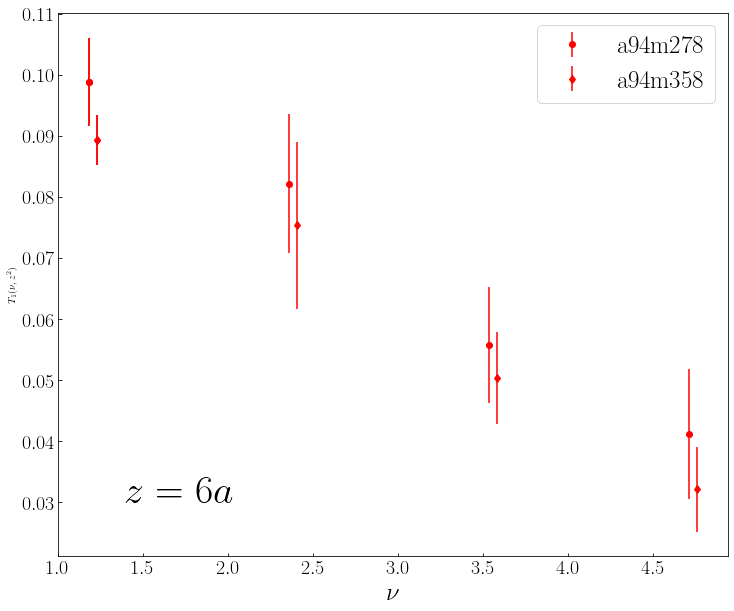

In [10]:
def test():
    nrows,ncols=1,1
    py.figure(figsize=(12*ncols,10*nrows))
    ax=py.subplot(nrows,ncols,1)
    pred=book1.predictions
    c=['m','c','g','k','r']
    s={14132:'*',14131:'^',13581:'d',12781:'o'}
    shift={14132:0.15,14131:0.1,13581:0.05,12781:0}
    for k in pred:
        if k!='ccLCS': continue
        for kk in pred[k]:
#             if kk!=14132 and kk!=14131: continue
            for i in range(len(np.unique(pred[k][kk]['ZoA']))):
                zuni=np.unique(pred[k][kk]['ZoA'][i])
#                 print(kk,pred[k][kk]['z'][i])
                if zuni!=6: continue
                for j in range(len(pred[k][kk]['ZoA'])):
                    if pred[k][kk]['ZoA'][j]==zuni:
                        ax.errorbar(pred[k][kk]['nu'][j]+shift[kk],pred[k][kk]['value'][j],yerr=pred[k][kk]['alpha'][j],fmt=s[kk],c=c[i])
                        if j==4 and kk==13581: ax.errorbar(pred[k][kk]['nu'][j]+shift[kk],pred[k][kk]['value'][j],yerr=pred[k][kk]['alpha'][j],fmt=s[kk],c=c[i],label=r'$\rm a94m358$')
                        if j==4 and kk==12781: ax.errorbar(pred[k][kk]['nu'][j]+shift[kk],pred[k][kk]['value'][j],yerr=pred[k][kk]['alpha'][j],fmt=s[kk],c=c[i],label=r'$\rm a94m278$')
    ax.text(0.1,0.1,r'$z=6a$',transform=ax.transAxes,fontsize=40)
    ax.tick_params(direction='in',which='both',axis='both',labelsize=20)
    ax.legend(fontsize=25)
    ax.set_xlabel(r'$\nu$',size=25)
    ax.set_ylabel(r'$T_1(\nu,z^2)$')

test()

In [14]:
def plot_data_and_theory_sysnosys(wdir,data,datanosys,expt):
    
    tab=copy.deepcopy(data['ccLCS'][expt])
    zunique=np.unique(tab['ZoA'])
    nrows=1
    ncols=len(zunique)
    py.figure(figsize=(6*ncols,6*nrows))
    
    cnt=0
    p=tab
    pnosys=copy.deepcopy(datanosys['ccLCS'][expt])

    for i in range(len(zunique)):
        cnt+=1
        theorytot=np.mean(p['prediction-rep'],axis=0)
        dtheorytot=np.std(p['prediction-rep'],axis=0)
        theorynosys=np.mean(pnosys['prediction-rep'],axis=0)
        dtheorynosys=np.std(pnosys['prediction-rep'],axis=0)
        onlysys=[]
        for j in range(len(p['prediction-rep'])):
            onlysys.append(p['prediction-rep'][j]-pnosys['prediction-rep'][j])
        theoryonlysys=np.mean(onlysys,axis=0)
        dtheoryonlysys=np.std(onlysys,axis=0)
        nu=[]
        vals=[]
        alphas=[]
        meanthy=[]
        stdthy=[]
        meanthynosys=[]
        stdthynosys=[]
        meanthyonlysys=[]
        stdthyonlysys=[]
        for j in range(len(p['N'])):
            if p['ZoA'][j]==zunique[i]:
                nu.append(p['nu'][j])
                vals.append(p['value'][j])
                alphas.append(p['alpha'][j])
                meanthy.append(theorytot[j])
                stdthy.append(dtheorytot[j])
                meanthynosys.append(theorynosys[j])
                stdthynosys.append(dtheorynosys[j])
                meanthyonlysys.append(theoryonlysys[j])
                stdthyonlysys.append(dtheoryonlysys[j])
                
        nu=np.array(nu)
        vals=np.array(vals)
        alphas=np.array(alphas)
        meanthy=np.array(meanthy)
        stdthy=np.array(stdthy)
        meanthynosys=np.array(meanthynosys)
        stdthynosys=np.array(stdthynosys)
        meanthyonlysys=np.array(meanthyonlysys)
        stdthyonlysys=np.array(stdthyonlysys)
        
        if len(nu)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.errorbar(nu,vals,yerr=alphas,fmt='.',c='k',label=r'$z=%i a$'%zunique[i])
        ax.fill_between(nu,meanthy-stdthy,meanthy+stdthy,alpha=0.3,fc='r',label=r'$\rm full$')
        ax.fill_between(nu,meanthynosys-stdthynosys,meanthynosys+stdthynosys,alpha=0.3,fc='g',label=r'$\rm no~sys$')
        ax.fill_between(nu,meanthyonlysys-stdthyonlysys,meanthyonlysys+stdthyonlysys,alpha=0.3,fc='c',label=r'$\rm only~sys$')
        
        ax.tick_params(direction='in',which='both',labelsize=20)
        ax.legend(fontsize=25,loc='center left')#,frameon=False)
        ax.set_xlabel(r'$\nu$',size=30)
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_and_theory_ccLCS_sysbreakdown-%s.png'%(wdir,expt))
    py.savefig('%s/gallery/data_and_theory_ccLCS_sysbreakdown-%s.pdf'%(wdir,expt))

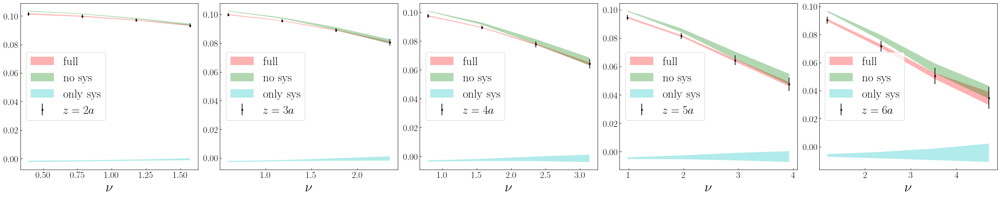

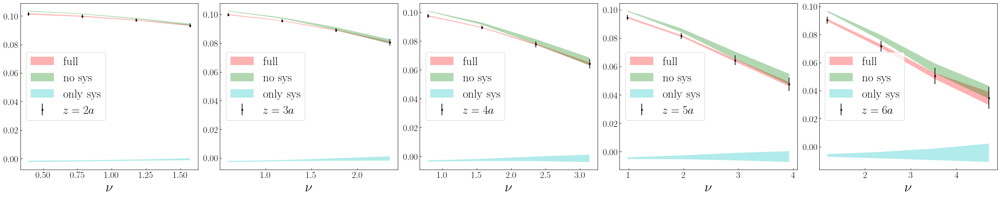

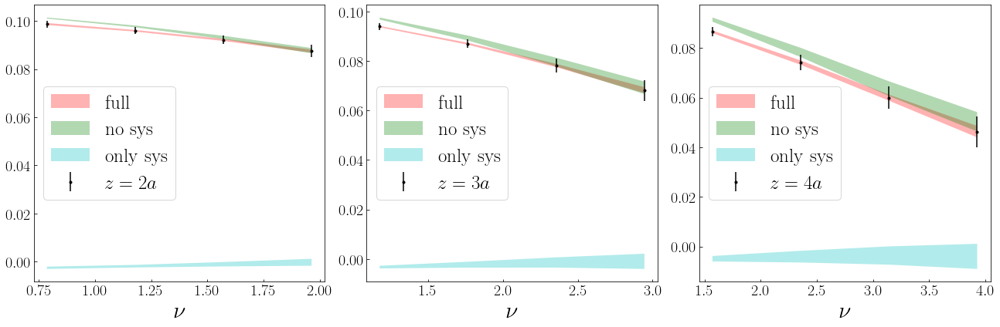

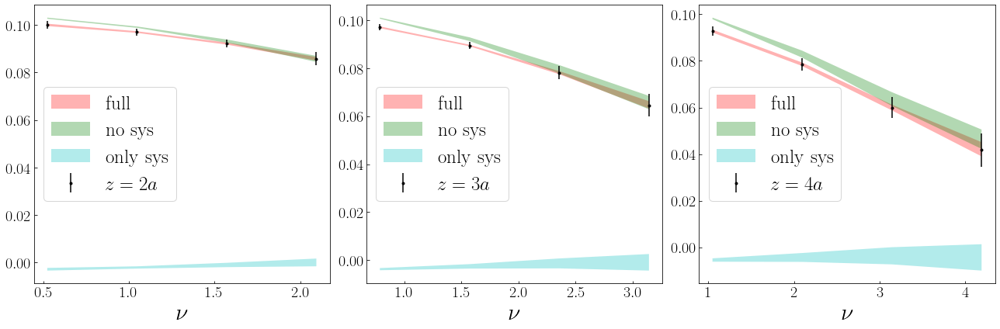

In [16]:
# for k in [12781,13581,14131,14132]:
for k in [327811,335811,341311,341321]:
    plot_data_and_theory_sysnosys(wdir,book1.predictions,book1.predictions_nosys,k)

In [17]:
# m=np.load('analysis-LCS/ccLCS/DMcp/mcrun/01WGXSQA86XW.msr.npy',allow_pickle=True,encoding='latin1').item()

In [18]:
# print(m)

In [19]:
print(np.mean(book1.pdfmoms['valence']))
print(np.std(book1.pdfmoms['valence']))

0.4428869302138809
0.03164003157971616


In [36]:
# chi2=np.load('analysis-LCS/pITD/B1B2P1P2-fromDYLN-nosmallp3//data/chi2.npy',allow_pickle=True,encoding='latin1').item()
# chi2=np.load('analysis-LCS/ccLCS/FV-larger_range//data/chi2.npy',allow_pickle=True,encoding='latin1').item()
# chi2=np.load('analysis-LCS/ccLCS/DM_expt_only/data/chi2.npy',allow_pickle=True,encoding='latin1').item()
# chi2=np.load('analysis-LCS/ccLCS/P0P1P2/data/chi2.npy',allow_pickle=True,encoding='latin1').item()
chi2=np.load('%s/data/chi2.npy'%wdir,allow_pickle=True,encoding='latin1').item()
print(chi2.keys())
chi2new={}
for k in chi2:
    if k=='dof': continue
    if k=='total': 
        chi2new[k]=chi2[k]
        chi2new[k]['chi2/npts']=chi2[k]['chi2']/chi2[k]['npts']
    else:
        for kk in chi2[k]:
            chi2new[kk]=chi2[k][kk]
            chi2new[kk]['chi2/npts']=chi2[k][kk]['chi2']/chi2[k][kk]['npts']

dict_keys(['dy-pion', 'ln', 'ccLCS', 'total', 'dof'])


In [37]:
pd.DataFrame(chi2new).T

,npts,chi2,chi2/npts
10001,61.0,49.406792,0.809947
10002,36.0,19.481851,0.541163
10003,20.0,17.155240,0.857762
1000,58.0,20.370537,0.351216
2000,50.0,77.250903,1.545018
12781,20.0,6.578799,0.328940
13581,20.0,9.094108,0.454705
14131,12.0,9.239661,0.769972
14132,12.0,22.784199,1.898683
total,289.0,231.362091,0.800561


In [22]:
def plot_pdfs(wdir,nolatt,pdfs):
    
    newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,1#2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    ax.plot(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0),'r',label=r'$\rm full$')
#     ax.plot(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0),'r',label=r'$\rm expt~only~from~red~c-c~priors$')
    ax.fill_between(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0)-np.std(newpdf['XF']['valence'],axis=0),np.mean(newpdf['XF']['valence'],axis=0)+np.std(newpdf['XF']['valence'],axis=0),alpha=0.5,fc='r')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0)-np.std(oldpdf['XF']['valence'],axis=0),np.mean(oldpdf['XF']['valence'],axis=0)+np.std(oldpdf['XF']['valence'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,2)
#     ax.plot(newpdf['X'],np.std(newpdf['XF']['valence'],axis=0)/np.mean(newpdf['XF']['valence'],axis=0),'r',lw=3)
#     ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
#     ax.set_ylim(0,0.15)
#     ax.set_xlim(0.2,0.9)
#     # ax.semilogy()
#     ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15])
#     ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$','',r'$0.1$','',r'$0.12$','',r'$0.14$',''])

#     ax.tick_params(direction='in',which='both',labelsize=25)

    checkdir('%s/gallery'%wdir)
    py.tight_layout()
    py.savefig('%s/gallery/pdfval.png'%wdir)

In [23]:
def plot_pdfs_reps(wdir,nolatt,pdfs):
    
    newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    [ax.plot(newpdf['X'],_,'r',alpha=0.1) for _ in newpdf['XF']['valence']]
    [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
#     ax.semilogx()
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(newpdf['X'],np.std(newpdf['XF']['valence'],axis=0)/np.mean(newpdf['XF']['valence'],axis=0),'r',lw=3)
    ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
    ax.set_ylim(0,0.15)
    ax.set_xlim(0.2,0.9)
    # ax.semilogy()
    ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15])
    ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$','',r'$0.1$','',r'$0.12$','',r'$0.14$',''])

    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/pdfval_mod.png'%wdir)

In [24]:
book1.pdfs.keys()

dict_keys(['X', 'Q2', 'XF'])

In [25]:
# nolattPDFs=load('/work/JAM/barryp/JAM/analysis-pions/FINALpy3/step15/data/pdf-15.dat')
nolattPDFs=load('../doublemellincopy/step18pos/data/pdf-18.dat')
# nolattPDFs=np.load('analysis-LCS/ccLCS/DM/data/pdf.npy',allow_pickle=True,encoding='latin1').item()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


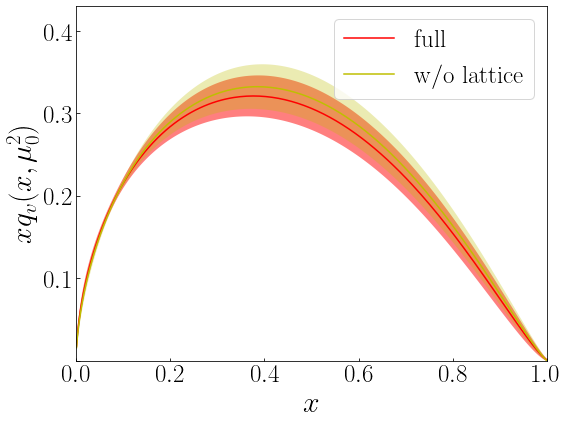

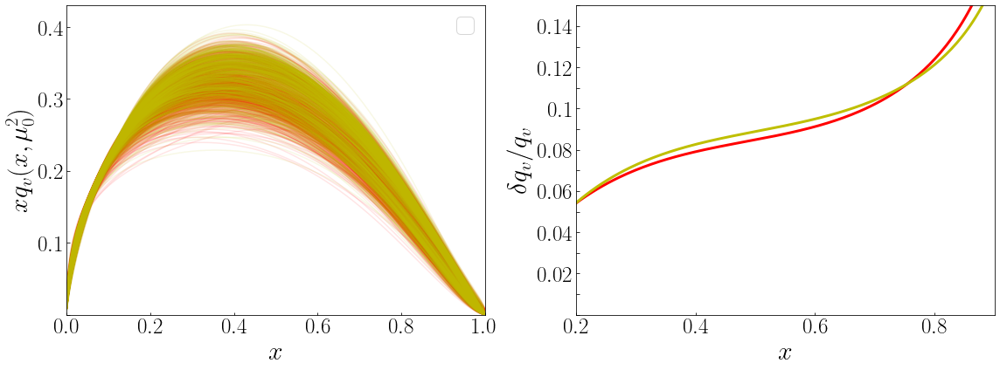

In [26]:
# wdir='analysis-LCS/ccLCS/DMcp'
# wdir='analysis-LCS/ccLCS/DM_expt_only/'
# wdir='analysis-LCS/ccLCS/DM_nosmall/'
# book1=BOOK(wdir,'%s/input.npy'%wdir)
plot_pdfs(wdir,nolattPDFs,book1.pdfs)
plot_pdfs_reps(wdir,nolattPDFs,book1.pdfs)

In [27]:
def plot_pdfs_all(wdir,nolatt,pdfs):
    
    newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,3
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    ax.plot(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0),'r',label=r'$\rm full$')
    ax.fill_between(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0)-np.std(newpdf['XF']['valence'],axis=0),np.mean(newpdf['XF']['valence'],axis=0)+np.std(newpdf['XF']['valence'],axis=0),alpha=0.5,fc='r')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0)-np.std(oldpdf['XF']['valence'],axis=0),np.mean(oldpdf['XF']['valence'],axis=0)+np.std(oldpdf['XF']['valence'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(newpdf['X'],np.mean(newpdf['XF']['sea'],axis=0),'r',label=r'$\rm full$')
    ax.fill_between(newpdf['X'],np.mean(newpdf['XF']['sea'],axis=0)-np.std(newpdf['XF']['sea'],axis=0),np.mean(newpdf['XF']['sea'],axis=0)+np.std(newpdf['XF']['sea'],axis=0),alpha=0.5,fc='r')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['sea'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['sea'],axis=0)-np.std(oldpdf['XF']['sea'],axis=0),np.mean(oldpdf['XF']['sea'],axis=0)+np.std(oldpdf['XF']['sea'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_s(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,3)
    ax.plot(newpdf['X'],np.mean(newpdf['XF']['g'],axis=0)/10,'r',label=r'$\rm full$')
    ax.fill_between(newpdf['X'],np.mean(newpdf['XF']['g'],axis=0)/10-np.std(newpdf['XF']['g'],axis=0)/10,np.mean(newpdf['XF']['g'],axis=0)/10+np.std(newpdf['XF']['g'],axis=0)/10,alpha=0.5,fc='r')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['g'],axis=0)/10,'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['g'],axis=0)/10-np.std(oldpdf['XF']['g'],axis=0)/10,np.mean(oldpdf['XF']['g'],axis=0)/10+np.std(oldpdf['XF']['g'],axis=0)/10,alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xg(x,\mu_0^2)/10$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)


    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    py.savefig('%s/gallery/pdf.png'%wdir)

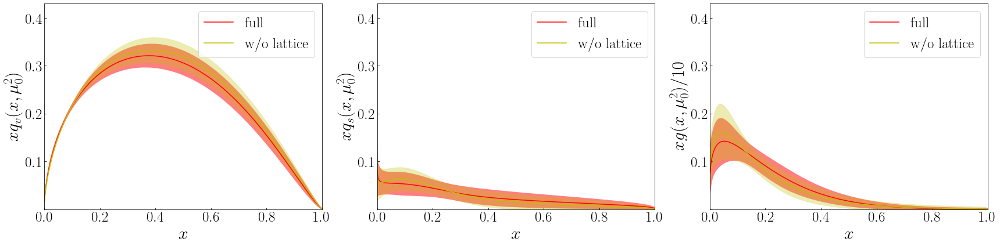

In [28]:
# wdir='analysis-LCS/ccLCS/stat_u_10percent'
book1=BOOK(wdir,'%s/input.npy'%wdir)
plot_pdfs_all(wdir,nolattPDFs,book1.pdfs)

In [29]:
def plot_pdfs_reps_single(wdir,pdfs):
    
    newpdf=pdfs
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    for i in range(len(newpdf['XF']['valence'])):
        if newpdf['XF']['valence'][i][222]<0.22:
#             print(i)
#             ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
          ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color='r',alpha=0.1)
        else:
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color='g',alpha=0.1)


#     [ax.plot(newpdf['X'],_,'c',alpha=0.1) for _ in newpdf['XF']['valence']]
#     ax.semilogx()
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
#     ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)


    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/pdfval_mod_single.png'%wdir)

In [30]:
# wdir='analysis-LCS/ccLCS/DM_no_a94m358/'
# book1=BOOK(wdir,'%s/input.npy'%wdir)


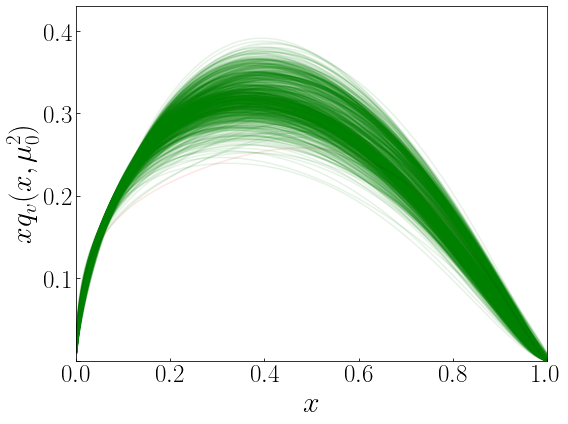

In [31]:
plot_pdfs_reps_single(wdir,book1.pdfs)

In [32]:
def plot_pdfs_reps_single(wdir,pdfs):
    
    newpdf=pdfs
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    for i in range(len(newpdf['XF']['valence'])):
        if newpdf['XF']['valence'][i][222]<0.22:
#             print(i)
#             ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
          ax.plot(newpdf['X'],newpdf['XF']['valence'][i]/newpdf['X'],color='r',alpha=0.1)
        else:
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i]/newpdf['X'],color='g',alpha=0.1)


#     [ax.plot(newpdf['X'],_,'c',alpha=0.1) for _ in newpdf['XF']['valence']]
    ax.semilogx()
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$q_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(1e-3,1)
    ax.set_ylim(0,10)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
#     ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)
    
    
#     ax=py.subplot(nrows,ncols,2)
#     reds=[]
#     greens=[]
#     for i in range(len(newpdf['XF']['valence'])):
#         if newpdf['XF']['valence'][i][222]<0.22:
# #             print(i)
# #             ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
#             reds.append(newpdf['XF']['valence'][i])
# #             ax.plot(newpdf['X'],newpdf['XF']['valence'][i]/newpdf['X'],color='r',alpha=0.1)
#         else:
#             greens.append(newpdf['XF']['valence'][i])
# #             ax.plot(newpdf['X'],newpdf['XF']['valence'][i]/newpdf['X'],color='g',alpha=0.1)
    
#     mean=np.mean(newpdf['XF']['valence'],axis=0)
#     std=np.std(newpdf['XF']['valence'],axis=0)
#     ax.fill_between(newpdf['X'],(mean-std)/newpdf['X'],(mean+std)/newpdf['X'],alpha=0.3)


# #     [ax.plot(newpdf['X'],_,'c',alpha=0.1) for _ in newpdf['XF']['valence']]
#     ax.semilogx()
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$q_v(x,\mu_0^2)$',size=30)
#     ax.set_xlim(1e-3,1)
#     ax.set_ylim(0,10)
# #     ax.set_yticks([0,0.1,0.2,0.3,0.4])
# #     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)
    
    

    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/f_single.png'%wdir)

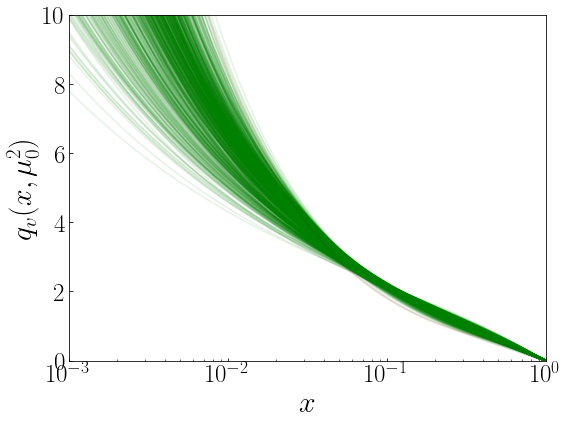

In [33]:
plot_pdfs_reps_single(wdir,book1.pdfs)

In [34]:
def plot_pdfs_bands(wdir,nofv,fvpdfs):
    
    newpdf=fvpdfs
    oldpdf=nofv
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    newmean,newstd=np.mean(newpdf['XF']['valence'],axis=0),np.std(newpdf['XF']['valence'],axis=0)
    oldmean,oldstd=np.mean(oldpdf['XF']['valence'],axis=0),np.std(oldpdf['XF']['valence'],axis=0)
    ax.fill_between(oldpdf['X'],(oldmean-oldstd)/oldmean,(oldmean+oldstd)/oldmean,fc='y',alpha=0.5,label=r'$\rm no~FV~effect$')
    ax.fill_between(newpdf['X'],(newmean-newstd)/oldmean,(newmean+newstd)/oldmean,fc='b',alpha=0.5,label=r'$\rm with~FV~effect$')
#     [ax.plot(newpdf['X'],_,'r',alpha=0.1) for _ in newpdf['XF']['valence']]
#     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
    ax.semilogx()
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$q_v/q_v^{\rm no~FV}$',size=30)
    ax.set_xlim(1e-3,1)
    ax.set_ylim(0.4,1.6)
#     ax.set_ylim(1e-1,1e1)
#     ax.semilogy()
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,2)
#     ax.plot(newpdf['X'],np.std(newpdf['XF']['valence'],axis=0)/np.mean(newpdf['XF']['valence'],axis=0),'r',lw=3)
#     ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
#     ax.set_ylim(0,0.15)
#     ax.set_xlim(0.2,0.9)
#     # ax.semilogy()
#     ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15])
#     ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$','',r'$0.1$','',r'$0.12$','',r'$0.14$',''])

#     ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/f_comp.png'%wdir)

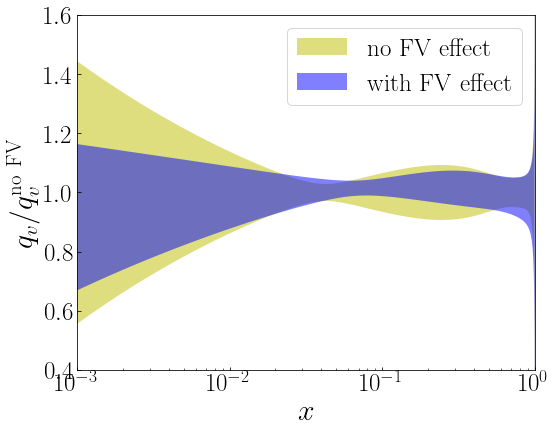

In [89]:
wdir2='analysis-LCS/ccLCS/FV-huge_range/'
book2=BOOK(wdir2,'%s/input.npy'%wdir2)
plot_pdfs_bands(wdir2,book1.pdfs,book2.pdfs)

In [83]:
def plot_pdfs_reps_single2(wdir,pdfsnolatt,pdfs):
    
    oldpdf=pdfsnolatt
    newpdf=pdfs
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    bx=py.subplot(nrows,ncols,2)
    for i in range(len(newpdf['XF']['valence'])):
        if newpdf['XF']['valence'][i][222]<0.22:
#             print(i)
#             ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
            ax.plot(oldpdf['X'],oldpdf['XF']['valence'][i],color='r',alpha=0.1)
            bx.plot(newpdf['X'],newpdf['XF']['valence'][i],color='r',alpha=0.1)
        else:
            ax.plot(oldpdf['X'],oldpdf['XF']['valence'][i],color='g',alpha=0.1)            
            bx.plot(newpdf['X'],newpdf['XF']['valence'][i],color='g',alpha=0.1)


#     [ax.plot(newpdf['X'],_,'c',alpha=0.1) for _ in newpdf['XF']['valence']]
#     ax.semilogx()
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
#     ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)
    bx.set_xlabel(r'$x$',size=30)
    bx.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    bx.set_xlim(0,1)
    bx.set_ylim(0,0.43)
    bx.set_yticks([0,0.1,0.2,0.3,0.4])
    bx.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
#     ax.legend(fontsize=25)
    bx.tick_params(direction='in',which='both',labelsize=25)


    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/pdfval_mod_single_2.png'%wdir)

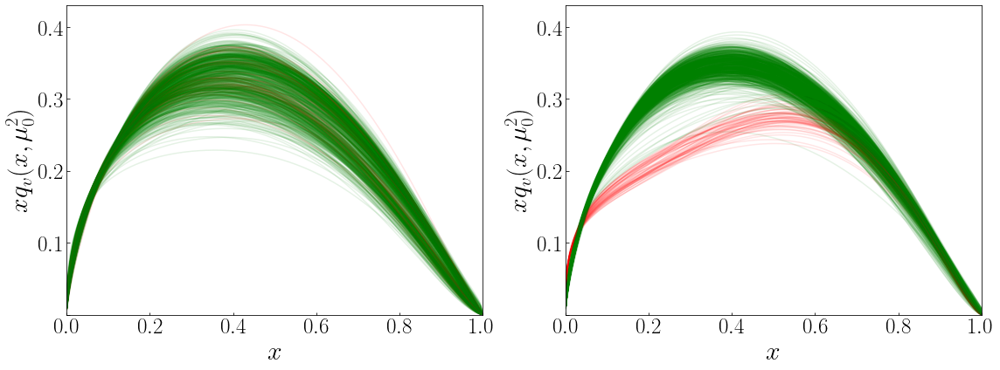

In [84]:
nolattPDFs=load('../doublemellincopy/step18pos/data/pdf-18.dat')
wdir2='analysis-LCS/ccLCS/DM'
book2=BOOK(wdir2,'%s/input.npy'%wdir2)
plot_pdfs_reps_single2(wdir2,nolattPDFs,book2.pdfs)

In [17]:
from scipy.special import gamma,binom,factorial

class SYSTEMATICS():
    
    def __init__(self):
        self.alpha=-0.5
        self.beta=3
        self.setup()
        
    def setup(self):
        self.NU=np.linspace(0.19,4.75,40)
        self.storage00=np.array([self.get_sigma0n(0,_) for _ in self.NU])
        self.storage01=np.array([self.get_sigma0n(1,_) for _ in self.NU])
        self.storage02=np.array([self.get_sigma0n(2,_) for _ in self.NU])

    def jacobipoly(self,n,x):
        alpha,beta=self.alpha,self.beta
        jacobi=0
        for j in range(n+1):
            omega=binom(n,j)*(-1)**j/factorial(n)*gamma(alpha+n+1)*gamma(alpha+beta+n+j+1)/gamma(alpha+beta+n+1)/gamma(alpha+j+1)
            jacobi+=omega*x**j
        return jacobi
    
    def get_sigma0n(self,n,nu):
        alpha,beta=self.alpha,self.beta
        integrand=lambda x: np.cos(nu*x)*x**(alpha)*(1-x)**beta*self.jacobipoly(n,x)
        return quad(integrand,0,1)[0]

    def get_p0term(self,a,z,p0):
        return self.storage00*p0*a/np.abs(z)
    
    def get_p1term(self,a,z,p1):
        return self.storage01*p1*a/np.abs(z)
    
    def get_p2term(self,a,z,p2):
        return self.storage02*p2*a/np.abs(z)
    
    def get_f0term(self,mpi,L,z,f0):
        return self.storage00*f0*np.exp(-mpi*(L-z))
    
    def get_f1term(self,mpi,L,z,f1):
        return self.storage01*f1*np.exp(-mpi*(L-z))
    
    def get_f2term(self,mpi,L,z,f2):
        return self.storage02*f2*np.exp(-mpi*(L-z))
    
    def get_m0term(self,mpi,m0):
        return self.storage00*m0*(mpi-conf['aux'].Mpi)
    
    def get_m1term(self,mpi,m1):
        return self.storage01*m1*(mpi-conf['aux'].Mpi)
    
    def get_m2term(self,mpi,m2):
        return self.storage02*m2*(mpi-conf['aux'].Mpi)
    
    def get_r0term(self,a,r0):
        return self.storage00*a*r0
    
    def get_r1term(self,a,r1):
        return self.storage01*a*r1
    
    def get_r2term(self,a,r2):
        return self.storage02*a*r2
    

In [11]:
sys=SYSTEMATICS()

In [12]:
book1=BOOK(wdir,'%s/input.npy'%wdir)

In [18]:
def plot_systematics(wdir,samples,predictions,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    
    f0=[]
    f1=[]
    f2=[]
    for i in range(len(order)):
        for j in range(len(samples)):
            if order[i][2]=='f0-ccLCS': f0.append(samples[j][i])
            if order[i][2]=='f1-ccLCS': f1.append(samples[j][i])
            if order[i][2]=='f2-ccLCS': f2.append(samples[j][i])
                
    f0,f1,f2=np.array(f0),np.array(f1),np.array(f2)
    
    sys=SYSTEMATICS()
    NU=sys.NU
    
    nrows,ncols=2,1
        
    py.figure(figsize=(4*ncols,4*nrows))
    cnt=0
    
    cnt+=1
    mpi=predictions['ccLCS'][14131]['mpi'][0]*1e-3 #--unit conversion
    z=predictions['ccLCS'][14131]['z'][0]*5 #--unit conversion
    L1=predictions['ccLCS'][14131]['L'][0]*5*predictions['ccLCS'][14131]['a'][0] #--unit conversion
    L2=predictions['ccLCS'][14132]['L'][0]*5*predictions['ccLCS'][14132]['a'][0] #--unit conversion
    
    F0L1=[]
    F0L2=[]
    for i in range(len(f0)):
        F0L1.append(sys.get_f0term(mpi,L1,z,f0[i]))
        F0L2.append(sys.get_f0term(mpi,L2,z,f0[i]))
    F0L1=np.array(F0L1)
    F0L2=np.array(F0L2)
    
    F1L1=[]
    F1L2=[]
    for i in range(len(f1)):
        F1L1.append(sys.get_f1term(mpi,L1,z,f1[i]))
        F1L2.append(sys.get_f1term(mpi,L2,z,f1[i]))
    F1L1=np.array(F1L1)
    F1L2=np.array(F1L2)
    
    F2L1=[]
    F2L2=[]
    for i in range(len(f2)):
        F2L1.append(sys.get_f2term(mpi,L1,z,f2[i]))
        F2L2.append(sys.get_f2term(mpi,L2,z,f2[i]))
    F2L1=np.array(F2L1)
    F2L2=np.array(F2L2)

    ax=py.subplot(nrows,ncols,cnt)
    bx=py.subplot(nrows,ncols,cnt+ncols)
    if len(f0)!=0:
        ax.plot(NU,F0L1[0],c='b',label=r'$f_0~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='b',alpha=0.1) for _ in F0L1]
        bx.plot(NU,F0L2[0],c='b',label=r'$f_0~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='b',alpha=0.1) for _ in F0L2]
    if len(f1)!=0:
        ax.plot(NU,F1L1[0],c='r',label=r'$f_1~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='r',alpha=0.1) for _ in F1L1]
        bx.plot(NU,F1L2[0],c='r',label=r'$f_1~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='r',alpha=0.1) for _ in F1L2]
    if len(f2)!=0:
        ax.plot(NU,F2L1[0],c='g',label=r'$f_2~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='g',alpha=0.1) for _ in F2L1]
        bx.plot(NU,F2L2[0],c='g',label=r'$f_2~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='g',alpha=0.1) for _ in F2L2]
    if len(f0)!=0 and len(f1)!=0 and len(f2)!=0:
        ax.plot(NU,F0L1[0]+F1L1[0]+F2L1[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [ax.plot(NU,F0L1[i]+F1L1[i]+F2L1[i],c='c',alpha=0.1,zorder=100000) for i in range(len(F1L2))]
        bx.plot(NU,F0L2[0]+F1L2[0]+F2L2[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [bx.plot(NU,F0L2[i]+F1L2[i]+F2L2[i],c='c',alpha=0.1,zorder=100000) for i in range(len(F1L2))]
    ax.text(0.1,0.1,r'$L=32~a$',transform=ax.transAxes,size=15)
    ax.legend(fontsize=15,loc='upper left')
    ax.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.text(0.1,0.1,r'$L=24~a$',transform=bx.transAxes,size=15)
    bx.legend(fontsize=15,loc='upper left')
    bx.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.set_xlabel(r'$\nu$',size=25)
    ax.set_title(r'$e^{-m_\pi (L-z)} F_1(\nu)$',size=25)
        
    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/systematics.png'%wdir)
    py.savefig('%s/gallery/systematics.pdf'%wdir)

In [98]:
print(book1.predictions['ccLCS'].keys())

dict_keys([12781, 13581, 14131, 14132])


loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132


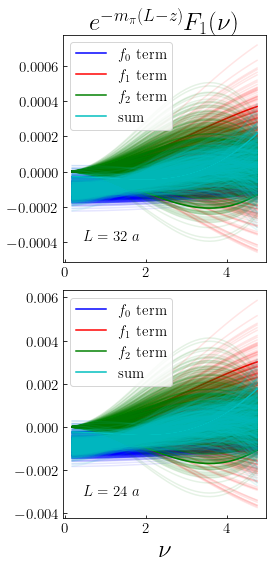

In [99]:
plot_systematics(wdir2,book2.samples,book2.predictions,'%s/input.npy'%wdir2)

In [22]:
def plot_systematics(wdir,samples,predictions,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    
    m0=[]
    m1=[]
    m2=[]
    r0=[]
    r1=[]
    r2=[]
    for i in range(len(order)):
        for j in range(len(samples)):
            if order[i][2]=='m0-ccLCS': m0.append(samples[j][i])
            if order[i][2]=='m1-ccLCS': m1.append(samples[j][i])
            if order[i][2]=='m2-ccLCS': m2.append(samples[j][i])
            if order[i][2]=='r0-ccLCS': r0.append(samples[j][i])
            if order[i][2]=='r1-ccLCS': r1.append(samples[j][i])
            if order[i][2]=='r2-ccLCS': r2.append(samples[j][i])
                
    m0,m1,m2=np.array(m0),np.array(m1),np.array(m2)
    r0,r1,r2=np.array(r0),np.array(r1),np.array(r2)
    
    sys=SYSTEMATICS()
    NU=sys.NU
    
    nrows,ncols=2,2
        
    py.figure(figsize=(4*ncols,4*nrows))
    cnt=0
    
    cnt+=1
    mpi1=predictions['ccLCS'][12781]['mpi'][0]*1e-3 #--unit conversion
    mpi2=predictions['ccLCS'][13581]['mpi'][0]*1e-3 #--unit conversion
#     mpi3=predictions['ccLCS'][14131]['mpi'][0]*1e-3 #--unit conversion
    
    a1=predictions['ccLCS'][12781]['a'][0]*5 #--unit conversion
    a2=predictions['ccLCS'][14131]['a'][0]*5 #--unit conversion
    
    
    M0m1=[]
    M0m2=[]
    for i in range(len(m0)):
        M0m1.append(sys.get_m0term(mpi1,m0[i]))
        M0m2.append(sys.get_m0term(mpi2,m0[i]))
    M0m1=np.array(M0m1)
    M0m2=np.array(M0m2)
    
    M1m1=[]
    M1m2=[]
    for i in range(len(m1)):
        M1m1.append(sys.get_m1term(mpi1,m1[i]))
        M1m2.append(sys.get_m1term(mpi2,m1[i]))
    M1m1=np.array(M1m1)
    M1m2=np.array(M1m2)
    
    M2m1=[]
    M2m2=[]
    for i in range(len(m2)):
        M2m1.append(sys.get_m2term(mpi1,m2[i]))
        M2m2.append(sys.get_m2term(mpi2,m2[i]))
    M2m1=np.array(M2m1)
    M2m2=np.array(M2m2)
    
    
    R0a1=[]
    R0a2=[]
    for i in range(len(r0)):
        R0a1.append(sys.get_r0term(a1,r0[i]))
        R0a2.append(sys.get_r0term(a2,r0[i]))
    R0a1=np.array(R0a1)
    R0a2=np.array(R0a2)
    
    R1a1=[]
    R1a2=[]
    for i in range(len(r1)):
        R1a1.append(sys.get_r1term(a1,r1[i]))
        R1a2.append(sys.get_r1term(a2,r1[i]))
    R1a1=np.array(R1a1)
    R1a2=np.array(R1a2)

    R2a1=[]
    R2a2=[]
    for i in range(len(r1)):
        R2a1.append(sys.get_r2term(a1,r2[i]))
        R2a2.append(sys.get_r2term(a2,r2[i]))
    R2a1=np.array(R2a1)
    R2a2=np.array(R2a2)

    ax=py.subplot(nrows,ncols,1)
    bx=py.subplot(nrows,ncols,3)
    if len(m0)!=0:
        ax.plot(NU,M0m1[0],c='b',label=r'$m_0~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='b',alpha=0.1) for _ in M0m1]
        bx.plot(NU,M0m2[0],c='b',label=r'$m_0~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='b',alpha=0.1) for _ in M0m2]
    if len(m1)!=0:
        ax.plot(NU,M1m1[0],c='r',label=r'$m_1~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='r',alpha=0.1) for _ in M1m1]
        bx.plot(NU,M1m2[0],c='r',label=r'$m_1~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='r',alpha=0.1) for _ in M1m2]
    if len(m2)!=0:
        ax.plot(NU,M2m1[0],c='g',label=r'$m_2~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='g',alpha=0.1) for _ in M2m1]
        bx.plot(NU,M2m2[0],c='g',label=r'$m_2~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='g',alpha=0.1) for _ in M2m2]
    if len(m0)!=0 and len(m1)!=0 and len(m2)!=0:
        ax.plot(NU,M0m1[0]+M1m1[0]+M2m1[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [ax.plot(NU,M0m1[i]+M1m1[i]+M2m1[i],c='c',alpha=0.1,zorder=100000) for i in range(len(M1m2))]
        bx.plot(NU,M0m1[0]+M1m2[0]+M2m2[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [bx.plot(NU,M0m2[i]+M1m2[i]+M2m2[i],c='c',alpha=0.1,zorder=100000) for i in range(len(M1m2))]
    ax.text(0.1,0.1,r'$m_\pi=278~{\rm MeV}$',transform=ax.transAxes,size=15)
    ax.legend(fontsize=15,loc='upper left')
    ax.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.text(0.1,0.1,r'$m_\pi=358~{\rm MeV}$',transform=bx.transAxes,size=15)
    bx.legend(fontsize=15,loc='upper left')
    bx.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.set_xlabel(r'$\nu$',size=25)
    ax.set_title(r'$(m_\pi - m_{\pi,{\rm phys}})M_1(\nu)$',size=25)
    
    ax=py.subplot(nrows,ncols,2)
    bx=py.subplot(nrows,ncols,4)
    if len(r0)!=0:
        ax.plot(NU,R0a1[0],c='b',label=r'$r_0~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='b',alpha=0.1) for _ in R0a1]
        bx.plot(NU,R0a2[0],c='b',label=r'$r_0~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='b',alpha=0.1) for _ in R0a2]
    if len(r1)!=0:
        ax.plot(NU,R1a1[0],c='r',label=r'$r_1~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='r',alpha=0.1) for _ in R1a1]
        bx.plot(NU,R1a2[0],c='r',label=r'$r_1~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='r',alpha=0.1) for _ in R1a2]
    if len(r2)!=0:
        ax.plot(NU,R2a1[0],c='g',label=r'$r_2~{\rm term}$',alpha=1)
        [ax.plot(NU,_,c='g',alpha=0.1) for _ in R2a1]
        bx.plot(NU,R2a2[0],c='g',label=r'$r_2~{\rm term}$',alpha=1)
        [bx.plot(NU,_,c='g',alpha=0.1) for _ in R2a2]
    if len(r0)!=0 and len(r1)!=0 and len(r2)!=0:
        ax.plot(NU,R0a1[0]+R1a1[0]+R2a1[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [ax.plot(NU,R0a1[i]+R1a1[i]+R2a1[i],c='c',alpha=0.1,zorder=100000) for i in range(len(R1a2))]
        bx.plot(NU,R0a1[0]+R1a2[0]+R2a2[0],c='c',label=r'$\rm sum$',alpha=1,zorder=100000)
        [bx.plot(NU,R0a2[i]+R1a2[i]+R2a2[i],c='c',alpha=0.1,zorder=100000) for i in range(len(R1a2))]
    ax.text(0.1,0.1,r'$a=0.094~{\rm fm}$',transform=ax.transAxes,size=15)
    ax.legend(fontsize=15,loc='upper left')
    ax.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.text(0.1,0.1,r'$a=0.127~{\rm fm}$',transform=bx.transAxes,size=15)
    bx.legend(fontsize=15,loc='upper left')
    bx.tick_params(direction='in',axis='both',which='both',labelsize=15)
    bx.set_xlabel(r'$\nu$',size=25)
    ax.set_title(r'$a~R_1(\nu)$',size=25)
        
    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/systematics.png'%wdir)
    py.savefig('%s/gallery/systematics.pdf'%wdir)

In [23]:
print(book1.predictions['ccLCS'].keys())

dict_keys([12781, 13581, 14131, 14132])


loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132


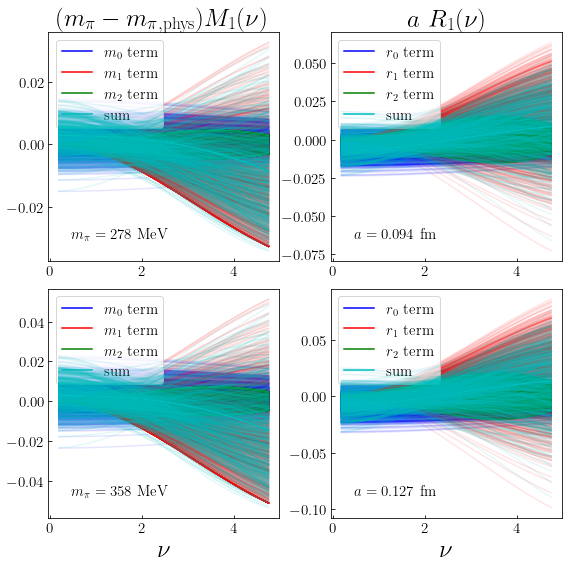

In [24]:
plot_systematics(wdir,book1.samples,book1.predictions,'%s/input.npy'%wdir)

## Plotting histograms for DM

In [44]:
msrs=core.get_replicas('../doublemellincopy/step18pos/')

In [50]:
ubvb=[]
for i in range(len(msrs)):
    for j in range(len(msrs[i]['order'][18])):
        if msrs[i]['order'][18][j][2]=='ubv1 b':
            ubvb.append(msrs[i]['params'][18][j])

(array([ 10.,  18.,   8.,   2.,   0.,  20., 156., 336., 186.,  42.]),
 array([0.06112989, 0.21332112, 0.36551235, 0.51770358, 0.66989481,
        0.82208604, 0.97427727, 1.12646849, 1.27865972, 1.43085095,
        1.58304218]),
 <BarContainer object of 10 artists>)

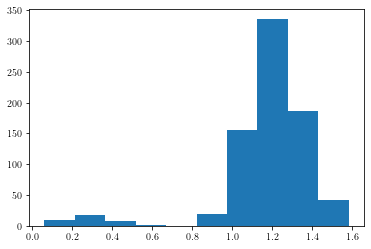

In [51]:
ax=py.subplot(111)
ax.hist(ubvb)

In [32]:
import math
def par_2d_scatter(wdir,samples,inputfile,active_list=[]):
    
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order

    title=list(range(len(order)))
    for i in range(len(order)):
        if order[i][1]=='pdf-pion':
            parname=order[i][2][-1]
            if 'ubv' in order[i][2]:
                title[i]=r'$\bar{u}_{v,%s}$'%parname
            else:
                parton=order[i][2][0]
                title[i]=r'$%s_{%s}$'%(parton,parname)
        elif 'lambda'==order[i][2]:
            title[i]=r'$\Lambda$'
        elif 'lat-sys'==order[i][1]:
            parname=order[i][2][0]
            power=order[i][2][1]
            title[i]=r'$%s_{%s}$'%(parname,power)
        elif order[i][0]==2:
            expt=order[i][2]
            title[i]=r'$N_{%i}$'%expt

    cnt1=0
    for i in range(len(order)):
        cnt1+=1
#         nrows,ncols=4,5
        nrows,ncols=4,math.ceil(len(order)/4)
        py.figure(figsize=(6*ncols,5*nrows))    
        lprint('progress: %i/%i'%(cnt1,len(order)))


        par=[]
        for j in range(len(samples)):
            par.append(samples[j][i])

        par=np.array(par)
        
        cnt2=0
        for j in range(len(order)):
            cnt2+=1
            ax=py.subplot(nrows,ncols,cnt2)
            par2=[]
            for ii in range(len(samples)):
                par2.append(samples[ii][j])
            ax.scatter(par,par2)
            ax.set_xlabel(title[i],size=35)
            ax.set_ylabel(title[j],size=35)
            ax.tick_params(direction='in',which='both',labelsize=30)

        py.tight_layout()
        checkdir('%s/gallery/scatter'%wdir)
        py.savefig('%s/gallery/scatter/%s.png'%(wdir,order[i][2]))
    

In [33]:
%matplotlib agg
# wdir='analysis-LCS/pITD/B1B2P1P2-fromDYLN/'
book1=BOOK(wdir,'%s/input.npy'%wdir)
par_2d_scatter(wdir,book1.samples,'%s/input.npy'%wdir)

loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132
progress: 29/29

In [11]:
from sklearn.cluster import KMeans

def cluster(wdir,samples,clusterpars,nc,inputfile,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    
    pars4cluster=[]
#     for i in range(len(samples)):
#         pars4cluster.append([])
#         for j in range(len(order)):
#             if order[j][2] in clusterpars:
#                 pars4cluster[i].append(samples[i][j])
                
    for s in samples:
        newsamples=[]
        for j in range(len(order)):
            if order[j][2] in clusterpars:
                newsamples.append(s[j])
        pars4cluster.append(newsamples)

                
    kmeans=KMeans(n_clusters=nc,random_state=0).fit(pars4cluster)
    return kmeans.labels_

In [12]:
# wdir='analysis-LCS/pITD/B1B2P1P2-fromDYLN'
# wdir='analysis-LCS/ccLCS/DM/'
book1=BOOK(wdir,'%s/input.npy'%wdir)
labels=cluster(wdir,book1.samples,['ubv1 a','ubv1 b','ubv1 c'],3,'%s/input.npy'%wdir)
# labels=cluster(wdir,book1.samples,['p1-ccLCS','m1-ccLCS','p2-ccLCS','r2-ccLCS','m2-ccLCS','f2-ccLCS'],3,'%s/input.npy'%wdir)

loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132


In [17]:
def rm_mcrun(wdir):
    
    send_command('mkdir %s/mcrun_red'%wdir)
    for k in os.listdir('%s/mcrun'%wdir):
        m=np.load('%s/mcrun/%s'%(wdir,k),allow_pickle=True,encoding='latin1').item()
        if m['params']['pdf-pion']['ubv1 c']['value']>2.7:
            send_command('cp %s/mcrun/%s %s/mcrun_red/.'%(wdir,k,wdir))
rm_mcrun(wdir)

In [27]:
def test(inputfile,labels,samples,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    
    for i in range(len(labels)):
        if labels[i]==1:
            for j in range(len(order)):
                if order[j][2]=='ubv1 c':
                    print(samples[i][j])
                    
test('%s/input.npy'%wdir,labels,book1.samples)

loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132
3.874236781473239
5.90122848254648
5.580046924528543
6.700023206859759
3.4907099542683495
3.7121255650789453
4.6859220094724
3.140403721895663
6.130078506322455
4.1895734733469645
4.77603950744902
4.110577290611697
5.690345833693871
5.35148637028766
4.119840549119746
5.040673705975689
3.962595085657592
5.964438948343734
4.9967505128549865
5.6083831837151665
4.712677179844225
2.9297898401883877
5.828541877009873
4.864629157667375
4.820973413157134
3.9795159518906926
5.898712525946448
5.03057178747235
4.655555984298494
4.877433850988183
4.334377629445229
3.043346974835995
3.7468831018125273
4.0

In [67]:
import math
def par_2d_scatter_cluster(wdir,samples,inputfile,labels,active_list=[]):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=True,datasets=True)
    parman=resman.parman

    parmean=np.mean(samples,axis=0)
    order=parman.order
    c=['g','r','c','b']

    title=list(range(len(order)))
    for i in range(len(order)):
        if order[i][1]=='pdf-pion':
            parname=order[i][2][-1]
            if 'ubv' in order[i][2]:
                title[i]=r'$\bar{u}_{v,%s}$'%parname
            else:
                parton=order[i][2][0]
                title[i]=r'$%s_{%s}$'%(parton,parname)
        elif 'lambda'==order[i][2]:
            title[i]=r'$\Lambda$'
        elif 'lat-sys'==order[i][1]:
            parname=order[i][2][0]
            power=order[i][2][1]
            title[i]=r'$%s_{%s}$'%(parname,power)
        elif order[i][0]==2:
            expt=order[i][2]
            title[i]=r'$N_{%i}$'%expt

    cnt1=0
    for i in range(len(order)):
        cnt1+=1
        nrows,ncols=4,math.ceil(len(order)/4)
        py.figure(figsize=(6*ncols,5*nrows))    
        lprint('progress: %i/%i'%(cnt1,len(order)))


        AX={cnt: py.subplot(nrows,ncols,cnt) for cnt in range(1,len(order)+1)}
        
        for k in np.unique(labels):
        
            par=[]
            for j in range(len(samples)):
                if labels[j]!=k: continue
                par.append(samples[j][i])

            par=np.array(par)

            cnt2=0
            for j in range(len(order)):
                cnt2+=1
    #             ax=py.subplot(nrows,ncols,cnt2)
                par2=[]
                for ii in range(len(samples)):
                    if labels[ii]!=k: continue
                    par2.append(samples[ii][j])
                AX[j+1].scatter(par,par2,color=c[k])
#                 if k==1 and order[j][2]=='ubv1 c': print(par2[ii])
                AX[j+1].set_xlabel(title[i],size=35)
                AX[j+1].set_ylabel(title[j],size=35)
                AX[j+1].tick_params(direction='in',which='both',labelsize=30)

        py.tight_layout()
        checkdir('%s/gallery/scatter-cluster'%wdir)
        py.savefig('%s/gallery/scatter-cluster/%s.png'%(wdir,order[i][2]))
    

In [57]:
def plot_pdfs_all_reps_clusters(wdir,nolatt,pdfs,labels):
    
    newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    c=['g','r','c','b']

    ax=py.subplot(nrows,ncols,1)
    for i in range(len(newpdf['XF']['valence'])):
        cluster=labels[i]
#         if cluster==1: continue
        if newpdf['XF']['valence'][i][222]<0.22:
#             print(i)
#             ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
              ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color='r',alpha=0.1)
        else:
              ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color='g',alpha=0.1)

#     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
#     ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,2)
#     for i in range(len(newpdf['XF']['sea'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(newpdf['X'],newpdf['XF']['sea'][i],color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['sea']]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xq_s(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,3)
#     for i in range(len(newpdf['XF']['g'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(newpdf['X'],np.array(newpdf['XF']['g'][i])/10,color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_/10,'y',alpha=0.1) for _ in np.array(oldpdf['XF']['g'])]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xg(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)


    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    py.savefig('%s/gallery/pdf_clusters_val.png'%wdir)

In [58]:
book1.pdfs['X'][222]

0.19949748743718593

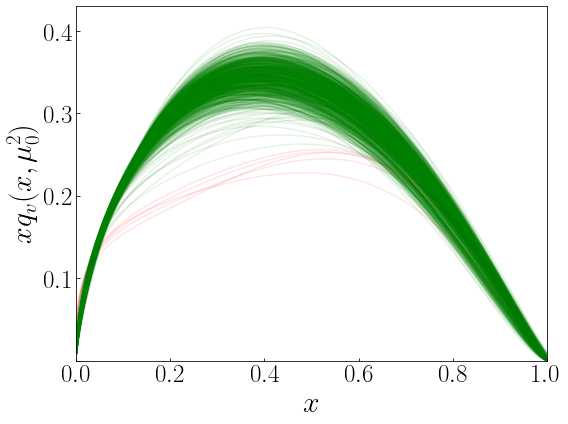

In [59]:
# %matplotlib agg
# wdir='analysis-LCS/ccLCS/DM'
# book1=BOOK(wdir,'%s/input.npy'%wdir)
# labels=cluster(wdir,book1.samples,['ubv1 a','ubv1 b','ubv1 c'],3,'%s/input.npy'%wdir)
# par_2d_scatter_cluster(wdir,book1.samples,'%s/input.npy'%wdir,labels)
plot_pdfs_all_reps_clusters(wdir,nolattPDFs,book1.pdfs,labels)

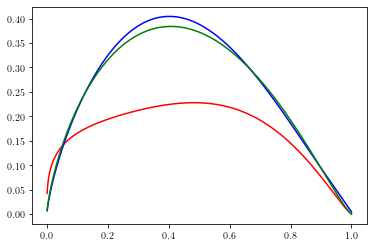

In [40]:
ax=py.subplot(111)
ax.plot(book1.pdfs['X'],book1.pdfs['XF']['valence'][544],'r')
ax.plot(book1.pdfs['X'],book1.pdfs['XF']['valence'][187],'b')
ax.plot(book1.pdfs['X'],book1.pdfs['XF']['valence'][589],'g')

In [25]:
# from sklearn.cluster import KMeans

# def cluster(wdir,samples,clusterpars,nc,inputfile,active_list=[]):
#     load_config(inputfile)
# #     set_active_params(active_list)
#     conf['bootstrap'] = False
#     resman=RESMAN(parallel=True,datasets=True)
#     parman=resman.parman

#     parmean=np.mean(samples,axis=0)
#     order=parman.order
    
#     pars4cluster=[]
#     for i in range(len(samples)):
#         pars4cluster.append([])
#         for j in range(len(order)):
#             if order[j][2] in clusterpars:
#                 pars4cluster[i].append(samples[i][j])
    
#     kmeans=KMeans(n_clusters=nc,random_state=0).fit(pars4cluster)
#     return kmeans.labels_

# # def cluster():
# #     labels=[]
# #     for i in range(len(msrs)):
# #         for j in range(len(msrs[i]['order'][18])):
# #             if msrs[i]['order'][18][j][2]=='ubv1 b':
# #                 if msrs[i]['params'][18][j]<0.8: labels.append(0)
# #                 else: labels.append(1)
# #     return labels

In [26]:
# wdir='analysis-LCS/pITD/B1B2P1P2-fromDYLN'
# book1=BOOK(wdir,'%s/input.npy'%wdir)
# labels=cluster()

In [27]:
# cnt=0
# for i in range(len(labels)):
#     if labels[i]==1: cnt+=1
# cnt

In [28]:
# def plot_pdfs_all_reps_clusters(pdfs,labels):
    
    
#     nrows,ncols=1,3
#     py.figure(figsize=(8*ncols,6*nrows))

#     c=['r','c','g','b']

#     ax=py.subplot(nrows,ncols,1)
#     for i in range(len(pdfs['XF']['valence'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(pdfs['X'],pdfs['XF']['valence'][i],color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,2)
#     for i in range(len(pdfs['XF']['sea'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(pdfs['X'],pdfs['XF']['sea'][i],color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['sea']]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xq_s(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,3)
#     for i in range(len(pdfs['XF']['g'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(pdfs['X'],np.array(pdfs['XF']['g'][i])/10,color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_/10,'y',alpha=0.1) for _ in np.array(oldpdf['XF']['g'])]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xg(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)


#     ax.tick_params(direction='in',which='both',labelsize=25)

#     py.tight_layout()
#     checkdir('testing_gallery')
#     py.savefig('testing_gallery/pdf_clusters.png')

In [29]:
# plot_pdfs_all_reps_clusters(load('../doublemellincopy/step18pos/data/pdf-18.dat'),labels)

In [30]:
def chi2_per_cluster(wdir,book,labels):
    chi2=book.red_chi2
    nrows,ncols=1,1
    fig = py.figure(figsize=(ncols*7,nrows*5))
    ax=py.subplot(nrows,ncols,1)
    c=['g','r','c','b']
    
    for k in np.unique(labels):
        data=[]
        for j in range(len(chi2)):
            if labels[j]==k:
                data.append(chi2[j])

        ax.hist(data,bins=20,color=c[k],histtype='step');
    ax.tick_params(axis='both', which='both', labelsize=15,direction='in')
    ax.set_xlabel(r'$\chi^2_{\rm red}$',size=30);
    ax.set_ylabel(r'$\rm yield$',size=30);
    
    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/chi2_cluster.png'%wdir)
    


In [31]:
chi2_per_cluster(wdir,book1,labels)

In [69]:
def chi2_per_cluster_expt(wdir,book,labels,obs,expt):
#     chi2=book.red_chi2
    samples=book.samples
    chi2={}
    c=['g','r','c','b']
    
    p=book.predictions[obs][expt]
#     print(p.keys())

    preds={}
    for k in np.unique(labels):
        preds[k]=[]
        for i in range(len(p['prediction-rep'])):
            if labels[i]==k:
                preds[k].append(p['prediction-rep'][i])
    
    for k in np.unique(labels):
        chi2[k]={}
        res=(p['value']-np.mean(preds[k],axis=0))/p['alpha']
        chi2[k]['npts']=len(res)
        chi2[k]['chi2']=np.sum(res**2)
                
    chi2['total']={}
    chi2['total']['chi2']=0
    chi2['total']['npts']=0
    for k in chi2:
        if k=='total': continue
        chi2['total']['chi2']+=chi2[k]['chi2']
        chi2['total']['npts']+=chi2[k]['npts']
            
#     print(len(samples[0]))
    chi2['dof']=chi2['total']['npts']-len(samples[0])
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/chi2cluster-%s-%i'%(wdir,obs,expt),chi2)
    return chi2
    


In [33]:
def test():

    totals={}
    totals['E615']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10001)
    totals['NA101']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10002)
    totals['NA102']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10003)
    totals['H1']=chi2_per_cluster_expt(wdir,book1,labels,'ln',1000)
    totals['ZEUS']=chi2_per_cluster_expt(wdir,book1,labels,'ln',2000)
    totals['a94m278']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',12781)
    totals['a94m358']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',13581)
    totals['a127m413L']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',14131)
    totals['a127m413']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',14132)
    
    chi2bar1=[totals[_][0]['chi2']/totals[_][0]['npts'] for _ in totals]
    chi2bar2=[totals[_][1]['chi2']/totals[_][1]['npts'] for _ in totals]
    chi2bar3=[totals[_][2]['chi2']/totals[_][2]['npts'] for _ in totals]
    
    total1chi2=np.sum([totals[_][0]['chi2'] for _ in totals])
    total1npts=np.sum([totals[_][0]['npts'] for _ in totals])
    
    total2chi2=np.sum([totals[_][1]['chi2'] for _ in totals])
    total2npts=np.sum([totals[_][1]['npts'] for _ in totals])
    
    total3chi2=np.sum([totals[_][2]['chi2'] for _ in totals])
    total3npts=np.sum([totals[_][2]['npts'] for _ in totals])
    
    chi2bar1.append(total1chi2/total1npts)
    chi2bar2.append(total2chi2/total2npts)
    chi2bar3.append(total3chi2/total3npts)
    
    print(totals.keys())
    print(len(totals))
#     print(totals['E615'][2]['chi2']/totals['E615'][2]['npts'])
    nrows,ncols=1,1
    py.figure(figsize=(10*ncols,6*nrows))
    print(len(chi2bar1))
#     Xwidth=np.linspace(0,1,2)

    X = np.arange(10)
    print(len(X))
    ax = py.subplot(111)
    ax.bar(X + 0.0, chi2bar1, color = 'g', width = 0.3)#,label=r'${\rm NLO~no~sys}$')
    ax.bar(X + 0.3, chi2bar2, color = 'r', width = 0.3)#,label=r'${\rm NLO~with~sys}$')
    ax.bar(X + 0.6, chi2bar3, color = 'c', width = 0.3)#,label=r'${\rm NLO+NLL~no~sys}$')

#     ax.legend(fontsize=20)

    ax.set_xticks([0.31,1.31,2.31,3.31,4.31,5.31,6.31,7.31,8.31,9.31])
    ax.set_xticklabels([r'$\rm E615$',r'$\rm NA10(1)$',r'$\rm NA10(2)$',r'$\rm H1$',r'$\rm ZEUS$',r'$\rm a94m278$',r'$\rm a94m358$',r'$\rm a127m413L$',r'$\rm a127m413$',r'$\bf total$'])
    ax.tick_params(direction='in',axis='both',which='both',labelsize=18)
    ax.set_ylabel(r'$\chi^2_{\rm npts}$',size=30)
    py.setp(ax.get_xticklabels()[-5:-1],rotation=-25,ha='left',rotation_mode='anchor')

    py.tight_layout()
    checkdir('testing_gallery/')
    py.savefig('testing_gallery/clusterchi2_cut.png')
    py.savefig('testing_gallery/clusterchi2_cut.pdf')

In [78]:
def test():

    totals={}
    totals['E615']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10001)
    totals['NA101']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10002)
    totals['NA102']=chi2_per_cluster_expt(wdir,book1,labels,'dy-pion',10003)
    totals['H1']=chi2_per_cluster_expt(wdir,book1,labels,'ln',1000)
    totals['ZEUS']=chi2_per_cluster_expt(wdir,book1,labels,'ln',2000)
    totals['a94m278']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',12781)
    totals['a94m358']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',13581)
    totals['a127m413L']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',14131)
    totals['a127m413']=chi2_per_cluster_expt(wdir,book1,labels,'ccLCS',14132)
    
    chi2bar1=[totals[_][0]['chi2']/totals[_][0]['npts'] for _ in totals]
    chi2bar2=[totals[_][1]['chi2']/totals[_][1]['npts'] for _ in totals]
    chi2bar3=[totals[_][2]['chi2']/totals[_][2]['npts'] for _ in totals]
    
    print('chibar^2 green: %.4f'%(1/len(totals)*np.sum(chi2bar1)))
    print('chibar^2 red:   %.4f'%(1/len(totals)*np.sum(chi2bar2)))
    print('chibar^2 cyan:  %.4f'%(1/len(totals)*np.sum(chi2bar3)))
    
    chi2barprime1=[]
    chi2barprime2=[]
    chi2barprime3=[]
    for _ in totals:
        chi2cluster1=totals[_][0]['chi2']/totals[_][0]['npts']
        if chi2cluster1<=1: chi2barprime1.append(1)
        else: chi2barprime1.append(chi2cluster1)
            
        chi2cluster2=totals[_][1]['chi2']/totals[_][1]['npts']
        if chi2cluster2<=1: chi2barprime2.append(1)
        else: chi2barprime2.append(chi2cluster2)
            
        chi2cluster3=totals[_][2]['chi2']/totals[_][2]['npts']
        if chi2cluster3<=1: chi2barprime3.append(1)
        else: chi2barprime3.append(chi2cluster3)
            
    print('chibarprime^2 green: %.4f'%(1/len(totals)*np.sum(chi2barprime1)))
    print('chibarprime^2 red:   %.4f'%(1/len(totals)*np.sum(chi2barprime2)))
    print('chibarprime^2 cyan:  %.4f'%(1/len(totals)*np.sum(chi2barprime3)))

    
#     total1chi2=np.sum([totals[_][0]['chi2'] for _ in totals])
#     total1npts=np.sum([totals[_][0]['npts'] for _ in totals])
    
#     total2chi2=np.sum([totals[_][1]['chi2'] for _ in totals])
#     total2npts=np.sum([totals[_][1]['npts'] for _ in totals])
    
#     total3chi2=np.sum([totals[_][2]['chi2'] for _ in totals])
#     total3npts=np.sum([totals[_][2]['npts'] for _ in totals])
    
#     chi2bar1.append(total1chi2/total1npts)
#     chi2bar2.append(total2chi2/total2npts)
#     chi2bar3.append(total3chi2/total3npts)
    
#     print(totals.keys())
#     print(len(totals))
# #     print(totals['E615'][2]['chi2']/totals['E615'][2]['npts'])
#     nrows,ncols=1,1
#     py.figure(figsize=(10*ncols,6*nrows))
#     print(len(chi2bar1))
# #     Xwidth=np.linspace(0,1,2)

#     X = np.arange(10)
#     print(len(X))
#     ax = py.subplot(111)
#     ax.bar(X + 0.0, chi2bar1, color = 'g', width = 0.3)#,label=r'${\rm NLO~no~sys}$')
#     ax.bar(X + 0.3, chi2bar2, color = 'r', width = 0.3)#,label=r'${\rm NLO~with~sys}$')
#     ax.bar(X + 0.6, chi2bar3, color = 'c', width = 0.3)#,label=r'${\rm NLO+NLL~no~sys}$')

# #     ax.legend(fontsize=20)

#     ax.set_xticks([0.31,1.31,2.31,3.31,4.31,5.31,6.31,7.31,8.31,9.31])
#     ax.set_xticklabels([r'$\rm E615$',r'$\rm NA10(1)$',r'$\rm NA10(2)$',r'$\rm H1$',r'$\rm ZEUS$',r'$\rm a94m278$',r'$\rm a94m358$',r'$\rm a127m413L$',r'$\rm a127m413$',r'$\bf total$'])
#     ax.tick_params(direction='in',axis='both',which='both',labelsize=18)
#     ax.set_ylabel(r'$\chi^2_{\rm npts}$',size=30)
#     py.setp(ax.get_xticklabels()[-5:-1],rotation=-25,ha='left',rotation_mode='anchor')

#     py.tight_layout()
#     checkdir('testing_gallery/')
#     py.savefig('testing_gallery/clusterchi2_cut.png')
#     py.savefig('testing_gallery/clusterchi2_cut.pdf')

In [79]:
test()

chibar^2 green: 1.0028
chibar^2 red:   0.9388
chibar^2 cyan:  0.9819
chibarprime^2 green: 1.2077
chibarprime^2 red:   1.2604
chibarprime^2 cyan:  1.2095


In [86]:
pdfDMcp=np.load('analysis-LCS/ccLCS/DMcp/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
print(len(pdfDMcp['XF']['valence']))

717


In [21]:
cnt0,cnt1,cnt2=0,0,0
for i in range(len(labels)):
    if labels[i]==0: cnt0+=1
    elif labels[i]==1: cnt1+=1
    elif labels[i]==2: cnt2+=1
        
print(cnt0,cnt1,cnt2)

656 61 61


In [35]:
test()

dict_keys(['E615', 'NA101', 'NA102', 'H1', 'ZEUS', 'a94m278', 'a94m358', 'a127m413L', 'a127m413'])
9
10
10


In [61]:
def gen_pdf_mom(wdir,samples,inputfile,active_list=[],Q2=None):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=False,datasets=False)
    parman=resman.parman
    
    pdf=conf['pdf-pion']

    if Q2==None: Q2=2**2
#     X=10**np.linspace(-3,-1,200)
#     X=np.append(X,np.linspace(0.1,1,200))
    moms={}
    moms['x']={}
    moms['x**2']={}
    moms['x**3']={}

    cnt=0
    for par in samples:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samples)))

        parman.set_new_params(par)

        for flav in ['valence','sea','g']:
            for k in moms:
                if flav not in moms[k]: moms[k][flav]=[]

            if flav=='valence':
                func=lambda x: 2*(pdf.get_xF(x,Q2,'ub')-pdf.get_xF(x,Q2,'u'))
            elif flav=='sea':
                func=lambda x: 6*pdf.get_xF(x,Q2,'u')
            else:
                func=lambda x: pdf.get_xF(x,Q2,'g')

            moms['x'][flav].append(quad(lambda x: func(x),0,1)[0])
            moms['x**2'][flav].append(quad(lambda x: x*func(x),0,1)[0])
            moms['x**3'][flav].append(quad(lambda x: x**2*func(x),0,1)[0])

#     data={'X':X,'Q2':Q2,'XF':XF}
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/pdfmoms_mult'%(wdir),moms)
    return moms


In [63]:
def gen_pdf_mom(wdir,samples,inputfile,active_list=[],Q2=None):
    load_config2(inputfile)
    set_active_params(active_list)
    conf['bootstrap'] = False
    resman=RESMAN(parallel=False,datasets=False)
    parman=resman.parman
    
    pdf=conf['pdf-pion']

    if Q2==None: Q2=2**2
#     X=10**np.linspace(-3,-1,200)
#     X=np.append(X,np.linspace(0.1,1,200))
    moms={}
    moms['x']={}
    moms['x**2']={}
    moms['x**3']={}

    cnt=0
    for par in samples:
        cnt+=1
        lprint('progress: %i/%i'%(cnt,len(samples)))

        parman.set_new_params(par)

        for flav in ['uplus','upiplus']:
            for k in moms:
                if flav not in moms[k]: moms[k][flav]=[]

            if flav=='uplus':
                func=lambda x: pdf.get_xF(x,Q2,'ub')+pdf.get_xF(x,Q2,'u')
            elif flav=='upiplus':
                func=lambda x: pdf.get_xF(x,Q2,'ub')

            moms['x'][flav].append(quad(lambda x: func(x),0,1)[0])
            moms['x**2'][flav].append(quad(lambda x: x*func(x),0,1)[0])
            moms['x**3'][flav].append(quad(lambda x: x**2*func(x),0,1)[0])

#     data={'X':X,'Q2':Q2,'XF':XF}
    
    checkdir('%s/data'%wdir)
    np.save('%s/data/pdfmomsu_mult'%(wdir),moms)
    return moms


In [64]:
wdir2='analysis-LCS/ccLCS/DM/'
moms=gen_pdf_mom(wdir2,book1.samples,'%s/input.npy'%wdir2)

progress: 778/778

In [67]:
def plot_moms_clusters(wdir,moms,labels):
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    c={0:'g',1:'r',2:'c',3:'b'}

    
    
    ax=py.subplot(nrows,ncols,1)
    moments={}
    for k in np.unique(labels):
        if k not in moments: 
            moments[k]={}
            moments[k]['x uplus']=[]
            moments[k]['x**2 uplus']=[]
            moments[k]['x**2 upiplus']=[]
            moments[k]['x**3 upiplus']=[]
        for i in range(len(moms['x']['uplus'])):
            cluster=labels[i]
            if cluster==k:
                moments[k]['x uplus'].append(moms['x']['uplus'][i])
                moments[k]['x**2 uplus'].append(moms['x**2']['uplus'][i])
                moments[k]['x**2 upiplus'].append(moms['x**2']['upiplus'][i])
                moments[k]['x**3 upiplus'].append(moms['x**3']['upiplus'][i])
                
    
    for k in moments:
        moments[k]['mean x uplus']=np.mean(moments[k]['x uplus'],axis=0)
        moments[k]['std x uplus']=np.std(moments[k]['x uplus'],axis=0)
        moments[k]['mean x**2 uplus']=np.mean(moments[k]['x**2 uplus'],axis=0)
        moments[k]['std x**2 uplus']=np.std(moments[k]['x**2 uplus'],axis=0)
        moments[k]['mean x**2 upiplus']=np.mean(moments[k]['x**2 upiplus'],axis=0)
        moments[k]['std x**2 upiplus']=np.std(moments[k]['x**2 upiplus'],axis=0)
        moments[k]['mean x**3 upiplus']=np.mean(moments[k]['x**3 upiplus'],axis=0)
        moments[k]['std x**3 upiplus']=np.std(moments[k]['x**3 upiplus'],axis=0)
        
    Xs=np.array([0,1,2,3])
    for k in moments:
        ax.errorbar(Xs+0.1*k,[moments[k]['mean x uplus'],moments[k]['mean x**2 uplus'],moments[k]['mean x**2 upiplus'],moments[k]['mean x**3 upiplus']]\
                    ,yerr=[moments[k]['std x uplus'],moments[k]['std x**2 uplus'],moments[k]['std x**2 upiplus'],moments[k]['std x**3 upiplus']],fmt='o',c=c[k])
    ax.errorbar(Xs+0.3,[0.261,0.082,0.110,0.024],yerr=[0.003,0.021,0.007,0.018],fmt='^',c='k')
    ax.set_xticks([0,1,2,3])
    ax.set_xticklabels([r'$\langle x \rangle^\pi_{u^+}$',r'$\langle x^2 \rangle^\pi_{u^+}$',r'$\langle x^2 \rangle^{\pi^+}_u$',r'$\langle x^3 \rangle^{\pi^+}_u$'])
# #         if cluster==1: continue
#         ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)


    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    py.savefig('%s/gallery/pdf_valmom_clusters.png'%wdir)

In [68]:
plot_moms_clusters(wdir2,moms,labels)

In [50]:
def plot_data_over_theory_clusters(wdir,data,expt,labels):
    
    tab=copy.deepcopy(data['ccLCS'][expt])
    zunique=np.unique(tab['ZoA'])
    nrows=1
    ncols=len(zunique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    colors=['g','r','c','b']
    for k in np.unique(labels):
        cnt=0
        pred=[]
        for i in range(len(p['prediction-rep'])):
            if labels[i]==k:
                pred.append(p['prediction-rep'][i])
        for i in range(len(zunique)):
            cnt+=1
            theory=np.mean(pred,axis=0)
            dtheory=np.std(pred,axis=0)
            nu=[]
            vals=[]
            alphas=[]
            meanthy=[]
            stdthy=[]
            for j in range(len(p['N'])):
                if p['ZoA'][j]==zunique[i]:
                    nu.append(p['nu'][j])
                    vals.append(p['value'][j])
                    alphas.append(p['alpha'][j])
                    meanthy.append(theory[j])
                    stdthy.append(dtheory[j])
            nu=np.array(nu)
            vals=np.array(vals)
            alphas=np.array(alphas)
            meanthy=np.array(meanthy)
            stdthy=np.array(stdthy)
            if len(nu)==0: continue
            ax=py.subplot(nrows,ncols,cnt)
            ax.errorbar(nu+0.05*k,vals/meanthy,yerr=alphas/meanthy,fmt='.',c=colors[k],label=r'$z=%i a$'%zunique[i])
            ax.fill_between(nu+0.05*k,1-stdthy/meanthy,1+stdthy/meanthy,alpha=0.3,fc=colors[k])
            ax.tick_params(direction='in',which='both',labelsize=20)
            ax.axhline(y=1,color='k',alpha=0.5)
#         ax.set_ylim(0.99,1.01)
#         ax.set_yticks([0.99,0.995,1,1.005,1.01])
#         if i==0:
#             ax.set_yticklabels([r'$0.99$','',r'$1$','',r'$1.01$'])
#         else: ax.set_yticklabels([])
            if i==0: ax.set_ylabel(r'${\rm data~/~theory}$',size=30)
#         ax.legend(fontsize=25,loc='upper left')#,frameon=False)
            ax.set_xlabel(r'$\nu$',size=30)
#         if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
#         if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
#         ax.set_ylim(0.7,1.3)
#         ax.set_yticks([0.7,0.8,0.9,1,1.1,1.2,1.3])
#         ax.set_yticklabels(['',r'$0.8$','',r'$1$','',r'$1.2$',''])
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_ccLCS-%s_cluster.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_ccLCS-%s_cluster.pdf'%(wdir,expt))


7.986866363939431
19.135479934216214
14.556801331067783
19.05351122348845


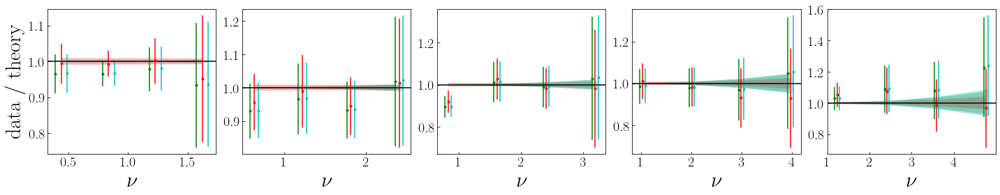

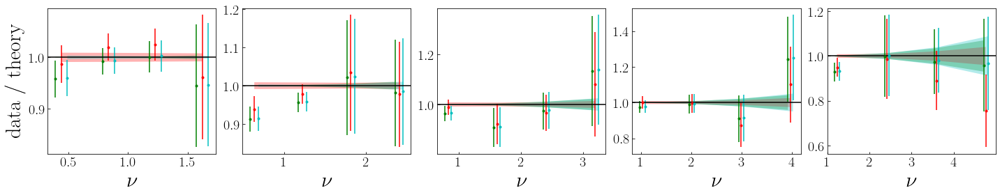

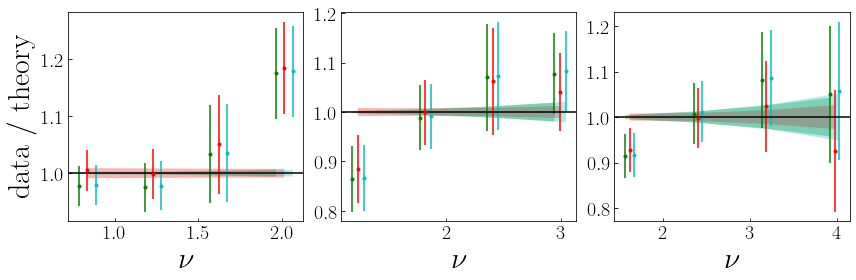

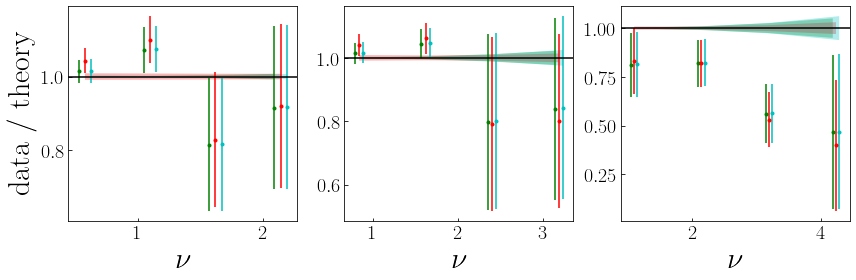

In [51]:
expts=[12781,13581,14131,14132]

for k in expts:
    plot_data_over_theory_clusters(wdir,book1.predictions,k,labels)

In [44]:
def plot_data_over_theory_clusters_DY(wdir,data,expt,labels):
    
    tab=copy.deepcopy(data['dy-pion'][expt])
    print(tab.keys())
    Q2unique=np.unique(tab['Q2'])
    nrows=1
    ncols=len(Q2unique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    colors=['g','r','c','b']
    for k in np.unique(labels):
        cnt=0
        pred=[]
        for i in range(len(p['prediction-rep'])):
            if labels[i]==k:
                pred.append(p['prediction-rep'][i])
        for i in range(len(Q2unique)):
            cnt+=1
            theory=np.mean(pred,axis=0)
            dtheory=np.std(pred,axis=0)
            xF=[]
            vals=[]
            alphas=[]
            meanthy=[]
            stdthy=[]
            for j in range(len(p['N'])):
                if p['Q2'][j]==Q2unique[i]:
                    xF.append(p['xF'][j])
                    vals.append(p['value'][j])
                    alphas.append(p['alpha'][j])
                    meanthy.append(theory[j])
                    stdthy.append(dtheory[j])
            xF=np.array(xF)
            vals=np.array(vals)
            alphas=np.array(alphas)
            meanthy=np.array(meanthy)
            stdthy=np.array(stdthy)
            if len(xF)==0: continue
            ax=py.subplot(nrows,ncols,cnt)
            ax.errorbar(xF+0.02*k,vals/meanthy,yerr=alphas/meanthy,fmt='.',c=colors[k])
            ax.fill_between(xF+0.02*k,1-stdthy/meanthy,1+stdthy/meanthy,alpha=0.3,fc=colors[k])
            ax.tick_params(direction='in',which='both',labelsize=20)
            ax.axhline(y=1,color='k',alpha=0.5)
            if k==0: ax.text(0.05,0.05,r'$Q^2=%i~{\rm GeV}^2$'%Q2unique[i],transform=ax.transAxes,size=14)
#         ax.set_ylim(0.99,1.01)
#         ax.set_yticks([0.99,0.995,1,1.005,1.01])
#         if i==0:
#             ax.set_yticklabels([r'$0.99$','',r'$1$','',r'$1.01$'])
#         else: ax.set_yticklabels([])
            if i==0: ax.set_ylabel(r'${\rm data~/~theory}$',size=30)
#         ax.legend(fontsize=25,loc='upper left')#,frameon=False)
            ax.set_xlabel(r'$x_F$',size=30)
#         if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
#         if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
#         ax.set_ylim(0.7,1.3)
#         ax.set_yticks([0.7,0.8,0.9,1,1.1,1.2,1.3])
#         ax.set_yticklabels(['',r'$0.8$','',r'$1$','',r'$1.2$',''])
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_dypion-%s_cluster.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_dypion-%s_cluster.pdf'%(wdir,expt))


In [45]:
# wdir='analysis-LCS/ccLCS/DM'

dict_keys(['E', 'rtaumin', 'rtaumax', 'xFmin', 'xFmax', 'obs', 'target', 'pion beam', 'units', 'value', 'stat_u', 'norm_c', 'col', 'Unnamed: 13', 'tau', 'xF', 'Y', 'S', 'Q2', 'xpi', 'Jac', 'Units', 'idx', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
50.446809762199926
dict_keys(['E', 'rtaumin', 'rtaumax', 'xFmin', 'xFmax', 'obs', 'target', 'pion beam', 'units', 'value', 'stat_u', 'norm_c', 'col', 'tau', 'xF', 'Y', 'S', 'Q2', 'xpi', 'Jac', 'Units', 'idx', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
19.032629766652455
dict_keys(['E', 'rtaumin', 'rtaumax', 'xFmin', 'xFmax', 's', 'obs', 'target', 'pion beam', 'units', 'value', 'stat_u', 'norm_c', 'col', 'Unnamed: 14', 'Unnamed: 15', 'Unnamed: 16', 'tau', 'xF', 'Y', 'S', 'Q2', 'xpi', 'Jac', 'Units', 'idx', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
16.22772792785259


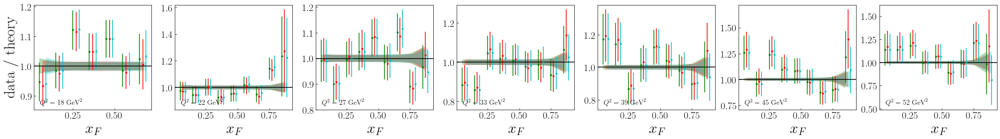

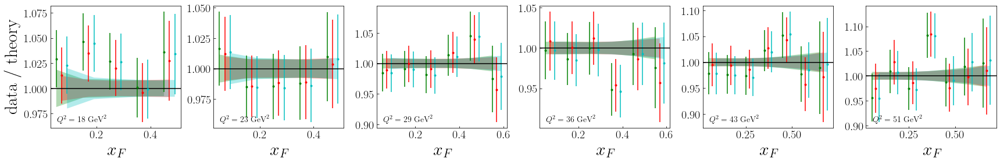

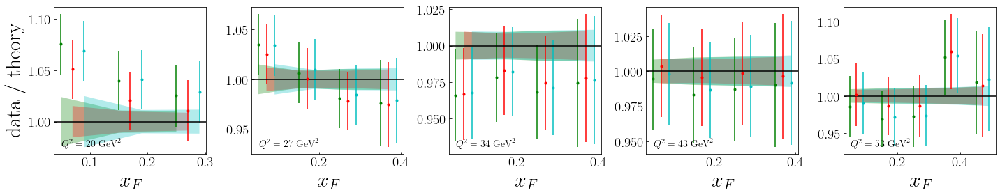

In [46]:
expts=[10001,10002,10003]

for k in expts:
    plot_data_over_theory_clusters_DY(wdir,book1.predictions,k,labels)

In [81]:
def plot_data_over_theory_clusters_LN(wdir,data,expt,labels):
    
    tab=copy.deepcopy(data['ln'][expt])
    print(tab.keys())
    Q2unique=np.unique(tab['Q2'])
    yunique=np.unique(tab['y'])
    xLunique=1-yunique
    nrows=2
    ncols=len(Q2unique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    colors=['g','r','c','b']
    for k in np.unique(labels):
        cnt=0
        pred=[]
        for i in range(len(p['prediction-rep'])):
            if labels[i]==k:
                pred.append(p['prediction-rep'][i])
        for i in range(len(xLunique)):
            for j in range(len(Q2unique)):
                cnt+=1
                theory=np.mean(pred,axis=0)
                dtheory=np.std(pred,axis=0)
                xpi=[]
                vals=[]
                alphas=[]
                meanthy=[]
                stdthy=[]
                for ii in range(len(p['N'])):
                    if p['Q2'][ii]==Q2unique[j] and p['y'][ii]==yunique[i]:
                        xpi.append(p['xpi'][ii])
                        vals.append(p['value'][ii])
                        alphas.append(p['alpha'][ii])
                        meanthy.append(theory[ii])
                        stdthy.append(dtheory[ii])
                xpi=np.array(xpi)
                vals=np.array(vals)
                alphas=np.array(alphas)
                meanthy=np.array(meanthy)
                stdthy=np.array(stdthy)
                if len(xpi)==0: continue
                ax=py.subplot(nrows,ncols,cnt)
                ax.errorbar(xpi*(1+0.1*k),vals/meanthy,yerr=alphas/meanthy,fmt='.',c=colors[k])
                ax.fill_between(xpi*(1+0.1*k),1-stdthy/meanthy,1+stdthy/meanthy,alpha=0.3,fc=colors[k])
                ax.tick_params(direction='in',which='both',labelsize=20)
                ax.axhline(y=1,color='k',alpha=0.5)
                if k==0: 
                    ax.text(0.05,0.05,r'$Q^2=%i~{\rm GeV}^2$'%Q2unique[j],transform=ax.transAxes,size=14)
                    ax.text(0.05,0.9,r'$\bar{x}_L=%.2f$'%(1-xLunique[i]),transform=ax.transAxes,size=14)
                ax.semilogx()
    #         ax.set_ylim(0.99,1.01)
    #         ax.set_yticks([0.99,0.995,1,1.005,1.01])
    #         if i==0:
    #             ax.set_yticklabels([r'$0.99$','',r'$1$','',r'$1.01$'])
    #         else: ax.set_yticklabels([])
                if j==0: ax.set_ylabel(r'${\rm data~/~theory}$',size=30)
    #         ax.legend(fontsize=25,loc='upper left')#,frameon=False)
                ax.set_xlabel(r'$x_\pi$',size=30)
#         if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
#         if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
#         ax.set_ylim(0.7,1.3)
#         ax.set_yticks([0.7,0.8,0.9,1,1.1,1.2,1.3])
#         ax.set_yticklabels(['',r'$0.8$','',r'$1$','',r'$1.2$',''])
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_ln-%s_cluster.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_ln-%s_cluster.pdf'%(wdir,expt))


In [82]:
# wdir='analysis-LCS/ccLCS/DM'

dict_keys(['x', 'Q2', '    xL     ', 'y', 'kT2max', 'obs', 'value', '   stat_u    ', '  sys_u', 'norm_c', 'col', 'tar', 'xpi', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
20.721305319572732
dict_keys(['x', 'Q2', 'xL', 'deltaxL', 'y', 'kT2max', 'obs', 'value', 'stat_u', 'norm_c', 'acc_c', 'en_c', 'indexQ2', 'col', 'tar', 'xpi', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
79.41982590365387


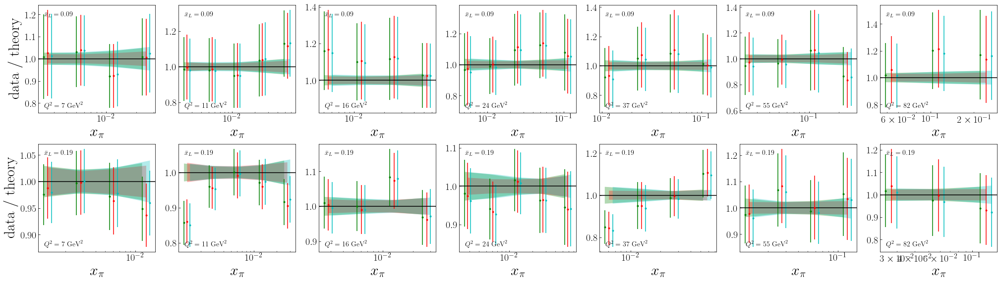

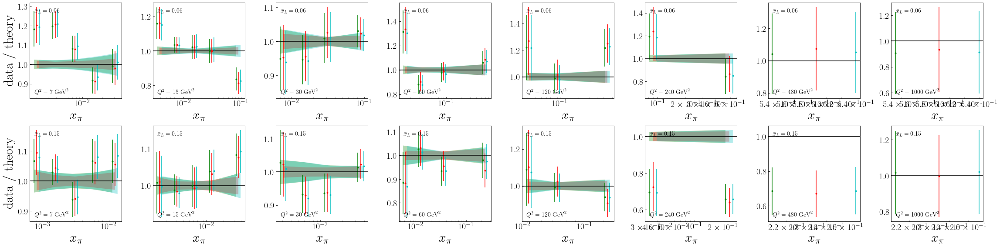

In [83]:
expts=[1000,2000]

for k in expts:
    plot_data_over_theory_clusters_LN(wdir,book1.predictions,k,labels)

In [ ]:
def test():
    tab=pd.read_excel('/home/barryp/myJAM/JAM/fitpack2/database/current-current-pion/expdata/12781.xlsx')
    d=pd.DataFrame(tab)
    mom=2*np.pi/d['L']/d['a']/5*d['p']
    print(mom.values)

    tab=pd.read_excel('/home/barryp/myJAM/JAM/fitpack2/database/current-current-pion/expdata/13581.xlsx')
    d=pd.DataFrame(tab)
    mom=2*np.pi/d['L']/d['a']/5*d['p']
    print(mom.values)

    tab=pd.read_excel('/home/barryp/myJAM/JAM/fitpack2/database/current-current-pion/expdata/14131.xlsx')
    d=pd.DataFrame(tab)
    print(d['p'])
    mom=2*np.pi/d['L']/d['a']/5*d['p']
    print(mom.values)

    tab=pd.read_excel('/home/barryp/myJAM/JAM/fitpack2/database/current-current-pion/expdata/14132.xlsx')
    d=pd.DataFrame(tab)
    print(d['p'])
    mom=2*np.pi/d['L']/d['a']/5*d['p']
    print(mom.values)

test()

In [96]:
def get_goodcluster_samples(wdir,samples,labels,badcluster,active_list=[]):
    cnt=0
    goodsamples=[]
    for i in range(len(samples)):
        if labels[i]==badcluster: continue
        goodsamples.append(samples[i])
    checkdir('%s/data'%wdir)
    np.save('%s/data/samples'%wdir,np.array(samples))
    return np.array(goodsamples)


In [ ]:
get_goodcluster_samples(wdir,book1.samples,labels,1)

In [52]:
def rmclusters(wdir,labels,badcluster):
    
    mcfiles=os.listdir('%s/mcrun'%wdir)
    cnt=0
    for fname in mcfiles:
        if labels[cnt]==badcluster:
            send_command('rm %s/mcrun/%s'%(wdir,fname))
        cnt+=1

In [66]:
rmclusters('analysis-LCS/ccLCS/DMcp/',labels,1)

In [10]:
class BOOK2:
    
    def __init__(self,wdir,input_file,active_list=[]):
        self.input_file=input_file
        self.active_list=active_list
        checkdir('%s/data'%wdir)
        
#         self.samples=get_samples(wdir,self.active_list)
        if 'red_chi2.npy' not in os.listdir('%s/data'%wdir): 
            self.setup(wdir)
        else:
            self.red_chi2=np.load('%s/data/red_chi2.npy'%wdir)
            
        self.samples=np.load('%s/data/samples.npy'%wdir)
        if 'predictions.npy' in os.listdir('%s/data'%wdir):
            self.predictions=np.load('%s/data/predictions.npy'%wdir,allow_pickle=True).item(0)
        else: 
            self.predictions=gen_predictions(wdir,self.samples,self.input_file,self.active_list)
            
        if 'chi2.npy' not in os.listdir('%s/data'%wdir):
            self.chi2=gen_mean_chi2(wdir,self.predictions,self.samples)
        else:
            self.chi2=np.load('%s/data/chi2.npy'%wdir,allow_pickle=True).item(0)
                
        if 'pdf.npy' in os.listdir('%s/data'%wdir):
            self.pdfs=np.load('%s/data/pdf.npy'%wdir,allow_pickle=True).item(0)
        else:
            self.pdfs=gen_pdf(wdir,self.samples,self.input_file,self.active_list)
            
        if 'pdfmoms.npy' in os.listdir('%s/data'%wdir):
            self.pdfmoms=np.load('%s/data/pdfmoms.npy'%wdir,allow_pickle=True).item(0)
        else:
            self.pdfmoms=gen_pdf_mom(wdir,self.samples,self.input_file,self.active_list)

    def setup(self,wdir):

        self.samples=get_samples(wdir,self.active_list)
        labels=cluster(wdir,self.samples,['ubv1 a','ubv1 b','ubv1 c'],3,self.input_file)
        newsamples=[]
        for i in range(len(self.samples)):
            if labels[i]==1: continue
            else: newsamples.append(self.samples[i])
        self.samples=newsamples    
        checkdir('%s/data'%wdir)
        np.save('%s/data/samples'%wdir,np.array(self.samples))
        self.red_chi2=gen_red_chi2(wdir,self.samples,self.input_file,self.active_list)
#         time.sleep(3)
#         self.samples=get_samples(wdir,self.active_list)


In [11]:
book1=BOOK2('analysis-LCS/ccLCS/DMcp','analysis-LCS/ccLCS/DMcp/input.npy')

retrieving samples 778/778loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132
loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertainty
10003 has norm uncertainty
loading ln data sets 1000
loading ln data sets 2000
1000 has norm uncertainty
2000 has norm uncertainty
loading ccLCS data sets 12781
loading ccLCS data sets 13581
loading ccLCS data sets 14131
loading ccLCS data sets 14132
computing red chi2 717/717loading dy-pion data sets 10001
loading dy-pion data sets 10002
loading dy-pion data sets 10003
10001 has norm uncertainty
10002 has norm uncertai

In [76]:
print(len(book1.samples))

717


In [15]:
def plot_pdfs_reps(wdir,pdfs):
    
    newpdf=pdfs
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    print(len(newpdf['XF']['valence']))
    [ax.plot(newpdf['X'],_,'r',alpha=0.1) for _ in newpdf['XF']['valence']]
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(newpdf['X'],np.std(newpdf['XF']['valence'],axis=0)/np.mean(newpdf['XF']['valence'],axis=0),'r',lw=3)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
    ax.set_ylim(0,0.15)
    ax.set_xlim(0.2,0.9)
    # ax.semilogy()
    ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08,0.09,0.1,0.11,0.12,0.13,0.14,0.15])
    ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$','',r'$0.1$','',r'$0.12$','',r'$0.14$',''])

    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    checkdir('%s/gallery'%wdir)
    py.savefig('%s/gallery/pdfval_mod2.png'%wdir)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


61


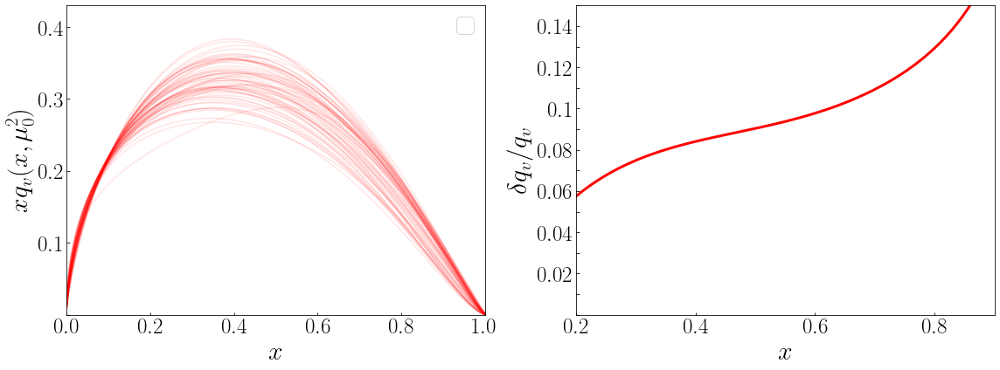

In [16]:
# wdir='analysis-LCS/ccLCS/DMcp'
# book1=BOOK(wdir,'%s/input.npy'%wdir)
# plot_pdfs(wdir,nolattPDFs,book1.pdfs)
plot_pdfs_reps(wdir,book1.pdfs)

In [45]:
def plot_pdfs_all_reps_clusters(wdir,nolatt,pdfs,labels):
    
    newpdf=pdfs
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))

    c=['g','r','c','b']

    labelflag=True
    ax=py.subplot(nrows,ncols,1)
    for i in range(len(newpdf['XF']['valence'])):
        cluster=labels[i]
#         if cluster!=1: continue
        if labelflag:
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=1,label=r'$\rm with~lattice$')
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color='w',alpha=1)
            labelflag=False
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
        else:
            ax.plot(newpdf['X'],newpdf['XF']['valence'][i],color=c[cluster],alpha=0.1)
#     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['valence']]
    labelflag=True
    for i in range(len(nolatt['XF']['valence'])):
        if labelflag:
#             ax.plot(nolatt['X'],nolatt['XF']['valence'][i],'g',alpha=0.1,label=r'$\rm expt~only$')
            ax.plot(nolatt['X'],nolatt['XF']['valence'][i],'k--',alpha=1,label=r'$\rm expt~only~from~red~priors$')
            labelflag=False
            ax.plot(nolatt['X'],nolatt['XF']['valence'][i],'w',alpha=1)
            ax.plot(nolatt['X'],nolatt['XF']['valence'][i],'k--',alpha=0.1)
        else:
            ax.plot(nolatt['X'],nolatt['XF']['valence'][i],'k--',alpha=0.1)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,2)
#     for i in range(len(newpdf['XF']['sea'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(newpdf['X'],newpdf['XF']['sea'][i],color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_,'y',alpha=0.1) for _ in oldpdf['XF']['sea']]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xq_s(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)

#     ax=py.subplot(nrows,ncols,3)
#     for i in range(len(newpdf['XF']['g'])):
#         cluster=labels[i]
# #         if cluster==1: continue
#         ax.plot(newpdf['X'],np.array(newpdf['XF']['g'][i])/10,color=c[cluster],alpha=0.1)
# #     [ax.plot(oldpdf['X'],_/10,'y',alpha=0.1) for _ in np.array(oldpdf['XF']['g'])]
#     ax.set_xlabel(r'$x$',size=30)
#     ax.set_ylabel(r'$xg(x,\mu_0^2)$',size=30)
#     ax.set_xlim(0,1)
#     ax.set_ylim(0,0.43)
#     ax.set_yticks([0,0.1,0.2,0.3,0.4])
#     ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
# #     ax.legend(fontsize=25)
#     ax.tick_params(direction='in',which='both',labelsize=25)


    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
#     py.savefig('%s/gallery/pdf_clusters_val_beforeafter.png'%wdir)

In [ ]:
wdir='analysis-LCS/ccLCS/DM_expt_only/'
book2=BOOK(wdir,'%s/input.npy'%wdir)
plot_pdfs_all_reps_clusters(wdir,book2.pdfs,book1.pdfs,labels)

# Impacts

In [25]:
def plot_pdfs_impact(wdir,nolatt,pdfs100,pdfs50,pdfs10):
    
#     newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    ax.plot(pdfs100['X'],np.mean(pdfs100['XF']['valence'],axis=0),'r',label=r'$\rm full~uncertainties$')
    ax.fill_between(pdfs100['X'],np.mean(pdfs100['XF']['valence'],axis=0)-np.std(pdfs100['XF']['valence'],axis=0),np.mean(pdfs100['XF']['valence'],axis=0)+np.std(pdfs100['XF']['valence'],axis=0),alpha=0.5,fc='r')
    ax.plot(pdfs50['X'],np.mean(pdfs50['XF']['valence'],axis=0),'g',label=r'$50\%~{\rm uncertainties}$')
    ax.fill_between(pdfs50['X'],np.mean(pdfs50['XF']['valence'],axis=0)-np.std(pdfs50['XF']['valence'],axis=0),np.mean(pdfs50['XF']['valence'],axis=0)+np.std(pdfs50['XF']['valence'],axis=0),alpha=0.5,fc='g')
    ax.plot(pdfs10['X'],np.mean(pdfs10['XF']['valence'],axis=0),'c',label=r'$10\%~{\rm uncertainties}$')
    ax.fill_between(pdfs10['X'],np.mean(pdfs10['XF']['valence'],axis=0)-np.std(pdfs10['XF']['valence'],axis=0),np.mean(pdfs10['XF']['valence'],axis=0)+np.std(pdfs10['XF']['valence'],axis=0),alpha=0.5,fc='c')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0)-np.std(oldpdf['XF']['valence'],axis=0),np.mean(oldpdf['XF']['valence'],axis=0)+np.std(oldpdf['XF']['valence'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(pdfs100['X'],np.std(pdfs100['XF']['valence'],axis=0)/np.mean(pdfs100['XF']['valence'],axis=0),'r',lw=3)
    ax.plot(pdfs50['X'],np.std(pdfs50['XF']['valence'],axis=0)/np.mean(pdfs50['XF']['valence'],axis=0),'g',lw=3)
    ax.plot(pdfs10['X'],np.std(pdfs10['XF']['valence'],axis=0)/np.mean(pdfs10['XF']['valence'],axis=0),'c',lw=3)
    ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
    ax.set_ylim(0,0.2)
    ax.set_xlim(0.2,0.9)
    # ax.semilogy()
#     ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08])
#     ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$'])

    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    py.savefig('%s/gallery/pdfval.png'%wdir)
    py.savefig('%s/gallery/pdfval.pdf'%wdir)

In [28]:
# pdfs100=np.load('analysis-LCS/ccLCS/baseline/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
# pdfs50=np.load('analysis-LCS/ccLCS/stat_u_50percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
# pdfs10=np.load('analysis-LCS/ccLCS/stat_u_10percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs100=np.load('analysis-LCS/ccLCS/DM/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs50=np.load('analysis-LCS/ccLCS/DM_stat_u_50/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs10=np.load('analysis-LCS/ccLCS/DM_stat_u_10/data/pdf.npy',allow_pickle=True,encoding='latin1').item()

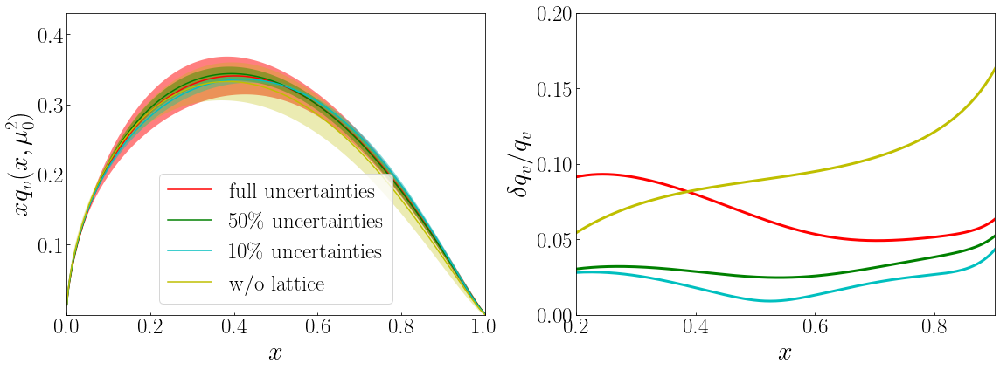

In [29]:
plot_pdfs_impact('analysis-LCS/ccLCS/DM/',nolattPDFs,pdfs100,pdfs50,pdfs10)

In [44]:
def plot_pdfs_impact(wdir,nolatt,pdfs,impactpdfs):
    
    newpdf=impactpdfs
    oldpdf=nolatt
    midpdf=pdfs
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    ax.plot(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0),'r',label=r'$\rm reduced~statistical~uncertainties$')
    ax.fill_between(newpdf['X'],np.mean(newpdf['XF']['valence'],axis=0)-np.std(newpdf['XF']['valence'],axis=0),np.mean(newpdf['XF']['valence'],axis=0)+np.std(newpdf['XF']['valence'],axis=0),alpha=0.5,fc='r')
    ax.plot(midpdf['X'],np.mean(midpdf['XF']['valence'],axis=0),'g',label=r'$\rm experimental+lattice$')
    ax.fill_between(midpdf['X'],np.mean(midpdf['XF']['valence'],axis=0)-np.std(midpdf['XF']['valence'],axis=0),np.mean(midpdf['XF']['valence'],axis=0)+np.std(midpdf['XF']['valence'],axis=0),alpha=0.5,fc='g')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0)-np.std(oldpdf['XF']['valence'],axis=0),np.mean(oldpdf['XF']['valence'],axis=0)+np.std(oldpdf['XF']['valence'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(newpdf['X'],np.std(newpdf['XF']['valence'],axis=0)/np.mean(newpdf['XF']['valence'],axis=0),'r',lw=3)
    ax.plot(midpdf['X'],np.std(midpdf['XF']['valence'],axis=0)/np.mean(midpdf['XF']['valence'],axis=0),'g',lw=3)
    ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
    ax.set_ylim(0,0.2)
    ax.set_xlim(0.2,0.9)
    # ax.semilogy()
#     ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08])
#     ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$'])

    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
    py.savefig('%s/gallery/pdfvalimpact.png'%wdir)
    py.savefig('%s/gallery/pdfvalimpact.pdf'%wdir)

In [43]:
print(len(nolattPDFs))
wdir1='analysis-LCS/ccLCS/impact/'
book1=BOOK(wdir1,'%s/input.npy'%wdir1)
wdir2='analysis-LCS/ccLCS/DM_B_R/'
book2=BOOK(wdir2,'%s/input.npy'%wdir2)

3


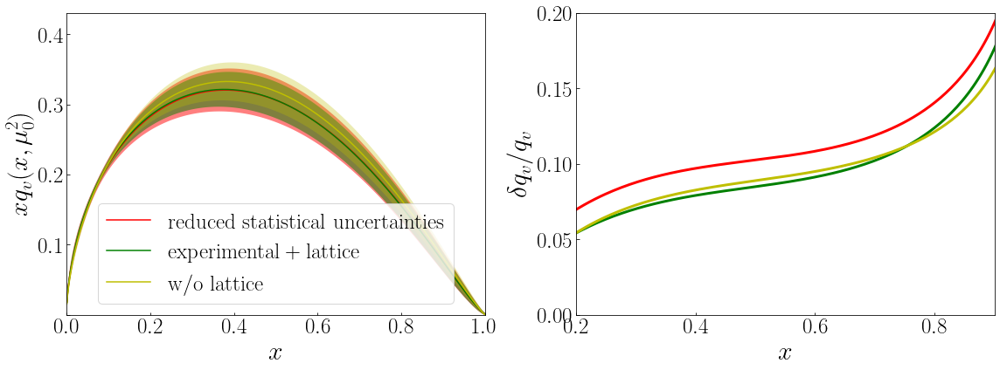

In [45]:
plot_pdfs_impact('analysis-LCS/ccLCS/impact',nolattPDFs,book1.pdfs,book2.pdfs)

In [18]:
def plot_pdfs_impact(wdir,nolatt,pdfs100,pdfs90,pdfs80,pdfs70,pdfs60,pdfs50,pdfs10):
    
#     newpdf=pdfs
    oldpdf=nolatt
    
    nrows,ncols=1,2
    py.figure(figsize=(8*ncols,6*nrows))

    ax=py.subplot(nrows,ncols,1)
    ax.plot(pdfs100['X'],np.mean(pdfs100['XF']['valence'],axis=0),'r',label=r'$\rm full~uncertainties$')
    ax.fill_between(pdfs100['X'],np.mean(pdfs100['XF']['valence'],axis=0)-np.std(pdfs100['XF']['valence'],axis=0),np.mean(pdfs100['XF']['valence'],axis=0)+np.std(pdfs100['XF']['valence'],axis=0),alpha=0.5,fc='r')
    ax.plot(pdfs90['X'],np.mean(pdfs90['XF']['valence'],axis=0),'m',label=r'$90\%~{\rm uncertainties}$')
    ax.fill_between(pdfs90['X'],np.mean(pdfs90['XF']['valence'],axis=0)-np.std(pdfs90['XF']['valence'],axis=0),np.mean(pdfs90['XF']['valence'],axis=0)+np.std(pdfs90['XF']['valence'],axis=0),alpha=0.5,fc='m')
    ax.plot(pdfs80['X'],np.mean(pdfs80['XF']['valence'],axis=0),'k',label=r'$80\%~{\rm uncertainties}$')
    ax.fill_between(pdfs80['X'],np.mean(pdfs80['XF']['valence'],axis=0)-np.std(pdfs80['XF']['valence'],axis=0),np.mean(pdfs80['XF']['valence'],axis=0)+np.std(pdfs80['XF']['valence'],axis=0),alpha=0.5,fc='k')
    ax.plot(pdfs70['X'],np.mean(pdfs70['XF']['valence'],axis=0),'b',label=r'$70\%~{\rm uncertainties}$')
    ax.fill_between(pdfs70['X'],np.mean(pdfs70['XF']['valence'],axis=0)-np.std(pdfs70['XF']['valence'],axis=0),np.mean(pdfs70['XF']['valence'],axis=0)+np.std(pdfs70['XF']['valence'],axis=0),alpha=0.5,fc='b')
    ax.plot(pdfs60['X'],np.mean(pdfs60['XF']['valence'],axis=0),'orange',label=r'$60\%~{\rm uncertainties}$')
    ax.fill_between(pdfs60['X'],np.mean(pdfs60['XF']['valence'],axis=0)-np.std(pdfs60['XF']['valence'],axis=0),np.mean(pdfs60['XF']['valence'],axis=0)+np.std(pdfs60['XF']['valence'],axis=0),alpha=0.5,fc='orange')
    ax.plot(pdfs50['X'],np.mean(pdfs50['XF']['valence'],axis=0),'g',label=r'$50\%~{\rm uncertainties}$')
    ax.fill_between(pdfs50['X'],np.mean(pdfs50['XF']['valence'],axis=0)-np.std(pdfs50['XF']['valence'],axis=0),np.mean(pdfs50['XF']['valence'],axis=0)+np.std(pdfs50['XF']['valence'],axis=0),alpha=0.5,fc='g')
    ax.plot(pdfs10['X'],np.mean(pdfs10['XF']['valence'],axis=0),'c',label=r'$10\%~{\rm uncertainties}$')
    ax.fill_between(pdfs10['X'],np.mean(pdfs10['XF']['valence'],axis=0)-np.std(pdfs10['XF']['valence'],axis=0),np.mean(pdfs10['XF']['valence'],axis=0)+np.std(pdfs10['XF']['valence'],axis=0),alpha=0.5,fc='c')
    ax.plot(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0),'y',label=r'$\rm w/o~lattice$')
    ax.fill_between(oldpdf['X'],np.mean(oldpdf['XF']['valence'],axis=0)-np.std(oldpdf['XF']['valence'],axis=0),np.mean(oldpdf['XF']['valence'],axis=0)+np.std(oldpdf['XF']['valence'],axis=0),alpha=0.3,fc='y')
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
    ax.set_xlim(0,1)
    ax.set_ylim(0,0.43)
    ax.set_yticks([0,0.1,0.2,0.3,0.4])
    ax.set_yticklabels(['',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$'])
    ax.legend(fontsize=25)
    ax.tick_params(direction='in',which='both',labelsize=25)

    ax=py.subplot(nrows,ncols,2)
    ax.plot(pdfs100['X'],np.std(pdfs100['XF']['valence'],axis=0)/np.mean(pdfs100['XF']['valence'],axis=0),'r',lw=3)
    ax.plot(pdfs90['X'],np.std(pdfs90['XF']['valence'],axis=0)/np.mean(pdfs90['XF']['valence'],axis=0),'m',lw=3)
    ax.plot(pdfs80['X'],np.std(pdfs80['XF']['valence'],axis=0)/np.mean(pdfs80['XF']['valence'],axis=0),'k',lw=3)
    ax.plot(pdfs70['X'],np.std(pdfs70['XF']['valence'],axis=0)/np.mean(pdfs70['XF']['valence'],axis=0),'b',lw=3)
    ax.plot(pdfs60['X'],np.std(pdfs60['XF']['valence'],axis=0)/np.mean(pdfs60['XF']['valence'],axis=0),'orange',lw=3)
    ax.plot(pdfs50['X'],np.std(pdfs50['XF']['valence'],axis=0)/np.mean(pdfs50['XF']['valence'],axis=0),'g',lw=3)
    ax.plot(pdfs10['X'],np.std(pdfs10['XF']['valence'],axis=0)/np.mean(pdfs10['XF']['valence'],axis=0),'c',lw=3)
    ax.plot(oldpdf['X'],np.std(oldpdf['XF']['valence'],axis=0)/np.mean(oldpdf['XF']['valence'],axis=0),'y',lw=3)
    ax.set_xlabel(r'$x$',size=30)
    ax.set_ylabel(r'$\delta q_v/q_v$',size=30)
    ax.set_ylim(0,0.08)
    ax.set_xlim(0.2,0.9)
    # ax.semilogy()
    ax.set_yticks([0,0.01,0.02,0.03,0.04,0.05,0.06,0.07,0.08])
    ax.set_yticklabels(['','',r'$0.02$','',r'$0.04$','',r'$0.06$','',r'$0.08$'])

    ax.tick_params(direction='in',which='both',labelsize=25)

    py.tight_layout()
#     py.savefig('%s/gallery/pdfval.png'%wdir)
#     py.savefig('%s/gallery/pdfval.pdf'%wdir)

In [19]:
pdfs100=np.load('analysis-LCS/ccLCS/baseline/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs90=np.load('analysis-LCS/ccLCS/stat_u_90percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs80=np.load('analysis-LCS/ccLCS/stat_u_80percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs70=np.load('analysis-LCS/ccLCS/stat_u_70percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs60=np.load('analysis-LCS/ccLCS/stat_u_60percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs50=np.load('analysis-LCS/ccLCS/stat_u_50percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
pdfs10=np.load('analysis-LCS/ccLCS/stat_u_10percent/data/pdf.npy',allow_pickle=True,encoding='latin1').item()

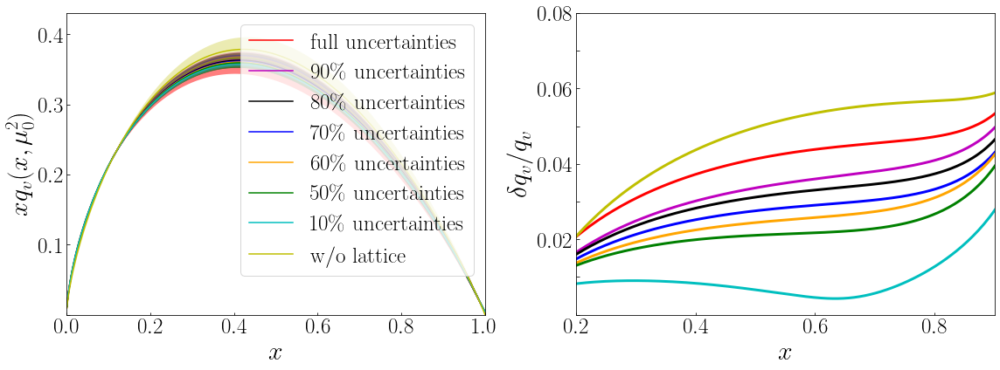

In [20]:
plot_pdfs_impact('analysis-LCS/ccLCS/baseline/',nolattPDFs,pdfs100,pdfs90,pdfs80,pdfs70,pdfs60,pdfs50,pdfs10)

# Extreme systematics

In [12]:
def plot_data_and_theory_sysnosys_extreme(wdir,data,datanosys,expt):
    
    tab=copy.deepcopy(data['ccLCS'][expt])
    zunique=np.unique(tab['ZoA'])
    nrows=1
    ncols=len(zunique)
    py.figure(figsize=(6*ncols,6*nrows))
    
    cnt=0
    p=tab
    pnosys=copy.deepcopy(datanosys['ccLCS'][expt])

    for i in range(len(zunique)):
        cnt+=1
        
        theory1=p['prediction-rep'][544]
        theory2=p['prediction-rep'][187]
        theorynosys1=pnosys['prediction-rep'][544]
        theorynosys2=pnosys['prediction-rep'][187]
        onlysys=[]
        for j in range(len(p['prediction-rep'])):
            onlysys.append(p['prediction-rep'][j]-pnosys['prediction-rep'][j])
        theory1sys=onlysys[544]
        theory2sys=onlysys[187]
        
        nu=[]
        vals=[]
        alphas=[]
#         meanthy=[]
#         stdthy=[]
#         meanthynosys=[]
#         stdthynosys=[]
#         meanthyonlysys=[]
#         stdthyonlysys=[]
        thy1=[]
        thy2=[]
        thy1nosys=[]
        thy2nosys=[]
        thy1sys=[]
        thy2sys=[]
        
        for j in range(len(p['N'])):
            if p['ZoA'][j]==zunique[i]:
                nu.append(p['nu'][j])
                vals.append(p['value'][j])
                alphas.append(p['alpha'][j])
                thy1.append(theory1[j])
                thy2.append(theory2[j])
                thy1nosys.append(theorynosys1[j])
                thy2nosys.append(theorynosys2[j])
                thy1sys.append(theory1sys[j])
                thy2sys.append(theory2sys[j])
                
        nu=np.array(nu)
        vals=np.array(vals)
        alphas=np.array(alphas)
#         meanthy=np.array(meanthy)
#         stdthy=np.array(stdthy)
#         meanthynosys=np.array(meanthynosys)
#         stdthynosys=np.array(stdthynosys)
#         meanthyonlysys=np.array(meanthyonlysys)
#         stdthyonlysys=np.array(stdthyonlysys)
        thy1=np.array(thy1)
        thy2=np.array(thy2)
        thy1nosys=np.array(thy1nosys)
        thy2nosys=np.array(thy2nosys)
        thy1sys=np.array(thy1sys)
        thy2sys=np.array(thy2sys)
        
        if len(nu)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.errorbar(nu,vals,yerr=alphas,fmt='.',c='k',label=r'$z=%i a$'%zunique[i])
#         ax.fill_between(nu,meanthy-stdthy,meanthy+stdthy,alpha=0.3,fc='r',label=r'$\rm full$')
#         ax.fill_between(nu,meanthynosys-stdthynosys,meanthynosys+stdthynosys,alpha=0.3,fc='g',label=r'$\rm no~sys$')
#         ax.fill_between(nu,meanthyonlysys-stdthyonlysys,meanthyonlysys+stdthyonlysys,alpha=0.3,fc='c',label=r'$\rm only~sys$')
        ax.plot(nu,thy1,'r-.',label=r'$\rm full$')
        ax.plot(nu,thy2,'g-.',label=r'$\rm full$')
        ax.plot(nu,thy1nosys,'r--',label=r'$\rm no~sys$')
        ax.plot(nu,thy2nosys,'g--',label=r'$\rm no~sys$')
        ax.plot(nu,np.abs(thy1sys),'r:',label=r'$\rm |only~sys|$')
        ax.plot(nu,np.abs(thy2sys),'g:',label=r'$\rm |only~sys|$')
        
        ax.tick_params(direction='in',which='both',labelsize=20)
        ax.legend(fontsize=25,loc='center left')#,frameon=False)
        ax.set_xlabel(r'$\nu$',size=30)
        ax.semilogy()
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_and_theory_ccLCS_sysbreakdown-extremes-%s.png'%(wdir,expt))
#     py.savefig('%s/gallery/data_and_theory_ccLCS_sysbreakdown-%s.pdf'%(wdir,expt))

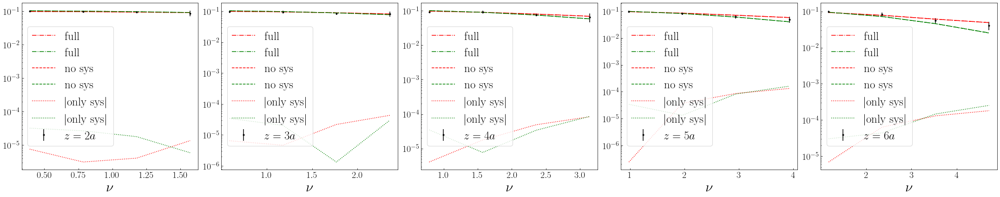

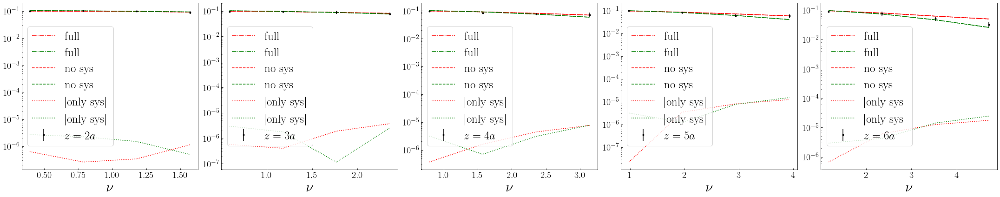

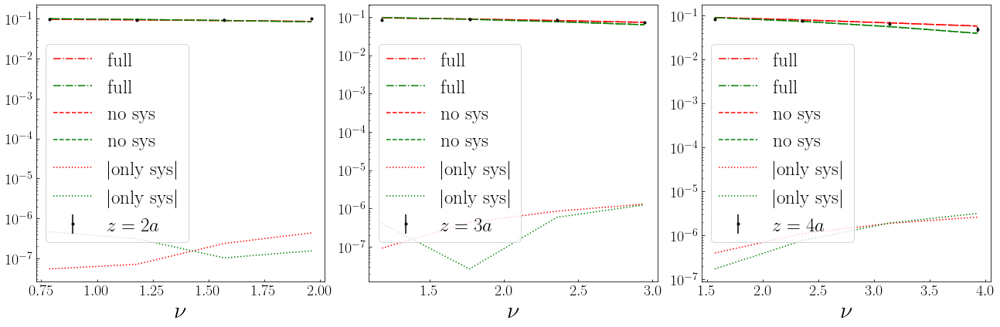

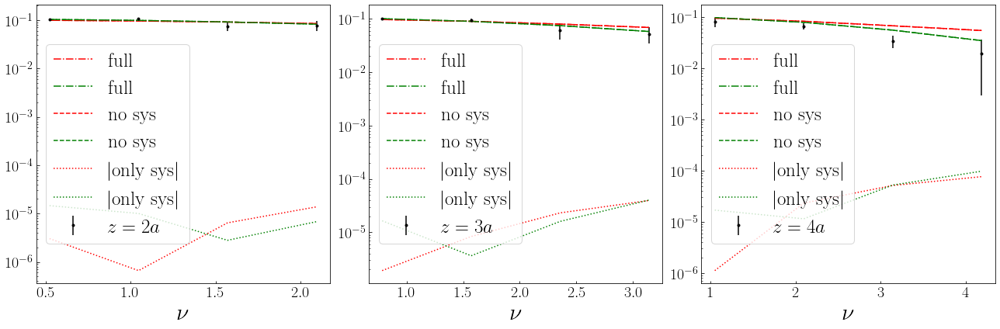

In [52]:
for k in [12781,13581,14131,14132]:
    plot_data_and_theory_sysnosys_extreme(wdir,book1.predictions,book1.predictions_nosys,k)

# Uncertainty reduction in data predictions

In [59]:
def plot_data_over_theory_DY2(wdir,data1,data2,expt):
    
    tab1=copy.deepcopy(data1['reactions']['dy-pion'][expt])
    tab2=copy.deepcopy(data2['dy-pion'][expt])
    Q2unique=np.unique(tab1['Q2'])
    nrows=1
    ncols=len(Q2unique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p1=tab1
    p2=tab2
    #--get chi2
    res1=(p1['value']-np.mean(p1['prediction-rep'],axis=0))/p1['alpha']
    res2=(p2['value']-np.mean(p2['prediction-rep'],axis=0))/p2['alpha']
    chi21=np.sum(res1**2)
    chi22=np.sum(res2**2)
    npts=len(res1)

    cnt=0
    pred1=[]
    pred2=[]
    for i in range(len(Q2unique)):
        cnt+=1
        theory1=np.mean(p1['prediction-rep'],axis=0)
        dtheory1=np.std(p1['prediction-rep'],axis=0)
        theory2=np.mean(p2['prediction-rep'],axis=0)
        dtheory2=np.std(p2['prediction-rep'],axis=0)
        xF=[]
        vals=[]
        alphas=[]
        meanthy1=[]
        stdthy1=[]
        meanthy2=[]
        stdthy2=[]
        for j in range(len(p1['N'])):
            if p1['Q2'][j]==Q2unique[i]:
                xF.append(p1['xF'][j])
                vals.append(p1['value'][j])
                alphas.append(p1['alpha'][j])
                meanthy1.append(theory1[j])
                stdthy1.append(dtheory1[j])
                meanthy2.append(theory2[j])
                stdthy2.append(dtheory2[j])
        xF=np.array(xF)
        vals=np.array(vals)
        alphas=np.array(alphas)
        meanthy1=np.array(meanthy1)
        stdthy1=np.array(stdthy1)
        meanthy2=np.array(meanthy2)
        stdthy2=np.array(stdthy2)
        if len(xF)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.plot(xF,stdthy1/meanthy1,'k--',label=r'$\rm expt~only$')
        ax.plot(xF,stdthy2/meanthy2,'r-.',label=r'$\rm w/~lattice$')
        ax.tick_params(direction='in',which='both',labelsize=20)
#         ax.text(0.05,0.05,r'$Q^2=%i~{\rm GeV}^2$'%Q2unique[i],transform=ax.transAxes,size=15)
        if i==0: ax.set_ylabel(r'$\delta \sigma/\sigma$',size=30)
        ax.legend(fontsize=18)#,frameon=False)
        ax.set_xlabel(r'$x_F$',size=30)
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_dypion-%s_comparison.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_dypion-%s_comparison.pdf'%(wdir,expt))


In [60]:
# wdir='analysis-LCS/ccLCS/DM'

1 18.27190209568878
2 22.79962475498862
3 27.828009054499496
4 33.35705499422142
5 39.386762574154375
6 45.91713179429838
7 52.94816265465342
1 18.442715868224997
2 23.688643937409
3 29.59031301524101
4 36.147723101721006
5 43.360874196849
6 51.229766300625
1 20.421769273191
2 27.188746073774993
3 34.922433845871
4 43.62283258947901
5 53.289942304599


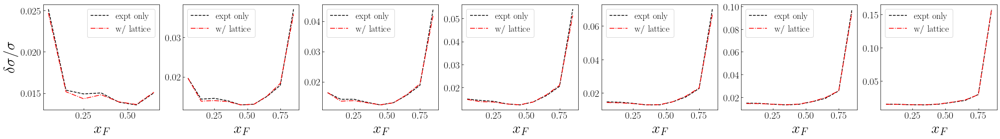

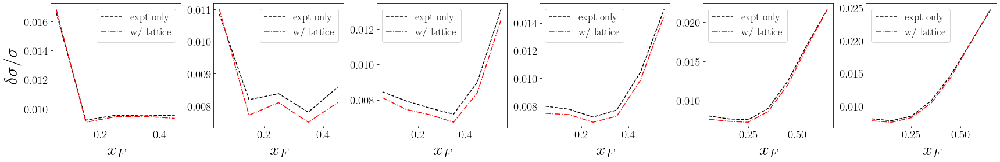

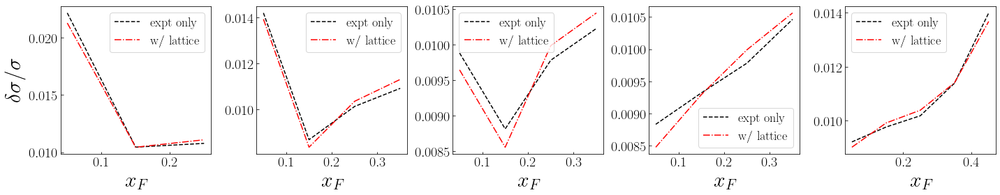

In [77]:

exptpred=load('../doublemellincopy/step18pos/data/predictions-18.dat')


# wdir2='analysis-LCS/ccLCS/DM_B_P_M_R/'
wdir='analysis-LCS/ccLCS/FV-huge_range/'
#     wdir2='analysis-LCS/ccLCS/%s'%(_)
book2=BOOK(wdir2,'%s/input.npy'%wdir2)

expts=[10001,10002,10003]

for k in expts:
    plot_data_over_theory_DY2(wdir2,exptpred,book2.predictions,k)

progress: 13/14

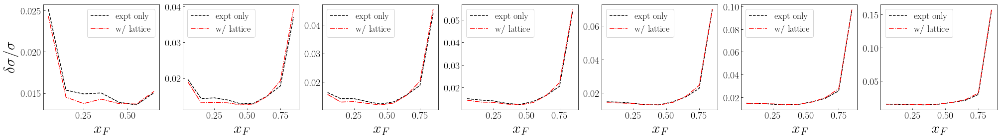

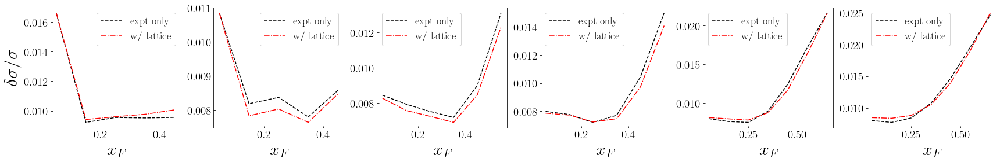

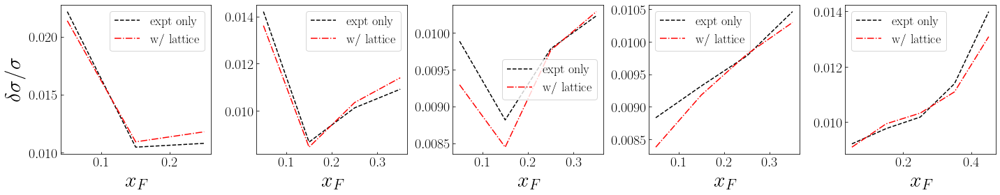

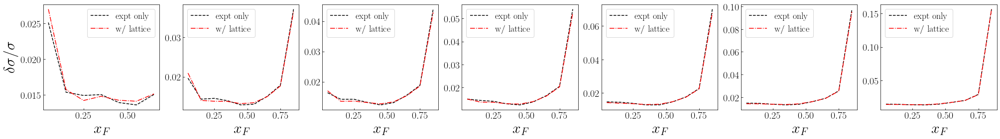

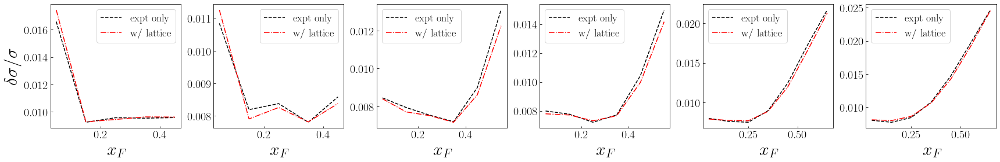

...

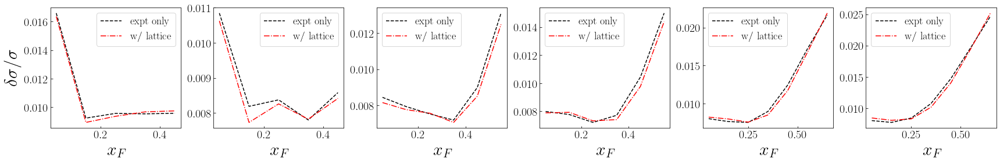

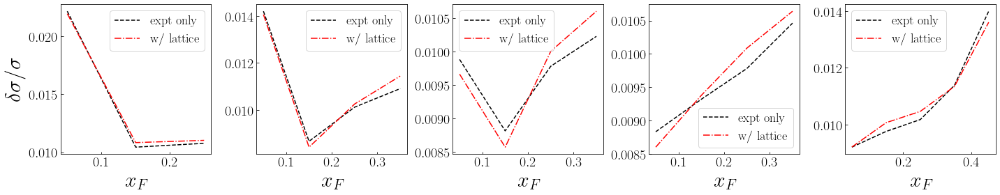

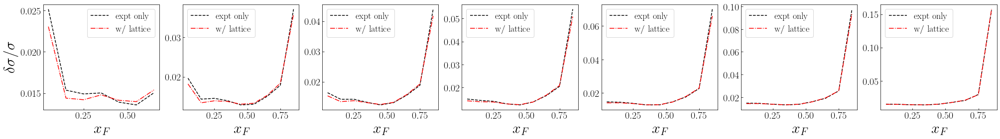

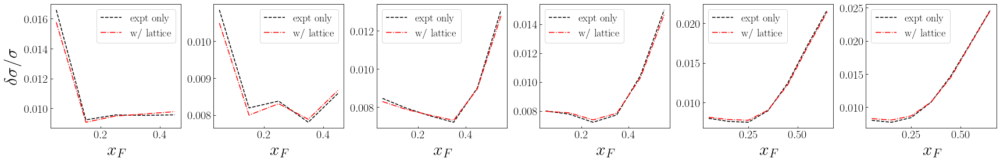

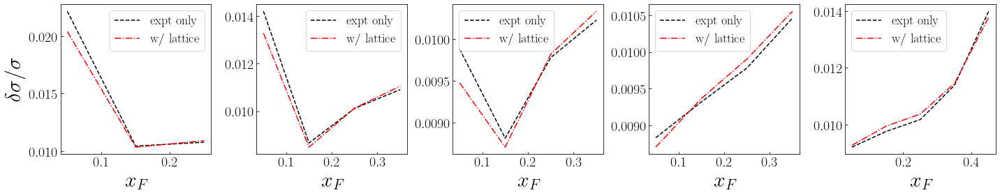

In [58]:

exptpred=load('../doublemellincopy/step18pos/data/predictions-18.dat')

dirs=['DM_B','DM_B_P','DM_B_R','DM_B_M','DM_B_R_P','DM_P','DM_P_R','DM_P_M','DM_B_P_M','DM_R','DM_M_R','DM_B_M_R','DM_M','DM_P_M_R']

for i in range(len(dirs)):
    lprint('progress: %i/%i'%(i,len(dirs)))
    _=dirs[i]

#     wdir2='analysis-LCS/ccLCS/DM_M/'
    wdir2='analysis-LCS/ccLCS/%s'%(_)
    book2=BOOK(wdir2,'%s/input.npy'%wdir2)

    expts=[10001,10002,10003]

    for k in expts:
        plot_data_over_theory_DY2(wdir2,exptpred,book2.predictions,k)

In [49]:
def plot_data_over_theory_clusters_LN(wdir,data,expt,labels):
    
    tab=copy.deepcopy(data['ln'][expt])
    print(tab.keys())
    Q2unique=np.unique(tab['Q2'])
    yunique=np.unique(tab['y'])
    xLunique=1-yunique
    nrows=2
    ncols=len(Q2unique)
    py.figure(figsize=(4*ncols,4*nrows))
    
    cnt=0
    p=tab
    #--get chi2
    res=(p['value']-np.mean(p['prediction-rep'],axis=0))/p['alpha']
    chi2=np.sum(res**2)
    print(chi2)
    npts=len(res)

    colors=['g','r','c','b']
    for k in np.unique(labels):
        cnt=0
        pred=[]
        for i in range(len(p['prediction-rep'])):
            if labels[i]==k:
                pred.append(p['prediction-rep'][i])
        for i in range(len(xLunique)):
            for j in range(len(Q2unique)):
                cnt+=1
                theory=np.mean(pred,axis=0)
                dtheory=np.std(pred,axis=0)
                xpi=[]
                vals=[]
                alphas=[]
                meanthy=[]
                stdthy=[]
                for ii in range(len(p['N'])):
                    if p['Q2'][ii]==Q2unique[j] and p['y'][ii]==yunique[i]:
                        xpi.append(p['xpi'][ii])
                        vals.append(p['value'][ii])
                        alphas.append(p['alpha'][ii])
                        meanthy.append(theory[ii])
                        stdthy.append(dtheory[ii])
                xpi=np.array(xpi)
                vals=np.array(vals)
                alphas=np.array(alphas)
                meanthy=np.array(meanthy)
                stdthy=np.array(stdthy)
                if len(xpi)==0: continue
                ax=py.subplot(nrows,ncols,cnt)
                ax.errorbar(xpi*(1+0.1*k),vals/meanthy,yerr=alphas/meanthy,fmt='.',c=colors[k])
                ax.fill_between(xpi*(1+0.1*k),1-stdthy/meanthy,1+stdthy/meanthy,alpha=0.3,fc=colors[k])
                ax.tick_params(direction='in',which='both',labelsize=20)
                ax.axhline(y=1,color='k',alpha=0.5)
                if k==0: 
                    ax.text(0.05,0.05,r'$Q^2=%i~{\rm GeV}^2$'%Q2unique[j],transform=ax.transAxes,size=14)
                    ax.text(0.05,0.9,r'$\bar{x}_L=%.2f$'%(1-xLunique[i]),transform=ax.transAxes,size=14)
                ax.semilogx()
    #         ax.set_ylim(0.99,1.01)
    #         ax.set_yticks([0.99,0.995,1,1.005,1.01])
    #         if i==0:
    #             ax.set_yticklabels([r'$0.99$','',r'$1$','',r'$1.01$'])
    #         else: ax.set_yticklabels([])
                if j==0: ax.set_ylabel(r'${\rm data~/~theory}$',size=30)
    #         ax.legend(fontsize=25,loc='upper left')#,frameon=False)
                ax.set_xlabel(r'$x_\pi$',size=30)
#         if i==0: ax.text(0.1,0.3,r'$L=%i$'%p['L'][0],transform=ax.transAxes,size=30)
#         if i==1: ax.text(0.1,0.3,r'$\chi^2/{\rm npts}=%.3f$'%(chi2/npts),transform=ax.transAxes,size=30)
#         ax.set_ylim(0.7,1.3)
#         ax.set_yticks([0.7,0.8,0.9,1,1.1,1.2,1.3])
#         ax.set_yticklabels(['',r'$0.8$','',r'$1$','',r'$1.2$',''])
    py.tight_layout()
    checkdir('%s/gallery/'%wdir)
    py.savefig('%s/gallery/data_over_theory_ln-%s_cluster.png'%(wdir,expt))
    py.savefig('%s/gallery/data_over_theory_ln-%s_cluster.pdf'%(wdir,expt))


In [82]:
# wdir='analysis-LCS/ccLCS/DM'

dict_keys(['x', 'Q2', '    xL     ', 'y', 'kT2max', 'obs', 'value', '   stat_u    ', '  sys_u', 'norm_c', 'col', 'tar', 'xpi', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
20.721305319572732
dict_keys(['x', 'Q2', 'xL', 'deltaxL', 'y', 'kT2max', 'obs', 'value', 'stat_u', 'norm_c', 'acc_c', 'en_c', 'indexQ2', 'col', 'tar', 'xpi', 'thy', 'N', 'residuals', 'r-residuals', 'Shift', 'alpha', 'prediction-rep', 'shift', 'prediction'])
79.41982590365387


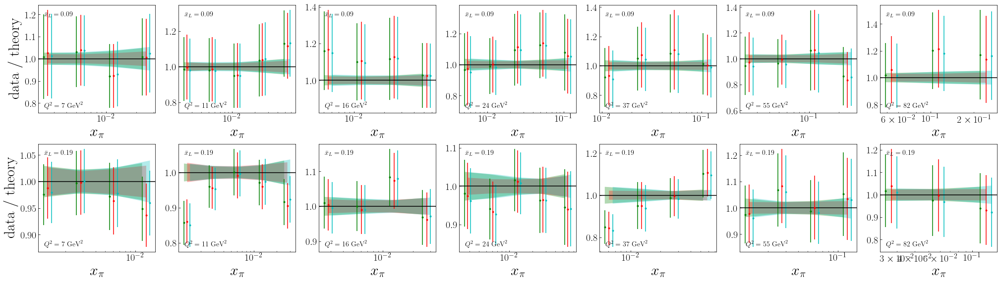

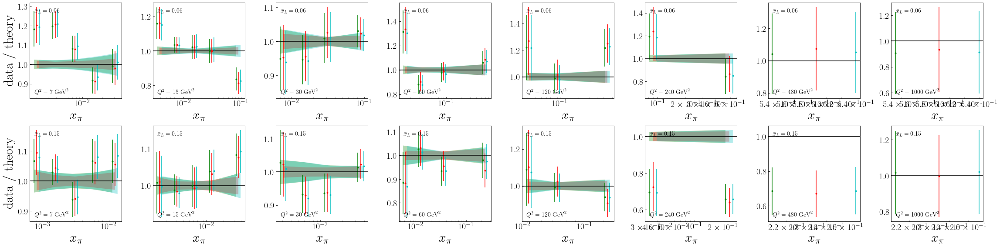

In [83]:
expts=[1000,2000]

for k in expts:
    plot_data_over_theory_clusters_LN(wdir,book1.predictions,k,labels)

# Mega PDF plot

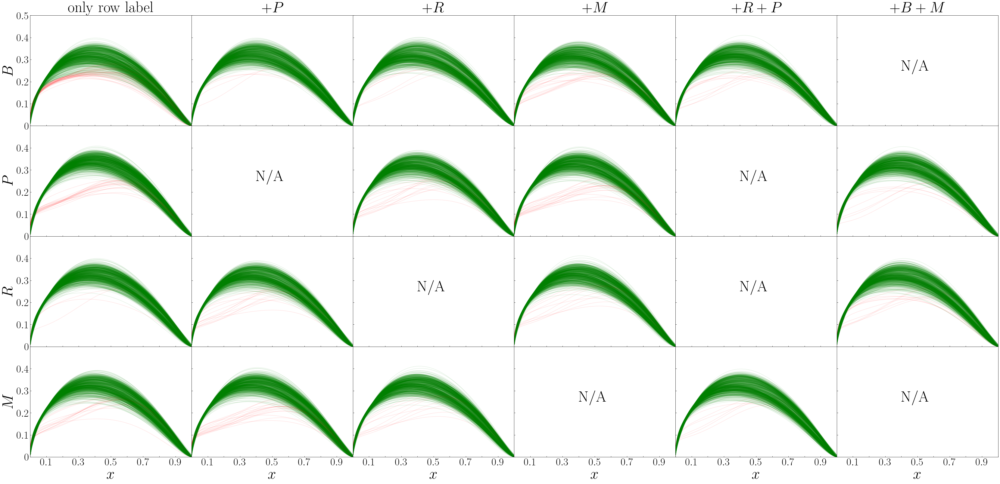

In [21]:
def mega_PDF():
    nrows,ncols=4,6
    fig = py.figure(figsize=(ncols*8,nrows*6))
    gs = gridspec.GridSpec(ncols=6, nrows=4, figure=fig
         ,left=0.05, right=0.98,top=0.95,bottom=0.1 ,wspace=0.0,hspace=0.0)

    AX={}
    cnt=0
    for i in range(nrows):
        for j in range(ncols):
            cnt+=1
            AX[cnt]=fig.add_subplot(gs[i,j])
            
#             AX[cnt].text(0.1,0.5,r'$which num: %i$'%cnt,transform=AX[cnt].transAxes,size=30)
    
    dirs=['DM_B','DM_B_P','DM_B_R','DM_B_M','DM_B_R_P','--','DM_P','--','DM_P_R','DM_P_M','--','DM_B_P_M',\
          'DM_R','DM_P_R','--','DM_M_R','--','DM_B_M_R','DM_M','DM_P_M','DM_M_R','--','DM_P_M_R','--']
    
    cnt=0
    for i in range(len(AX)):
        cnt+=1
        ax=AX[cnt]
        ax.set_yticks([0,0.1,0.2,0.3,0.4,0.5])
        if cnt==1: 
            ax.set_yticklabels([r'$0$',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$',r'$0.5$'])
            ax.set_ylabel(r'$B$',size=50)
#             ax.set_title(r'$-$',size=50)
            ax.set_title(r'$\rm only~row~label$',size=50)
        elif cnt in [7,13,19]: ax.set_yticklabels([r'$0$',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$',''])
        else: ax.set_yticklabels([])

        if cnt==2:
            ax.set_title(r'$+P$',size=50)
        elif cnt==3:
            ax.set_title(r'$+R$',size=50)
        elif cnt==4:
            ax.set_title(r'$+M$',size=50)
        elif cnt==5:
            ax.set_title(r'$+R+P$',size=50)
        elif cnt==6:
            ax.set_title(r'$+B+M$',size=50)
        elif cnt==7: ax.set_ylabel(r'$P$',size=50)
        elif cnt==13: ax.set_ylabel(r'$R$',size=50)
        elif cnt==19: ax.set_ylabel(r'$M$',size=50)
        
        ax.set_ylim(0,0.5)
        ax.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
        if cnt in [19,20,21,22,23,24]: 
            ax.set_xticklabels(['',r'$0.1$','',r'$0.3$','',r'$0.5$','',r'$0.7$','',r'$0.9$',''])
            ax.set_xlabel(r'$x$',size=50)
        else: ax.set_xticklabels([])
        ax.set_xlim(0,1)
        ax.tick_params(direction='in',axis='both',which='both',labelsize=35)
        
        if dirs[i]=='--':
            ax.text(0.4,0.5,r'$\rm N/A$',transform=ax.transAxes,size=50)
        if dirs[i]=='--': continue
        pdfs=np.load('analysis-LCS/ccLCS/%s/data/pdf.npy'%dirs[i],allow_pickle=True,encoding='latin1').item()
        
        for j in range(len(pdfs['XF']['valence'])):
            if pdfs['XF']['valence'][j][222]<0.22:
                  ax.plot(pdfs['X'],pdfs['XF']['valence'][j],color='r',alpha=0.1)
            else:
                  ax.plot(pdfs['X'],pdfs['XF']['valence'][j],color='g',alpha=0.1)
        
    py.tight_layout()
    checkdir('mega_gallery')
    py.savefig('mega_gallery/PDFs.png')
    
            
    
mega_PDF()

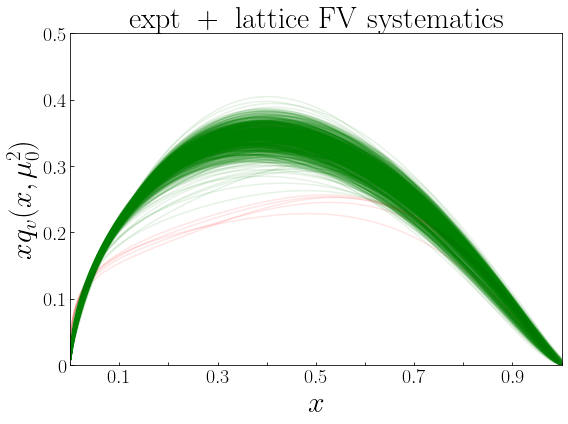

In [29]:
def test():
#     pdfs=load('../doublemellincopy/step18pos/data/pdf-18.dat')
#     pdfs=np.load('analysis-LCS/ccLCS/DM/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
#     pdfs=np.load('analysis-LCS/ccLCS/DM_B_P_M_R/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
    pdfs=np.load('analysis-LCS/ccLCS/FV-huge_range/data/pdf.npy',allow_pickle=True,encoding='latin1').item()
    
    nrows,ncols=1,1
    py.figure(figsize=(8*ncols,6*nrows))
    ax=py.subplot(nrows,ncols,1)
    X=pdfs['X']
#     print(X,len(X))
    XF=pdfs['XF']['valence']
    for j in range(len(XF)):
        if XF[j][222]<0.22:
              ax.plot(X,XF[j],color='r',alpha=0.1)
        else:
              ax.plot(X,XF[j],color='g',alpha=0.1)
                
    ax.set_yticks([0,0.1,0.2,0.3,0.4,0.5])
    ax.set_yticklabels([r'$0$',r'$0.1$',r'$0.2$',r'$0.3$',r'$0.4$',r'$0.5$'])
    ax.set_ylabel(r'$xq_v(x,\mu_0^2)$',size=30)
#     ax.set_title(r'$\rm expt~+~lattice~no~systematics$',size=30)
    ax.set_title(r'$\rm expt~+~lattice~FV~systematics$',size=30)

    ax.set_ylim(0,0.5)
    ax.set_xticks([0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1])
    ax.set_xticklabels(['',r'$0.1$','',r'$0.3$','',r'$0.5$','',r'$0.7$','',r'$0.9$',''])
    ax.set_xlabel(r'$x$',size=30)
    ax.set_xlim(0,1)
    ax.tick_params(direction='in',axis='both',which='both',labelsize=20)
    
    py.tight_layout()
    checkdir('mega_gallery/')
    py.savefig('mega_gallery/FV_PDF.png')

                
test()

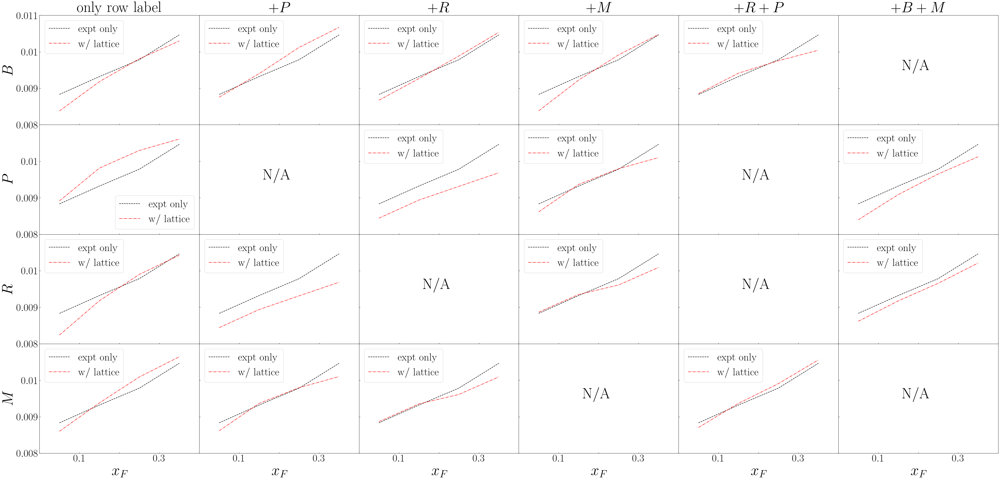

In [75]:
def mega_DY():
    nrows,ncols=4,6
    fig = py.figure(figsize=(ncols*8,nrows*6))
    gs = gridspec.GridSpec(ncols=6, nrows=4, figure=fig
         ,left=0.05, right=0.98,top=0.95,bottom=0.1 ,wspace=0.0,hspace=0.0)

    AX={}
    cnt=0
    for i in range(nrows):
        for j in range(ncols):
            cnt+=1
            AX[cnt]=fig.add_subplot(gs[i,j])
            

    tab1=load('../doublemellincopy/step18pos/data/predictions-18.dat')
    p1=copy.deepcopy(tab1['reactions']['dy-pion'][10003])
#     Q2unique=np.unique(tab1['Q2'][10003])
    dirs=['DM_B','DM_B_P','DM_B_R','DM_B_M','DM_B_R_P','--','DM_P','--','DM_P_R','DM_P_M','--','DM_B_P_M',\
          'DM_R','DM_P_R','--','DM_M_R','--','DM_B_M_R','DM_M','DM_P_M','DM_M_R','--','DM_P_M_R','--']
    
    cnt=0
    for i in range(len(AX)):
        cnt+=1
        ax=AX[cnt]
        ax.set_yticks([0.008,0.009,0.01,0.011])
        if cnt==1: 
            ax.set_yticklabels([r'$0.008$',r'$0.009$',r'$0.01$',r'$0.011$'])
            ax.set_ylabel(r'$B$',size=50)
#             ax.set_title(r'$-$',size=50)
            ax.set_title(r'$\rm only~row~label$',size=50)
        elif cnt in [1,7,13,19]: ax.set_yticklabels([r'$0.008$',r'$0.009$',r'$0.01$',''])
        else: ax.set_yticklabels([])

        if cnt==2:
            ax.set_title(r'$+P$',size=50)
        elif cnt==3:
            ax.set_title(r'$+R$',size=50)
        elif cnt==4:
            ax.set_title(r'$+M$',size=50)
        elif cnt==5:
            ax.set_title(r'$+R+P$',size=50)
        elif cnt==6:
            ax.set_title(r'$+B+M$',size=50)
        elif cnt==7: ax.set_ylabel(r'$P$',size=50)
        elif cnt==13: ax.set_ylabel(r'$R$',size=50)
        elif cnt==19: ax.set_ylabel(r'$M$',size=50)
        
        ax.set_ylim(0.008,0.011)
        ax.set_xticks([0,0.1,0.2,0.3,0.4])
        if cnt in [19,20,21,22,23,24]: 
            ax.set_xticklabels(['',r'$0.1$','',r'$0.3$',''])
            ax.set_xlabel(r'$x_F$',size=50)
        else: ax.set_xticklabels([])
        ax.set_xlim(0,0.4)
        ax.tick_params(direction='in',axis='both',which='both',labelsize=35)
        
        if dirs[i]=='--':
            ax.text(0.4,0.5,r'$\rm N/A$',transform=ax.transAxes,size=50)
        if dirs[i]=='--': continue
        tab2=np.load('analysis-LCS/ccLCS/%s/data/predictions.npy'%dirs[i],allow_pickle=True,encoding='latin1').item()
        p2=copy.deepcopy(tab2['dy-pion'][10003])
        pred1=[]
        pred2=[]
        theory1=np.mean(p1['prediction-rep'],axis=0)
        dtheory1=np.std(p1['prediction-rep'],axis=0)
        theory2=np.mean(p2['prediction-rep'],axis=0)
        dtheory2=np.std(p2['prediction-rep'],axis=0)
        xF=[]
        vals=[]
        alphas=[]
        meanthy1=[]
        stdthy1=[]
        meanthy2=[]
        stdthy2=[]
        for j in range(len(p1['N'])):
            if p1['Q2'][j]>43 and p1['Q2'][j]<44:
                xF.append(p1['xF'][j])
                vals.append(p1['value'][j])
                alphas.append(p1['alpha'][j])
                meanthy1.append(theory1[j])
                stdthy1.append(dtheory1[j])
                meanthy2.append(theory2[j])
                stdthy2.append(dtheory2[j])
        xF=np.array(xF)
        vals=np.array(vals)
        alphas=np.array(alphas)
        meanthy1=np.array(meanthy1)
        stdthy1=np.array(stdthy1)
        meanthy2=np.array(meanthy2)
        stdthy2=np.array(stdthy2)
#         if len(xF)==0: continue
        ax=py.subplot(nrows,ncols,cnt)
        ax.plot(xF,stdthy1/meanthy1,'k--',label=r'$\rm expt~only$')
        ax.plot(xF,stdthy2/meanthy2,'r-.',label=r'$\rm w/~lattice$')
#         ax.tick_params(direction='in',which='both',labelsize=20)
#         ax.text(0.05,0.05,r'$Q^2=%i~{\rm GeV}^2$'%Q2unique[i],transform=ax.transAxes,size=15)
#         if i==0: ax.set_ylabel(r'$\delta \sigma/\sigma$',size=30)
        ax.legend(fontsize=35)#,frameon=False)
#         ax.set_xlabel(r'$x_F$',size=30)
        
    py.tight_layout()
    checkdir('mega_gallery')
    py.savefig('mega_gallery/DYsigma.png')
    
            
    
mega_DY()

In [69]:
# wdir='analysis-LCS/ccLCS/DM'

progress: 13/14

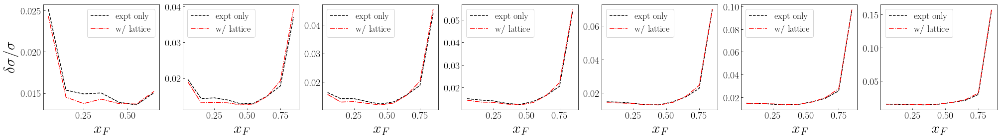

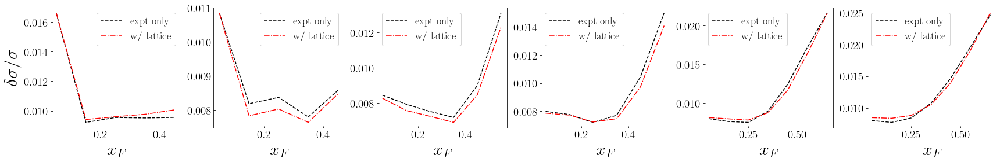

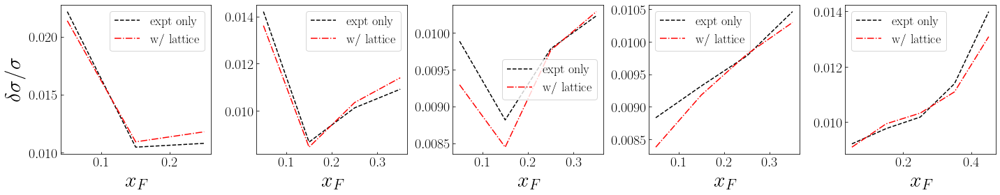

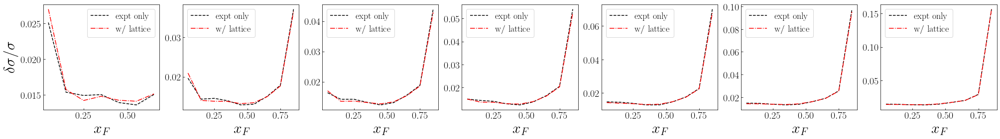

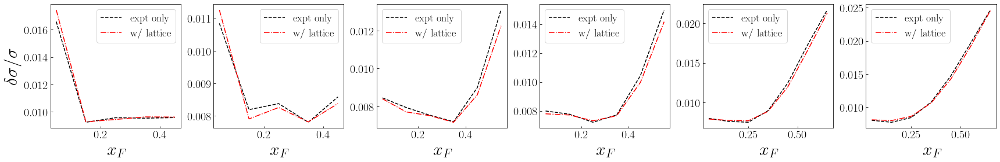

...

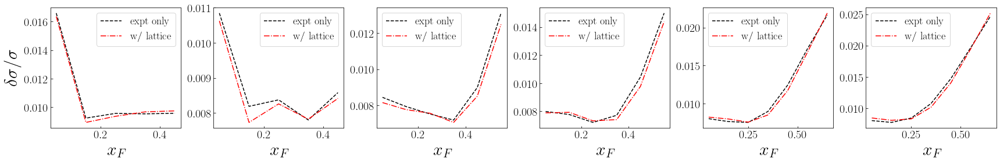

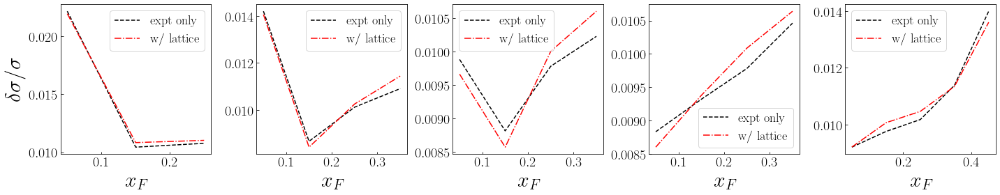

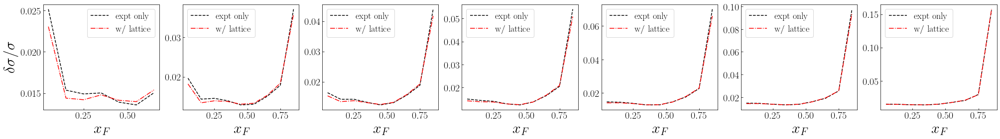

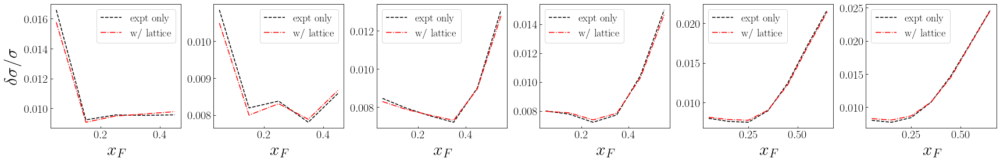

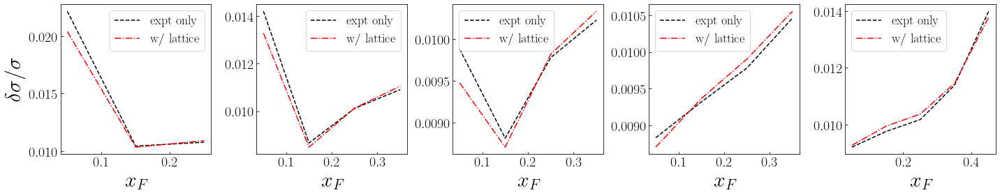

In [58]:

exptpred=load('../doublemellincopy/step18pos/data/predictions-18.dat')

dirs=['DM_B','DM_B_P','DM_B_R','DM_B_M','DM_B_R_P','DM_P','DM_P_R','DM_P_M','DM_B_P_M','DM_R','DM_M_R','DM_B_M_R','DM_M','DM_P_M_R']

for i in range(len(dirs)):
    lprint('progress: %i/%i'%(i,len(dirs)))
    _=dirs[i]

#     wdir2='analysis-LCS/ccLCS/DM_M/'
    wdir2='analysis-LCS/ccLCS/%s'%(_)
    book2=BOOK(wdir2,'%s/input.npy'%wdir2)

    expts=[10001,10002,10003]

    for k in expts:
        plot_data_over_theory_DY2(wdir2,exptpred,book2.predictions,k)